In [2]:
import csv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import normaltest
from scipy.stats import mannwhitneyu, pearsonr, spearmanr

import statsmodels.api as sm
from scipy.stats import ttest_ind, ttest_rel
from statsmodels.stats.anova import AnovaRM
from statsmodels.stats.anova import anova_lm
import seaborn as sns
from sklearn.linear_model import LinearRegression
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm
from statsmodels.formula.api import ols
import patsy
from statsmodels.stats.mediation import Mediation
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import pandas as pd
import statsmodels.formula.api as sm
from scipy.stats import chi2_contingency, f_oneway, ttest_ind
import statsmodels.formula.api as smf
from statsmodels.stats.anova import anova_lm
import statsmodels.stats.api as sms
import pingouin as pg

import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from scipy.stats import chi2

# For multicollinearity: VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor


/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [3]:
df_fitbit = pd.read_excel('SEED_fitbit_data_02.09.2023.xlsx', header=0)
df_fitbit['Participant number'] = df_fitbit['Participant number'].astype(str).str.strip()

np.unique(df_fitbit['Participant number'])

all_participants_data = []

for i in range(1, 42):
    participant_id = 'SG{}'.format(i)
    next_participant_id = 'SG{}'.format(i+1)
    
    if i == 27:
        continue
    # Check if it is the last participant
    if i == 41:
        indices_participant = df_fitbit[(df_fitbit['Participant number'] == participant_id)].index
        participant_data = df_fitbit.iloc[indices_participant[0]+1:-1]
    else:
        if next_participant_id not in df_fitbit['Participant number'].unique():
            next_participant_id = 'SG{}'.format(i+2)
        indices_participant = df_fitbit[(df_fitbit['Participant number'] == participant_id) | (df_fitbit['Participant number'] == next_participant_id)].index
        participant_data = df_fitbit.iloc[indices_participant[0]+1:indices_participant[-1]-2]
    
    participant_weekly_data = []
    for w in range(1, 14):
        week_indices = participant_data[participant_data['Week Number Outline'] == w].index
        metrics = {
            'Participant ID': i,
            'Week': w,
            'recorded': 0,
            'percentage_recorded': 0
        }
        print(f"participant{i}, Week{w}")
        if (i == 41 and w==13) or week_indices.empty:
            # If no days meet the criteria, we fill with NaN or some other default value
            participant_weekly_data.append(metrics)
            continue
        # Extract data for this week
        participant_week = df_fitbit.iloc[week_indices[0]:week_indices[-1]+1]  
        recorded_days = participant_week['Total Days Possible'].iloc[-1:].values[0]

        check_cols = ['Date','Steps', 'Activity Calories', 'Calories Burned', 'Active Minutes', 'Minutes Lightly Active','Minutes Fairly Active','Minutes Very Active','Minutes Sedentary','Recorded Days','Distance']
        participant_week = participant_week[check_cols]
        numeric_cols = ['Steps', 'Activity Calories', 'Calories Burned', 'Active Minutes', 'Minutes Lightly Active','Minutes Fairly Active','Minutes Very Active']
        for col in numeric_cols:
            participant_week[col] = pd.to_numeric(participant_week[col], errors='coerce')
        
        participant_week.loc[participant_week['Calories Burned'] == np.nanmin(participant_data['Calories Burned'].values), ['Recorded Days']] = 0
#         participant_week.loc[participant_week['Minutes Sedentary'] > 1430, ['Recorded Days']] = 0
        participant_week.loc[participant_week['Recorded Days'] == 0, ['Steps', 'Activity Calories', 'Calories Burned', 'Active Minutes', 'Minutes Lightly Active','Minutes Fairly Active','Minutes Very Active']] = np.nan
        participant_week.loc[participant_week['Minutes Sedentary'] == 1420, ['Activity Calories', 'Active Minutes', 'Minutes Lightly Active','Minutes Fairly Active','Minutes Very Active']] = np.nan

        correctly_recorded_days = np.sum(participant_week['Steps'].notna())
        total_days = np.max([week_indices[-1]-week_indices[0]+1,7])
        
        if recorded_days<2 or np.sum(participant_week['Steps'].notna())<2:
            metrics.update({
                'recorded': recorded_days,
                'percentage_recorded': 100*recorded_days/total_days
            })
            participant_weekly_data.append(metrics)
            continue
        else:

            participant_week['total_active_minutes'] = participant_week['Active Minutes'] + participant_week['Minutes Lightly Active']
            metrics.update({
                'recorded': recorded_days,
                'percentage_recorded': 100*correctly_recorded_days/total_days,
                'avg_steps': participant_week['Steps'].mean(),
                'avg_calories': participant_week['Calories Burned'].mean(),
                'avg_total_active_minutes': participant_week['total_active_minutes'].mean(),
                'avg_act_calories': participant_week['Activity Calories'].mean(),
                'avg_active_minutes': participant_week['Active Minutes'].mean(),
                'avg_minutes_lightly_active': participant_week['Minutes Lightly Active'].mean(),
                'avg_lightly_active_minutes': participant_week['Minutes Lightly Active'].mean(),
                'avg_fairly_active_minutes': participant_week['Minutes Fairly Active'].mean(),
                'avg_very_active_minutes': participant_week['Minutes Very Active'].mean(),
                
                'firstday_steps': participant_week['Steps'].iloc[:1].mean(),
                'avg2days_steps': participant_week['Steps'].iloc[:2].mean(),
                'avg3days_steps': participant_week['Steps'].iloc[:3].mean(),
                'highavg_steps': np.nanmean(np.sort(participant_week['Steps'])[1:]),
                'highestavg_steps': np.nanmean(np.sort(participant_week['Steps'])[2:]),
                'lastday_steps': participant_week['Steps'].iloc[-1],
                'max_steps': participant_week['Steps'].nlargest(1).mean(),
                'max2days_steps': participant_week['Steps'].nlargest(2).mean(),
                'max3days_steps': np.nanmean(participant_week['Steps'].nlargest(3)),
                'firstday_calories': participant_week['Calories Burned'].iloc[:1].mean(),
                'avg2days_calories': participant_week['Calories Burned'].iloc[:2].mean(),
                'avg3days_calories': participant_week['Calories Burned'].iloc[:3].mean(),
                'highavg_calories': np.nanmean(np.sort(participant_week['Calories Burned'][~np.isnan(participant_week['Calories Burned'])])[1:]),
                'highestavg_calories': np.nanmean(np.sort(participant_week['Calories Burned'][~np.isnan(participant_week['Calories Burned'])])[2:]),
                'lastday_calories': participant_week['Calories Burned'].iloc[-1],
                'max_calories': participant_week['Calories Burned'].nlargest(1).mean(),
                'max2days_calories': participant_week['Calories Burned'].nlargest(2).mean(),
                'max3days_calories': np.nanmean(participant_week['Calories Burned'].nlargest(3)),
                
                'firstday_total_active_minutes': participant_week['total_active_minutes'].iloc[:1].mean(),
                'avg2days_total_active_minutes': participant_week['total_active_minutes'].iloc[:2].mean(),
                'avg3days_total_active_minutes': participant_week['total_active_minutes'].iloc[:3].mean(),
                'highavg_total_active_minutes': np.nanmean(np.sort(participant_week['total_active_minutes'])[1:]),
                'highestavg_total_active_minutes': np.nanmean(np.sort(participant_week['total_active_minutes'])[2:]),
                'lastday_total_active_minutes': participant_week['total_active_minutes'].iloc[-1],
                'max_active_total_minutes': participant_week['total_active_minutes'].nlargest(1).mean(),
                'max2days_total_active_minutes': participant_week['total_active_minutes'].nlargest(2).mean(),
                'max3days_total_active_minutes': np.nanmean(participant_week['total_active_minutes'].nlargest(3)),
                'firstday_act_calories': participant_week['Activity Calories'].iloc[:1].mean(),
                'avg2days_act_calories': participant_week['Activity Calories'].iloc[:2].mean(),
                'avg3days_act_calories': participant_week['Activity Calories'].iloc[:3].mean(),
                'highavg_act_calories': np.nanmean(np.sort(participant_week['Activity Calories'])[1:]),
                'highestavg_act_calories': np.nanmean(np.sort(participant_week['Activity Calories'])[2:]),
                'lastday_act_calories': participant_week['Activity Calories'].iloc[-1],
                'max_act_calories': participant_week['Activity Calories'].nlargest(1).mean(),
                'max2days_act_calories': participant_week['Activity Calories'].nlargest(2).mean(),
                'max3days_act_calories': np.nanmean(participant_week['Activity Calories'].nlargest(3)),
                
                'firstday_active_minutes': participant_week['Active Minutes'].iloc[:1].mean(),
                'avg2days_active_minutes': participant_week['Active Minutes'].iloc[:2].mean(),
                'avg3days_active_minutes': participant_week['Active Minutes'].iloc[:3].mean(),
                'highavg_active_minutes': np.nanmean(np.sort(participant_week['Active Minutes'])[1:]),
                'highestavg_active_minutes': np.nanmean(np.sort(participant_week['Active Minutes'])[2:]),
                'lastday_active_minutes': participant_week['Active Minutes'].iloc[-1],
                'max_active_minutes': participant_week['Active Minutes'].nlargest(1).mean(),
                'max2days_active_minutes': participant_week['Active Minutes'].nlargest(2).mean(),
                'max3days_active_minutes': np.nanmean(participant_week['Active Minutes'].nlargest(3)),
                'firstday_minutes_lightly_active': participant_week['Minutes Lightly Active'].iloc[:1].mean(),
                'avg2days_minutes_lightly_active': participant_week['Minutes Lightly Active'].iloc[:2].mean(),
                'avg3days_minutes_lightly_active': participant_week['Minutes Lightly Active'].iloc[:3].mean(),
                'highavg_lightly_active': np.nanmean(np.sort(participant_week['Minutes Lightly Active'])[1:]),
                'highestavg_lightly_active': np.nanmean(np.sort(participant_week['Minutes Lightly Active'])[2:]),
                'lastday_minutes_lightly_active': participant_week['Minutes Lightly Active'].iloc[-1],
                'max_minutes_lightly_active': participant_week['Minutes Lightly Active'].nlargest(1).mean(),
                'max2days_minutes_lightly_active': participant_week['Minutes Lightly Active'].nlargest(2).mean(),
                'max3days_minutes_lightly_active': np.nanmean(participant_week['Minutes Lightly Active'].nlargest(3))
            })
            participant_weekly_data.append(metrics)
    
    # Create a DataFrame for the current participant's weekly data and append to the list
    participant_weekly_df = pd.DataFrame(participant_weekly_data)
    all_participants_data.append(participant_weekly_df)

result_df = pd.concat(all_participants_data, ignore_index=True)
# id_map = {f'SG{i}': i for i in range(1, 42)}
# result_df['Participant ID'] = result_df['Participant ID'].map(id_map)
print(result_df)

participant1, Week1
participant1, Week2
participant1, Week3
participant1, Week4
participant1, Week5
participant1, Week6
participant1, Week7
participant1, Week8
participant1, Week9
participant1, Week10
participant1, Week11
participant1, Week12
participant1, Week13
participant2, Week1
participant2, Week2
participant2, Week3
participant2, Week4
participant2, Week5
participant2, Week6
participant2, Week7
participant2, Week8
participant2, Week9
participant2, Week10
participant2, Week11
participant2, Week12
participant2, Week13
participant3, Week1
participant3, Week2
participant3, Week3
participant3, Week4
participant3, Week5
participant3, Week6
participant3, Week7
participant3, Week8
participant3, Week9
participant3, Week10
participant3, Week11
participant3, Week12
participant3, Week13
participant4, Week1
participant4, Week2
participant4, Week3
participant4, Week4
participant4, Week5
participant4, Week6
participant4, Week7
participant4, Week8
participant4, Week9
participant4, Week10
partici

/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_46594/4270342162.py:83: RuntimeWarning: Mean of empty slice
  'highestavg_steps': np.nanmean(np.sort(participant_week['Steps'])[2:]),
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_46594/4270342162.py:92: RuntimeWarning: Mean of empty slice
  'highestavg_calories': np.nanmean(np.sort(participant_week['Calories Burned'][~np.isnan(participant_week['Calories Burned'])])[2:]),
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_46594/4270342162.py:102: RuntimeWarning: Mean of empty slice
  'highestavg_total_active_minutes': np.nanmean(np.sort(participant_week['total_active_minutes'])[2:]),
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_46594/4270342162.py:111: RuntimeWarning: Mean of empty slice
  'highestavg_act_calories': np.nanmean(np.sort(participant_week['Activity Calories'])[2:]),
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_46594/4270342162.py:121: RuntimeWarning: Mean of empty sl

participant13, Week13
participant14, Week1
participant14, Week2
participant14, Week3
participant14, Week4
participant14, Week5
participant14, Week6
participant14, Week7
participant14, Week8
participant14, Week9
participant14, Week10
participant14, Week11
participant14, Week12
participant14, Week13
participant15, Week1
participant15, Week2
participant15, Week3
participant15, Week4
participant15, Week5
participant15, Week6
participant15, Week7
participant15, Week8
participant15, Week9
participant15, Week10
participant15, Week11
participant15, Week12
participant15, Week13
participant16, Week1
participant16, Week2
participant16, Week3
participant16, Week4
participant16, Week5
participant16, Week6
participant16, Week7
participant16, Week8
participant16, Week9
participant16, Week10
participant16, Week11
participant16, Week12
participant16, Week13
participant17, Week1
participant17, Week2
participant17, Week3
participant17, Week4
participant17, Week5
participant17, Week6
participant17, Week7


/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_46594/4270342162.py:83: RuntimeWarning: Mean of empty slice
  'highestavg_steps': np.nanmean(np.sort(participant_week['Steps'])[2:]),
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_46594/4270342162.py:92: RuntimeWarning: Mean of empty slice
  'highestavg_calories': np.nanmean(np.sort(participant_week['Calories Burned'][~np.isnan(participant_week['Calories Burned'])])[2:]),
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_46594/4270342162.py:102: RuntimeWarning: Mean of empty slice
  'highestavg_total_active_minutes': np.nanmean(np.sort(participant_week['total_active_minutes'])[2:]),
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_46594/4270342162.py:111: RuntimeWarning: Mean of empty slice
  'highestavg_act_calories': np.nanmean(np.sort(participant_week['Activity Calories'])[2:]),
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_46594/4270342162.py:121: RuntimeWarning: Mean of empty sl

participant17, Week12
participant17, Week13
participant18, Week1
participant18, Week2
participant18, Week3
participant18, Week4
participant18, Week5
participant18, Week6
participant18, Week7
participant18, Week8
participant18, Week9
participant18, Week10
participant18, Week11
participant18, Week12
participant18, Week13
participant19, Week1
participant19, Week2
participant19, Week3
participant19, Week4
participant19, Week5
participant19, Week6
participant19, Week7
participant19, Week8
participant19, Week9
participant19, Week10
participant19, Week11
participant19, Week12
participant19, Week13
participant20, Week1
participant20, Week2
participant20, Week3
participant20, Week4
participant20, Week5
participant20, Week6
participant20, Week7
participant20, Week8
participant20, Week9
participant20, Week10
participant20, Week11
participant20, Week12
participant20, Week13
participant21, Week1
participant21, Week2
participant21, Week3
participant21, Week4
participant21, Week5
participant21, Week6

/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_46594/4270342162.py:83: RuntimeWarning: Mean of empty slice
  'highestavg_steps': np.nanmean(np.sort(participant_week['Steps'])[2:]),
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_46594/4270342162.py:92: RuntimeWarning: Mean of empty slice
  'highestavg_calories': np.nanmean(np.sort(participant_week['Calories Burned'][~np.isnan(participant_week['Calories Burned'])])[2:]),
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_46594/4270342162.py:102: RuntimeWarning: Mean of empty slice
  'highestavg_total_active_minutes': np.nanmean(np.sort(participant_week['total_active_minutes'])[2:]),
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_46594/4270342162.py:111: RuntimeWarning: Mean of empty slice
  'highestavg_act_calories': np.nanmean(np.sort(participant_week['Activity Calories'])[2:]),
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_46594/4270342162.py:121: RuntimeWarning: Mean of empty sl

In [4]:
activity_columns = ['Weekly_Active_Minute_average', 'Weekly_Steps_average', 'Weekly_Sedentary_Minute_average', 'Weekly_Light_Minute_average',
'Weekly_Active_Calories_burned_average', 'Weekly_Very_Active_Minute_average',
'avg_steps','avg_calories','avg_total_active_minutes','avg_act_calories','avg_active_minutes','avg_minutes_lightly_active',
'firstday_total_active_minutes', 'avg2days_total_active_minutes','avg3days_total_active_minutes', 'highavg_total_active_minutes',
'highestavg_total_active_minutes', 'lastday_total_active_minutes','max_active_total_minutes', 'max2days_total_active_minutes',
'max3days_total_active_minutes', 'firstday_steps', 'avg2days_steps','avg3days_steps', 'highavg_steps', 'highestavg_steps', 'lastday_steps',
'max_steps', 'max2days_steps', 'max3days_steps', 'firstday_calories','avg2days_calories', 'avg3days_calories', 'highavg_calories',
'highestavg_calories', 'lastday_calories', 'max_calories','max2days_calories', 'max3days_calories', 'firstday_act_calories',
'avg2days_act_calories', 'avg3days_act_calories','highavg_act_calories', 'highestavg_act_calories',
'lastday_act_calories', 'max_act_calories', 'max2days_act_calories','max3days_act_calories', 'firstday_active_minutes',
'avg2days_active_minutes', 'avg3days_active_minutes','highavg_active_minutes', 'highestavg_active_minutes',
'lastday_active_minutes', 'max_active_minutes','max2days_active_minutes', 'max3days_active_minutes',
'firstday_minutes_lightly_active', 'avg2days_minutes_lightly_active','avg3days_minutes_lightly_active', 'highavg_lightly_active',
'highestavg_lightly_active', 'lastday_minutes_lightly_active','max_minutes_lightly_active', 'max2days_minutes_lightly_active',
'max3days_minutes_lightly_active']

CF_columns = ['Overall_CF1', 'Overall_CF2', 'Overall_CF3','Overall_CF_potency_score','Overall_CF_Intention','Overall_Engagement_LastWeek','CF1_if_potency', 'Recode_of_CF1_"if"_potency_Weeks_2_14',
'CF1_then_potency', 'CF2_if_potency', 'CF2_then_potency','CF3_if_potency', 'CF3_then_potency', 'CF1_intention', 'CF2_intention',
'CF3_intention', 'Overall_CF_engagement', 'Potency_score_for_CF1','Potency_score_for_CF2', 'Potency_score_for_CF3']

Survey_columns = ['Recode_of_contemplation_ladder', 'Self-Efficacy:_Coping_score',
'Self-Efficacy:_Task_score', 'Self_Efficacy:_Scheduling_score','Motivation:_Intrinsic_score', 'Motivation:_Extrinsic_score',
'Intention_to_Engage_in_Physical_Activity_score', 'Motivation', 'Self-Efficacy','Overall_Intention']

prescreening_columns = ['Are_you_currently_a_college_student?',
       'Are_you_currently_financially_supported_by_a_parent/guardian/or_other_individual(s)?',
       'Are_you_currently_financially_supported_by_one_parent/guardian/or_other_individual_or_more_than_one_parent/guardian/or_other_individual?',
       'Are_your_parents/_guardians/_or_other_individuals_currently_living_together?',
       'What_was_your_primary_parent/_guardian/_or_other_supporterâ€™s_estimated_financial_earnings_from_the_previous_year?',
       'What_was_your_secondary_parent/_guardian/_or_other_supporterâ€™s_estimated_financial_earnings_from_the_previous_year?',
       'How_would_you_describe_your_familys_social_class?',
       'What_is_the_highest_level_of_education_your_primary_parent_or_guardian/caregiver_attained?',
       'What_is_the_highest_level_of_education_your_secondary_parent_or_guardian/caregiver_attained?',
       'What_was_your_total_household_income_during_the_last_12_months?',
       'What_is_your_highest_level_of_education_attained?',
       'How_would_you_describe_your_current_social_class?',
       'The_higher_up_you_are_on_this_ladder,_the_closer_you_are_to_the_people_at_the_top;_the_lower_you_are,_the_closer_you_are_to_the_people_at_the_bottom._Where_would_you_place_yourself_on_this_ladder?_Select_the_rung_where_you_think_you_stand_at_this_time_of',
       'What_is_your_current_age_in_years?',
       'What_is_your_current_height_(feet_and_inches)?___Feet',
       'What_is_your_current_height_(feet_and_inches)?___Inches',
       'What_is_your_current_weight_in_pounds_(lbs)?',
       'Which_of_the_following_best_defines_your_current_gender_identity?_Select_all_that_apply___Selected_Choice',
       'Which_of_the_following_best_describes_your_race_or_ethnicity?_Select_all_that_apply___Selected_Choice',
       'What_was_your_first_language_spoken?___Selected_Choice']
categorical_columns = ['Are_you_currently_a_college_student?',
       'Are_you_currently_financially_supported_by_a_parent/guardian/or_other_individual(s)?',
       'Are_you_currently_financially_supported_by_one_parent/guardian/or_other_individual_or_more_than_one_parent/guardian/or_other_individual?',
       'Are_your_parents/_guardians/_or_other_individuals_currently_living_together?',
       'What_was_your_primary_parent/_guardian/_or_other_supporterâ€™s_estimated_financial_earnings_from_the_previous_year?',
       'What_was_your_secondary_parent/_guardian/_or_other_supporterâ€™s_estimated_financial_earnings_from_the_previous_year?',
       'How_would_you_describe_your_familys_social_class?',
       'What_is_the_highest_level_of_education_your_primary_parent_or_guardian/caregiver_attained?',
       'What_is_the_highest_level_of_education_your_secondary_parent_or_guardian/caregiver_attained?',
       'What_was_your_total_household_income_during_the_last_12_months?',
       'What_is_your_highest_level_of_education_attained?',
       'How_would_you_describe_your_current_social_class?',
       'The_higher_up_you_are_on_this_ladder,_the_closer_you_are_to_the_people_at_the_top;_the_lower_you_are,_the_closer_you_are_to_the_people_at_the_bottom._Where_would_you_place_yourself_on_this_ladder?_Select_the_rung_where_you_think_you_stand_at_this_time_of',
       'Are_you_currently_participating_in_another_study_or_focus_group_that_requires_you_to_change_or_modify_your_physical_activity_levels_in_any_way?',
       'Which_of_the_following_best_defines_your_current_gender_identity?_Select_all_that_apply___Selected_Choice',
       'Which_of_the_following_best_describes_your_race_or_ethnicity?_Select_all_that_apply___Selected_Choice',
       'What_was_your_first_language_spoken?___Selected_Choice']

activity_columns = [col.replace(' ', '_') for col in activity_columns]
CF_columns = [col.replace(' ', '_') for col in CF_columns]
CF_columns = [col.replace('-', '_') for col in CF_columns]
CF_columns = [col.replace('"', '') for col in CF_columns]

Survey_columns = [col.replace(' ', '_') for col in Survey_columns]
Survey_columns = [col.replace('-', '_') for col in Survey_columns]
Survey_columns = [col.replace(':', '') for col in Survey_columns]

prescreening_columns = [col.replace(' ', '_') for col in prescreening_columns]
prescreening_columns = [col.replace('-', '_') for col in prescreening_columns]
prescreening_columns = [col.replace(':', '') for col in prescreening_columns]
prescreening_columns = [col.replace("'", "") for col in prescreening_columns]

df = pd.read_excel('SEED_data_long_03.21.2023.xlsx',skiprows=1, header=0)
df = df[df['Participant ID'].astype(str).str.strip() != '']
for column in df.columns:
    df[column] = df[column].replace('', np.nan)  # Replace empty strings with NaN
    df[column] = df[column].replace(-99, np.nan) # Replace -99 with NaN
    df[column] = pd.to_numeric(df[column], errors='coerce')  # Convert to numeric, coercing errors to NaN

df = df.merge(result_df, on=['Participant ID', 'Week'], how='outer', suffixes=('', '_'))
#df = df.dropna(subset=['Condition'])
df.loc[(df['Week'] == 13) & (df['Participant ID'] == 41), 'Condition'] = 1
#df.loc[(df['Week'] == 3) & (df['Participant ID'] == 33), 'Condition'] = 1
# df.loc[(df['Participant ID'] == 33), 'Condition'] = 1
# df.loc[(df['Participant ID'] == 19), 'Condition'] = 1

df = df[~df['Participant ID'].isin([9,19, 33])].reset_index()  #. 7, 9, 19, 33
df['Overall_CF1'] = df[['Recode of CF1 "if" potency Weeks 2-14','CF1 then potency','CF1 intention']].mean(axis=1, skipna=True)
df['Overall_CF2'] = df[['CF2 if potency','CF2 then potency','CF2 intention']].mean(axis=1, skipna=True)
df['Overall_CF3'] = df[['CF3 if potency','CF3 then potency','CF3 intention']].mean(axis=1, skipna=True)
df['Overall_CF_Intention'] = df[['CF1 intention','CF2 intention','CF3 intention']].mean(axis=1, skipna=True)

df['Motivation'] = df[['Motivation: Intrinsic score', 'Motivation: Extrinsic score']].mean(axis=1, skipna=True)
df['Self_Efficacy'] = df[['Self-Efficacy: Coping score','Self-Efficacy: Task score', 'Self-Efficacy: Scheduling score']].mean(axis=1, skipna=True)

df['Overall_Intention'] = df[['Overall intention to use CFs in upcoming week', 'Intention to Engage in Physical Activity score']].mean(axis=1, skipna=True)
df['Overall_Engagement_LastWeek'] = df[['Fitbit engagement from past week','CF1 engagement from past week', 'CF2 engagement from past week','CF3 engagement from past week']].mean(axis=1, skipna=True)

df.columns = df.columns.str.replace(' ', '_')
df.columns = df.columns.str.replace('-', '_')
df.columns = df.columns.str.replace(':', '')
df.columns = df.columns.str.replace("'", "")
df.columns = df.columns.str.replace('"', '')

# column = 'What_is_your_current_age_in_years?'
df_baseline = df[df['Week'] == 1]

feet_to_cm = 30.48
inch_to_cm = 2.54
pounds_to_kg = 0.453592

# Step 1: Convert height from feet and inches to cm
df_baseline['Height_cm'] = (df_baseline['What_is_your_current_height_(feet_and_inches)?___Feet'] * feet_to_cm) + \
                            (df_baseline['What_is_your_current_height_(feet_and_inches)?___Inches'] * inch_to_cm)
df_baseline['Height_cm'][df_baseline['Participant_ID']==10] = 164
df_baseline['What_is_your_current_weight_in_pounds_(lbs)?'][df_baseline['Participant_ID']==10] = 130.07
# Step 2: Convert weight from pounds to kg
df_baseline['Weight_kg'] = df_baseline['What_is_your_current_weight_in_pounds_(lbs)?'] * pounds_to_kg

# Step 3: Calculate BMI
df_baseline['BMI'] = df_baseline['Weight_kg'] / (df_baseline['Height_cm'] / 100) ** 2
column = 'BMI'
column = 'Weekly_Active_Minute_average'

double_check_missing = np.sum(df_baseline[column].isna())
print('\nMissing: ', double_check_missing)
baseline_column = df_baseline.dropna(subset=[column]) #[~np.isnan(df_baseline[column])]

if column in categorical_columns:
    # Group by Condition and get the count for each response option in the column
    distribution = df_baseline.groupby(['Condition'])[column].value_counts().unstack(fill_value=0)
    double_check_1 = np.sum(df_baseline[column]==1)
    double_check_2 = np.sum(df_baseline[column]==2)
    double_check_3 = np.sum(df_baseline[column]==3)
    double_check_4 = np.sum(df_baseline[column]==4)
    # Store the distribution for later use or printing
    distribution_results[column] = distribution
    print('column:')
    print(distribution, '\n')
    print('Response==1: ', double_check_1)
    print('Response==2: ', double_check_2)
    print('Response==3: ', double_check_3)
    print('Response==4: ', double_check_4) 
    print("\nchi2_test:")
    # For categorical variables (e.g., Gender, Ethnicity) use Chi-Square test
    contingency_table = pd.crosstab(baseline_column['Condition'], baseline_column[column])
    chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)
# Now, calculate the p-value based on whether the column is categorical or continuous
else:
    # For continuous variables (e.g., Age)
    # If there are only two conditions, use a t-test
    group1 = baseline_column[baseline_column['Condition'] == 1][column]
    group2 = baseline_column[baseline_column['Condition'] == 2][column]
    t_stat, p_value = ttest_ind(group1, group2)
    print("\nCF Group:",group1.describe())
    print("\nControl Group:",group2.describe())
    
    print(f"\nP-value: {p_value:.4f}")

df[Survey_columns]
df_survey = df[['Participant_ID', 'Week', 'Condition']+ Survey_columns]
df_survey



Missing:  0

CF Group: count     18.000000
mean      30.734193
std       28.108221
min        0.000000
25%       10.542857
50%       23.375000
75%       43.035714
max      106.714286
Name: Weekly_Active_Minute_average, dtype: float64

Control Group: count    19.000000
mean     26.466365
std      25.616178
min       0.000000
25%       3.029762
50%      20.166667
75%      41.647727
max      98.400000
Name: Weekly_Active_Minute_average, dtype: float64

P-value: 0.6320


/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_46594/2423055123.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_baseline['Height_cm'] = (df_baseline['What_is_your_current_height_(feet_and_inches)?___Feet'] * feet_to_cm) + \
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_46594/2423055123.py:119: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when

,Participant_ID,Week,Condition,Recode_of_contemplation_ladder,Self_Efficacy_Coping_score,Self_Efficacy_Task_score,Self_Efficacy_Scheduling_score,Motivation_Intrinsic_score,Motivation_Extrinsic_score,Intention_to_Engage_in_Physical_Activity_score,Motivation,Self_Efficacy,Overall_Intention
0,1,0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1,1.0,5.0,1.000000,10.00,4.666667,3.75,2.00,7.000000,2.875,5.222222,7.000000
2,1,2,1.0,8.0,4.666667,9.00,7.000000,5.00,2.50,6.666667,3.750,6.888889,6.833333
3,1,3,1.0,8.0,1.000000,8.00,5.333333,4.50,3.50,7.000000,4.000,4.777778,5.833333
4,1,4,1.0,5.0,1.000000,8.25,5.666667,5.00,2.50,4.000000,3.750,4.972222,5.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
548,41,9,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
549,41,10,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
550,41,11,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
551,41,12,1.0,10.0,7.333333,10.00,5.333333,5.00,2.25,5.333333,3.625,7.555556,5.500000


In [111]:
df['What_is_your_current_age_in_years?'] = df.groupby('Participant_ID')['What_is_your_current_age_in_years?'].transform('first')
df['What_is_your_current_height_(feet_and_inches)?___Feet'] = df.groupby('Participant_ID')['What_is_your_current_height_(feet_and_inches)?___Feet'].transform('first')
df['What_is_your_current_height_(feet_and_inches)?___Inches'] = df.groupby('Participant_ID')['What_is_your_current_height_(feet_and_inches)?___Inches'].transform('first')
df['What_is_your_current_weight_in_pounds_(lbs)?'] = df.groupby('Participant_ID')['What_is_your_current_weight_in_pounds_(lbs)?'].transform('first')

feet_to_cm = 30.48
inch_to_cm = 2.54
pounds_to_kg = 0.453592
df['Height_cm'] = (df['What_is_your_current_height_(feet_and_inches)?___Feet'] * feet_to_cm) + \
                            (df['What_is_your_current_height_(feet_and_inches)?___Inches'] * inch_to_cm)
df['Height_cm'][df['Participant_ID']==10] = 164
df['What_is_your_current_weight_in_pounds_(lbs)?'][df['Participant_ID']==10] = 130.07
# Step 2: Convert weight from pounds to kg
df['Weight_kg'] = df['What_is_your_current_weight_in_pounds_(lbs)?'] * pounds_to_kg

# Step 3: Calculate BMI
df['BMI'] = df['Weight_kg'] / (df['Height_cm'] / 100) ** 2

cf_group_data = df[df['Condition'] == 2]

main_activity_columns = ['avg_lightly_active_minutes','avg_fairly_active_minutes','avg_active_minutes', 'avg_act_calories']
bmi = 'BMI'
for pa in main_activity_columns:
    group_data = cf_group_data.dropna(subset=[pa,bmi]).reset_index(drop=True)
    r, p_value = pearsonr(group_data[bmi], group_data[pa])
    print(f'Correlation between {bmi} and {pa}: r = {r:.2f}, p = {p_value:.4f}')
        



Correlation between BMI and avg_lightly_active_minutes: r = 0.22, p = 0.0006
Correlation between BMI and avg_fairly_active_minutes: r = 0.01, p = 0.8471
Correlation between BMI and avg_active_minutes: r = -0.04, p = 0.5430
Correlation between BMI and avg_act_calories: r = 0.34, p = 0.0000


/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_7452/2152719316.py:11: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['Height_cm'][df['Participant_ID']==10] = 164
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_7452/2

In [6]:
main_CF_columns = ['Overall_CF1', 'Overall_CF2', 'Overall_CF3','Overall_CF_engagement', 'Overall_CF_potency_score', 'Overall_CF_Intention']
main_activity_columns = ['avg_lightly_active_minutes','avg_fairly_active_minutes','avg_active_minutes', 'avg_act_calories']
main_Survey_columns = ['Recode_of_contemplation_ladder', 'Self_Efficacy_Coping_score',
'Self_Efficacy_Task_score', 'Self_Efficacy_Scheduling_score','Motivation_Intrinsic_score', 'Motivation_Extrinsic_score',
'Intention_to_Engage_in_Physical_Activity_score']

# Filter data for the counterfactual group
cf_group_data = df[df['Condition'] == 1]
# Calculate zero-order correlations between CF scores and PA metrics
for pa in main_activity_columns:
    for cf in main_CF_columns:
        cf_group_subset = cf_group_data.dropna(subset=[pa,cf]).reset_index(drop=True)
        r, p_value = pearsonr(cf_group_subset[cf], cf_group_subset[pa])
        print(f'Correlation between {cf} and {pa}: r = {r:.2f}, p = {p_value:.4f}')
        
print('\n')
for pa in main_activity_columns:
    for sv in main_Survey_columns:
        group_subset = df.dropna(subset=[pa,sv]).reset_index(drop=True)
        r, p_value = pearsonr(group_subset[sv], group_subset[pa])
        print(f'Correlation between {sv} and {pa}: r = {r:.2f}, p = {p_value:.4f}')
          

Correlation between Overall_CF1 and avg_lightly_active_minutes: r = 0.08, p = 0.2884
Correlation between Overall_CF2 and avg_lightly_active_minutes: r = 0.14, p = 0.0494
Correlation between Overall_CF3 and avg_lightly_active_minutes: r = 0.11, p = 0.1387
Correlation between Overall_CF_engagement and avg_lightly_active_minutes: r = 0.12, p = 0.1268
Correlation between Overall_CF_potency_score and avg_lightly_active_minutes: r = -0.05, p = 0.4454
Correlation between Overall_CF_Intention and avg_lightly_active_minutes: r = 0.14, p = 0.0634
Correlation between Overall_CF1 and avg_fairly_active_minutes: r = 0.26, p = 0.0003
Correlation between Overall_CF2 and avg_fairly_active_minutes: r = 0.28, p = 0.0001
Correlation between Overall_CF3 and avg_fairly_active_minutes: r = 0.25, p = 0.0006
Correlation between Overall_CF_engagement and avg_fairly_active_minutes: r = -0.03, p = 0.7072
Correlation between Overall_CF_potency_score and avg_fairly_active_minutes: r = 0.06, p = 0.3620
Correlation b

                                          feature       VIF
0                                     Overall_CF1  4.758384
1                                     Overall_CF2  4.771171
2                        Overall_CF_potency_score  6.589314
3                            Overall_CF_Intention  3.509358
4                  Recode_of_contemplation_ladder  1.726660
5                      Self_Efficacy_Coping_score  1.969689
6                        Self_Efficacy_Task_score  1.606403
7                      Motivation_Extrinsic_score  1.312941
8  Intention_to_Engage_in_Physical_Activity_score  1.475754
9                                avg_act_calories  1.480121
Cutoff for Mahalanobis distance: 248.32859572006595


Number of outliers detected: 0


/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


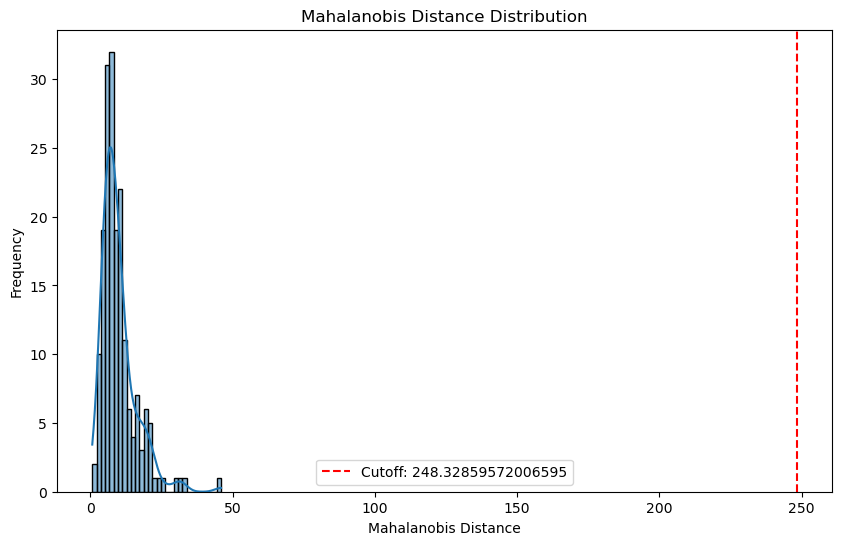

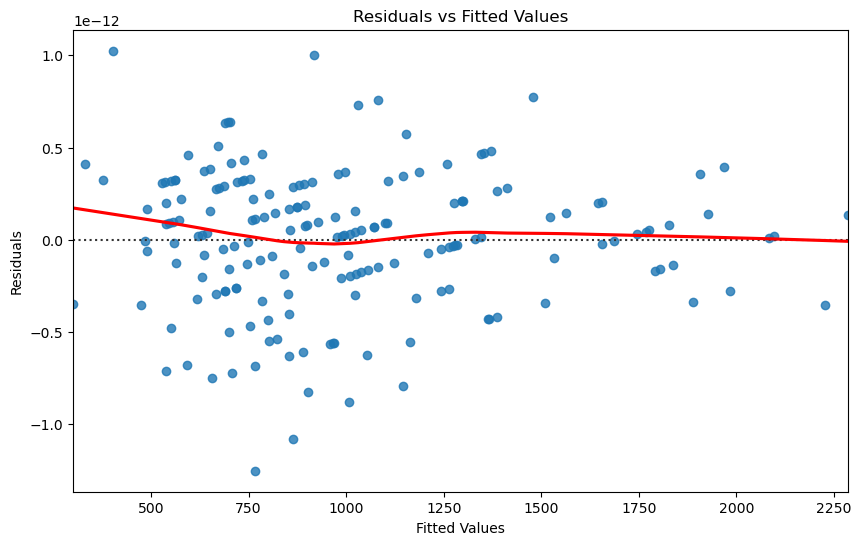

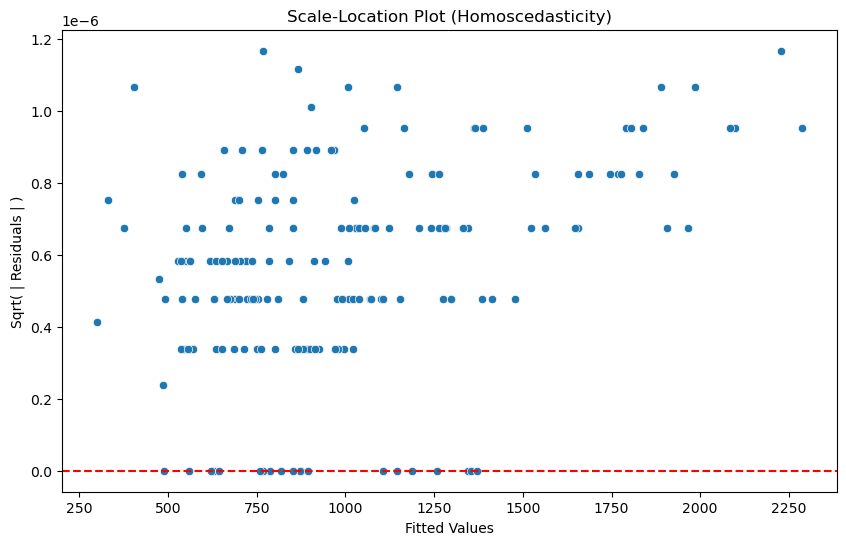

Durbin-Watson statistic: 0.5459720659297015


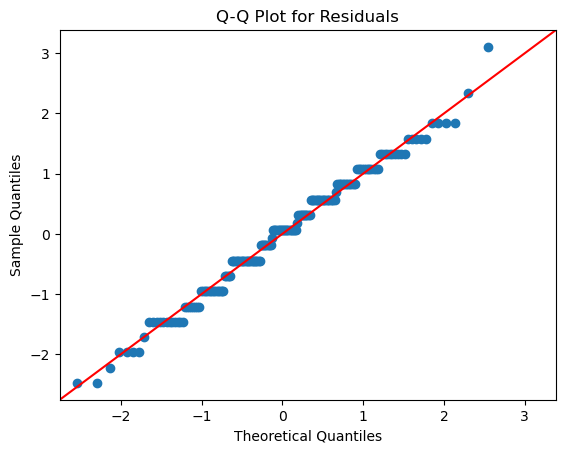

Jarque-Bera test statistic: 0.4401996613379432, p-value: 0.8024386859728989
Shapiro-Wilk test statistic: 0.9883491396903992, p-value: 0.13553206622600555


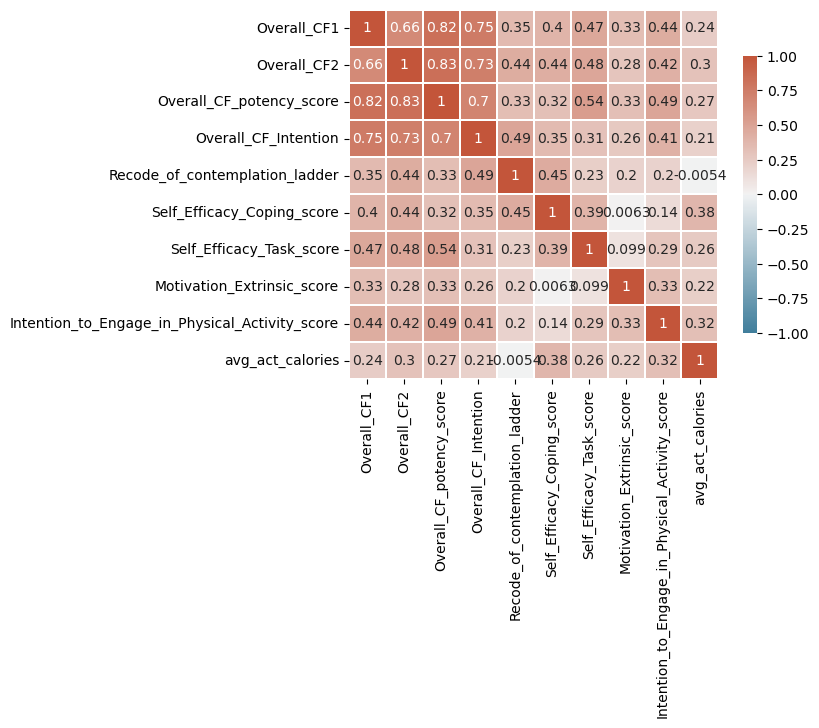

In [177]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy.stats import chi2, jarque_bera, shapiro

main_CF_columns = ['Overall_CF1','Overall_CF2', 'Overall_CF_potency_score','Overall_CF_Intention']
main_activity_columns = ['avg_act_calories']
main_Survey_columns = ['Recode_of_contemplation_ladder','Self_Efficacy_Coping_score','Self_Efficacy_Task_score', 
'Motivation_Extrinsic_score', #'Motivation_Intrinsic_score', # # #'Self_Efficacy_Scheduling_score',
'Intention_to_Engage_in_Physical_Activity_score']

# Assume we have a combined dataframe df with all columns of interest
experimental_group = df[df['Condition'] == 1]
independent_vars = main_CF_columns + main_Survey_columns + main_activity_columns
group_subset = experimental_group.dropna(subset=independent_vars).reset_index(drop=True)

# Standardize data
X = group_subset[independent_vars]
X_scaled = StandardScaler().fit_transform(X)
vif_data = pd.DataFrame()
vif_data["feature"] = independent_vars
vif_data["VIF"] = [variance_inflation_factor(X_scaled, i) for i in range(X.shape[1])]
print(vif_data)

# Outlier check using Mahalanobis distance
cov_matrix = np.cov(X_scaled, rowvar=False)
inv_cov_matrix = np.linalg.inv(cov_matrix)
mean_distr = X_scaled.mean(axis=0)

mahalanobis_distances = []
for i in range(len(X_scaled)):
    delta = X_scaled[i] - mean_distr
    mahalanobis_distances.append(np.dot(np.dot(delta, inv_cov_matrix), delta.T))

group_subset['mahalanobis'] = mahalanobis_distances
cutoff = chi2.ppf(0.99, group_subset.shape[1])
print(f'Cutoff for Mahalanobis distance: {cutoff}\n\n')
outliers = group_subset[group_subset['mahalanobis'] > cutoff]
print(f'Number of outliers detected: {len(outliers)}')

# Plot Mahalanobis distance
plt.figure(figsize=(10, 6))
sns.histplot(group_subset['mahalanobis'], bins=30, kde=True)
plt.axvline(x=cutoff, color='r', linestyle='--', label=f'Cutoff: {cutoff}')
plt.title('Mahalanobis Distance Distribution')
plt.xlabel('Mahalanobis Distance')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# 3. Linearity Assumption
# Fit the regression model
X_with_constant = sm.add_constant(X_scaled)
y = group_subset['avg_act_calories']
model = sm.OLS(y, X_with_constant).fit()

# Residuals vs Fitted plot for linearity check
fitted_vals = model.fittedvalues
residuals = model.resid
plt.figure(figsize=(10, 6))
sns.residplot(x=fitted_vals, y=residuals, lowess=True, line_kws={'color': 'red'})
plt.title('Residuals vs Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()

# 4. Homoscedasticity (Constant Variance of Errors)
plt.figure(figsize=(10, 6))
sns.scatterplot(x=fitted_vals, y=np.sqrt(np.abs(residuals)))
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Scale-Location Plot (Homoscedasticity)')
plt.xlabel('Fitted Values')
plt.ylabel('Sqrt( | Residuals | )')
plt.show()

# 5. Independence of Errors: Durbin-Watson test
durbin_watson_stat = sm.stats.durbin_watson(model.resid)
print(f'Durbin-Watson statistic: {durbin_watson_stat}')

# 6. Normality of Residuals
# Q-Q plot for normality
sm.qqplot(residuals, line='45', fit=True)
plt.title('Q-Q Plot for Residuals')
plt.show()

# Jarque-Bera and Shapiro-Wilk tests for normality of residuals
jb_test_stat, jb_p_val = jarque_bera(residuals)
shapiro_test_stat, shapiro_p_val = shapiro(residuals)

print(f'Jarque-Bera test statistic: {jb_test_stat}, p-value: {jb_p_val}')
print(f'Shapiro-Wilk test statistic: {shapiro_test_stat}, p-value: {shapiro_p_val}')

cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(
        data=X.corr(),  # our correlation matrix
        linewidths=0.1,  # the width of lines separating the matrix squares
        square=True,   # enforce 1:1 ratios among correlation cells
        cmap=cmap,  # use the color map we defined above
        vmax=1,  # define the max of our correlation scale
        vmin=-1, # define the min of our correlation scale
        center=0,  # The value at which the color map is centered about (white)
        cbar_kws={"shrink": .75},  # shrink the scale a bit
        annot=True
    )
# adjust y-axis ticks for legibility
plt.yticks(rotation=0)  
# show the heatmap
plt.show()

# # Assume we have a combined dataframe df with all columns of interest
# independent_vars = main_Survey_columns + main_activity_columns
# group_subset = df.dropna(subset=independent_vars).reset_index(drop=True)

# # Standardize data
# X = group_subset[independent_vars]
# X_scaled = StandardScaler().fit_transform(X)
# vif_data = pd.DataFrame()
# vif_data["feature"] = independent_vars
# vif_data["VIF"] = [variance_inflation_factor(X_scaled, i) for i in range(X.shape[1])]
# print(vif_data)

# # Outlier check using Mahalanobis distance
# cov_matrix = np.cov(X_scaled, rowvar=False)
# inv_cov_matrix = np.linalg.inv(cov_matrix)
# mean_distr = X_scaled.mean(axis=0)

# mahalanobis_distances = []
# for i in range(len(X_scaled)):
#     delta = X_scaled[i] - mean_distr
#     mahalanobis_distances.append(np.dot(np.dot(delta, inv_cov_matrix), delta.T))

# group_subset['mahalanobis'] = mahalanobis_distances
# cutoff = chi2.ppf(0.99, group_subset.shape[1])
# print(f'Cutoff for Mahalanobis distance: {cutoff}')


In [15]:
# Independant Variables: CF
main_CF_columns = ['Overall_CF1', 'Overall_CF2','Overall_CF_potency_score', 'Overall_CF_Intention']

experimental_group = df[df['Condition'] == 1]

# Regression for Baseline PA levels (Week 1)
independent_vars = main_CF_columns + ['avg_act_calories'] #main_Survey_columns +
cf_group_baseline = experimental_group[experimental_group['Week'] == 1]

# Regression for Week 2 PA levels, including baseline PA as a control variable
print("\nWeek 2 PA")
cf_group_data = experimental_group[experimental_group['Week'] == 2].dropna(subset=independent_vars).reset_index(drop=True)
X = cf_group_data[main_CF_columns][cf_group_data['Week'] == 2].reset_index(drop=True)
X['Baseline_PA'] = cf_group_baseline['avg_act_calories'].reset_index(drop=True)

X_week2 = sm.add_constant(X)
y_week2 = cf_group_data['avg_act_calories'][cf_group_data['Week'] == 2].reset_index(drop=True)
model_week2 = sm.OLS(y_week2, X_week2).fit()
print(model_week2.summary())

# Regression for Week 6 PA levels, including baseline PA as a control variable
print("\nWeek 6 PA")
cf_group_data = experimental_group[experimental_group['Week'] == 6].dropna(subset=independent_vars).reset_index(drop=True)
X = cf_group_data[main_CF_columns][cf_group_data['Week'] == 6].reset_index(drop=True)
X['Baseline_PA'] = cf_group_baseline['avg_act_calories'].reset_index(drop=True)

X_week6 = sm.add_constant(X)
y_week6 = cf_group_data['avg_act_calories'][cf_group_data['Week'] == 6].reset_index(drop=True)
model_week6 = sm.OLS(y_week6, X_week6).fit()
print(model_week6.summary())

# Regression for Week 6 PA levels, including baseline PA as a control variable
print("\nWeek 7 PA")
cf_group_data = experimental_group[experimental_group['Week'] == 7].dropna(subset=independent_vars).reset_index(drop=True)
X = cf_group_data[main_CF_columns][cf_group_data['Week'] == 7].reset_index(drop=True)
X['Baseline_PA'] = cf_group_baseline['avg_act_calories'].reset_index(drop=True)

X_week6 = sm.add_constant(X)
y_week6 = cf_group_data['avg_act_calories'][cf_group_data['Week'] == 7].reset_index(drop=True)
model_week6 = sm.OLS(y_week6, X_week6).fit()
print(model_week6.summary())

# Regression for Week 13 PA levels, including baseline PA as a control variable
print("\nWeek 13 PA")
cf_group_data = experimental_group[experimental_group['Week'] == 13].dropna(subset=independent_vars).reset_index(drop=True)
X = cf_group_data[main_CF_columns][cf_group_data['Week'] == 13].reset_index(drop=True)
X['Baseline_PA'] = cf_group_baseline['avg_act_calories'].reset_index(drop=True)

X_week12 = sm.add_constant(X)
y_week12 = cf_group_data['avg_act_calories'][cf_group_data['Week'] == 13].reset_index(drop=True)
model_week12 = sm.OLS(y_week12,X_week12).fit()
print(model_week12.summary())


# Regression for Overall Weeks PA levels, including baseline PA as a control variable
print("\nOverall Weeks PA")
cf_group_data = experimental_group.dropna(subset=independent_vars).reset_index(drop=True)
X = cf_group_data[main_CF_columns].reset_index(drop=True)

X_weeks = sm.add_constant(X)
y_weeks = cf_group_data['avg_act_calories'].reset_index(drop=True)
model_weeks = sm.OLS(y_weeks,X_weeks).fit()
print(model_weeks.summary())



Week 2 PA
                            OLS Regression Results                            
Dep. Variable:       avg_act_calories   R-squared:                       0.863
Model:                            OLS   Adj. R-squared:                  0.806
Method:                 Least Squares   F-statistic:                     15.13
Date:                Wed, 25 Sep 2024   Prob (F-statistic):           8.00e-05
Time:                        14:50:35   Log-Likelihood:                -118.65
No. Observations:                  18   AIC:                             249.3
Df Residuals:                      12   BIC:                             254.7
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const        

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=18
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=17
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=16
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "



Week 2 PA


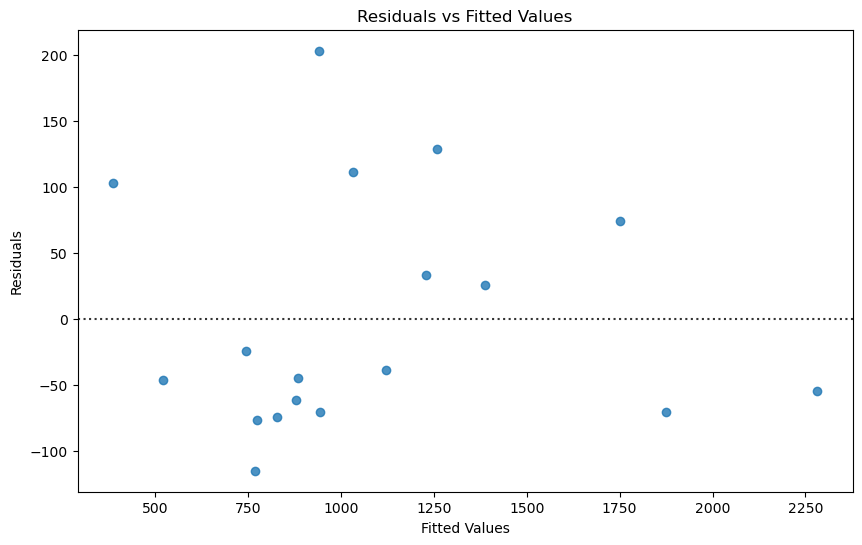

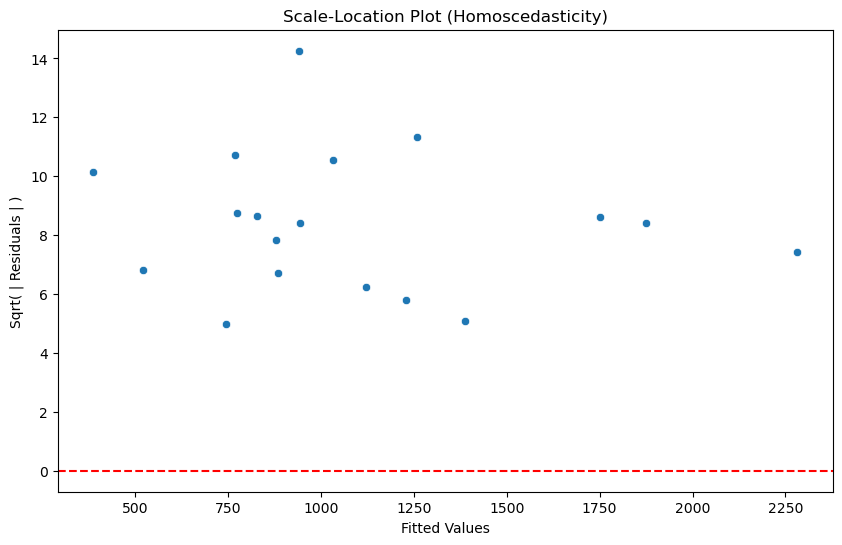

Durbin-Watson statistic: 1.5487678313870772


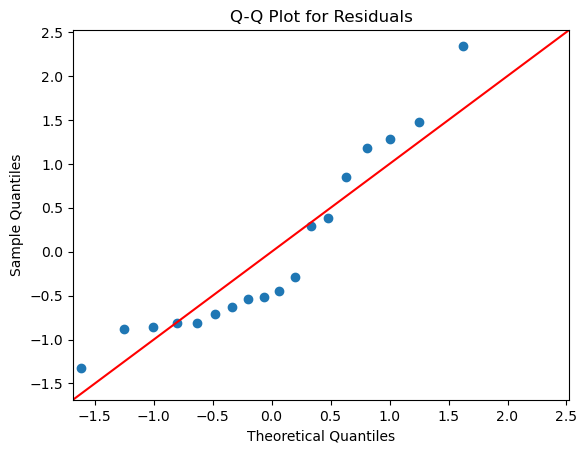

Jarque-Bera test statistic: 2.1800151343950347, p-value: 0.3362139494997431
Shapiro-Wilk test statistic: 0.887012779712677, p-value: 0.03431197628378868


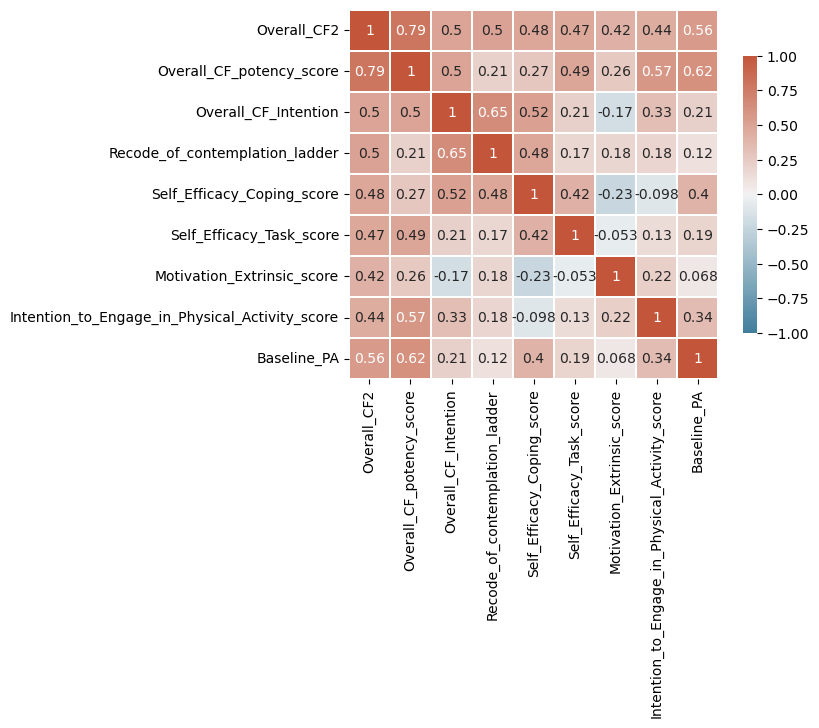

                            OLS Regression Results                            
Dep. Variable:       avg_act_calories   R-squared:                       0.967
Model:                            OLS   Adj. R-squared:                  0.929
Method:                 Least Squares   F-statistic:                     25.84
Date:                Sun, 29 Sep 2024   Prob (F-statistic):           5.60e-05
Time:                        12:16:12   Log-Likelihood:                -105.92
No. Observations:                  18   AIC:                             231.8
Df Residuals:                       8   BIC:                             240.7
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=18
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


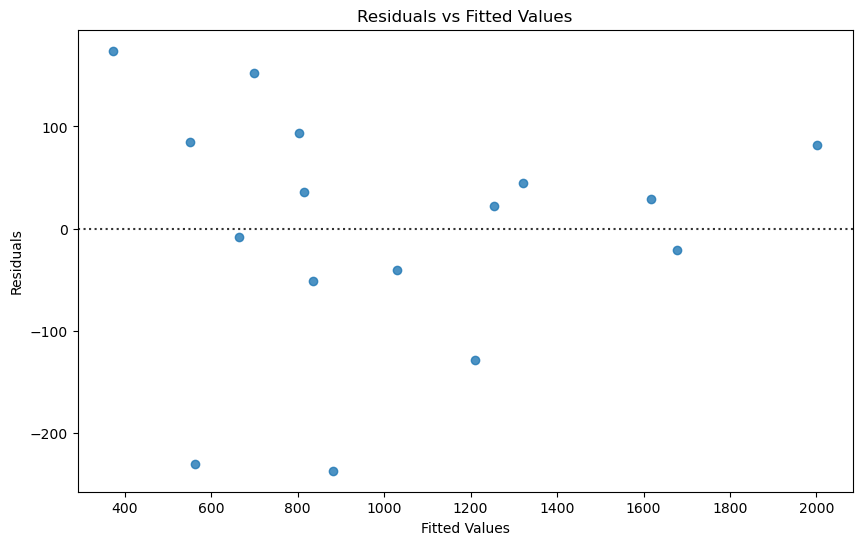

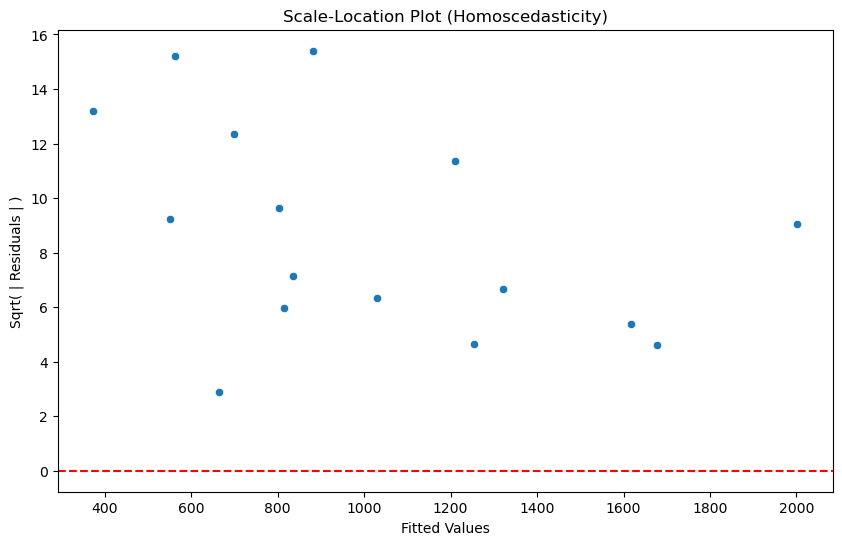

Durbin-Watson statistic: 1.5780400288641352


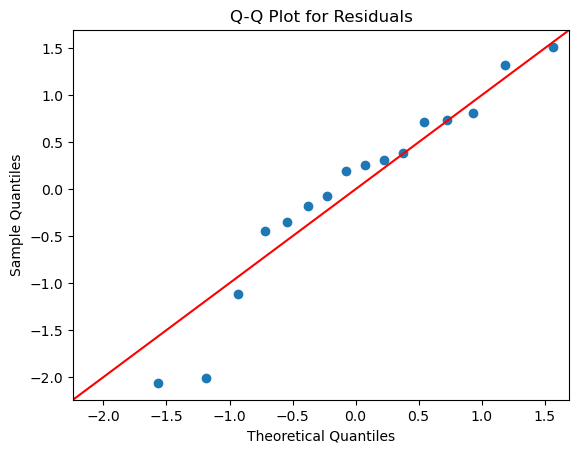

Jarque-Bera test statistic: 1.3269719059349905, p-value: 0.515052751757229
Shapiro-Wilk test statistic: 0.9291660785675049, p-value: 0.23647598922252655


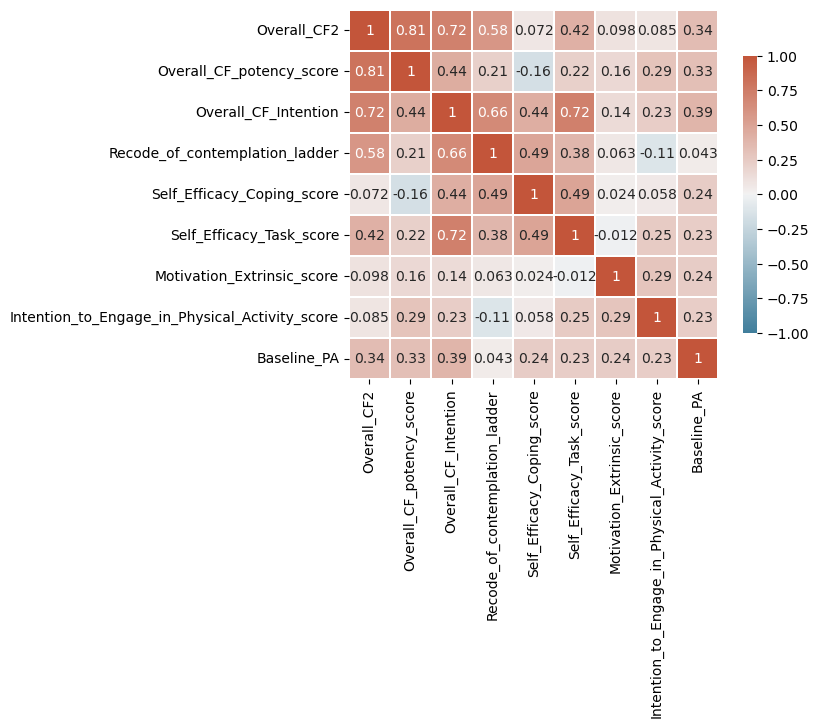

                            OLS Regression Results                            
Dep. Variable:       avg_act_calories   R-squared:                       0.937
Model:                            OLS   Adj. R-squared:                  0.843
Method:                 Least Squares   F-statistic:                     9.933
Date:                Sun, 29 Sep 2024   Prob (F-statistic):            0.00564
Time:                        12:16:13   Log-Likelihood:                -98.629
No. Observations:                  16   AIC:                             217.3
Df Residuals:                       6   BIC:                             225.0
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=16
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


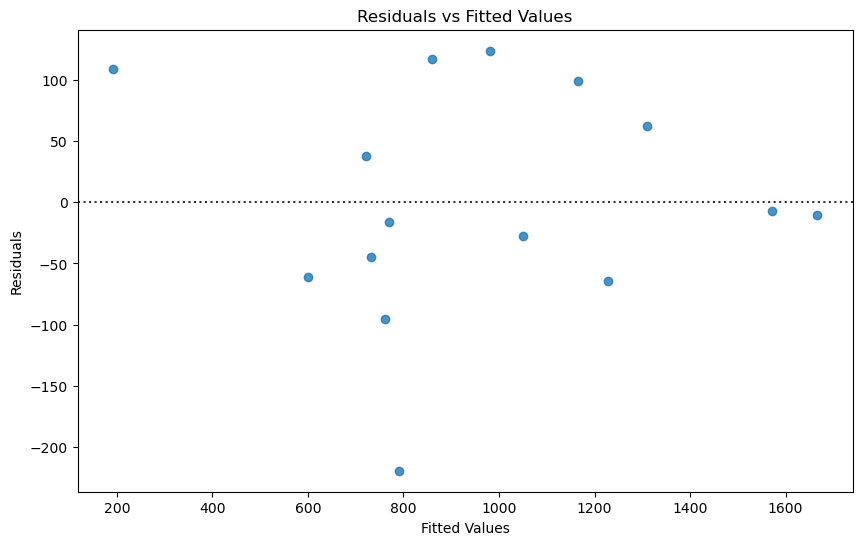

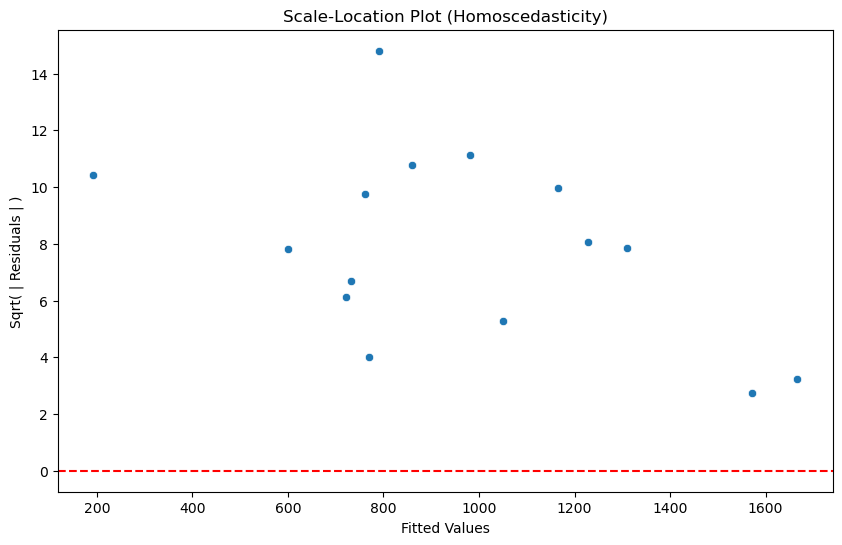

Durbin-Watson statistic: 1.9681474409092505


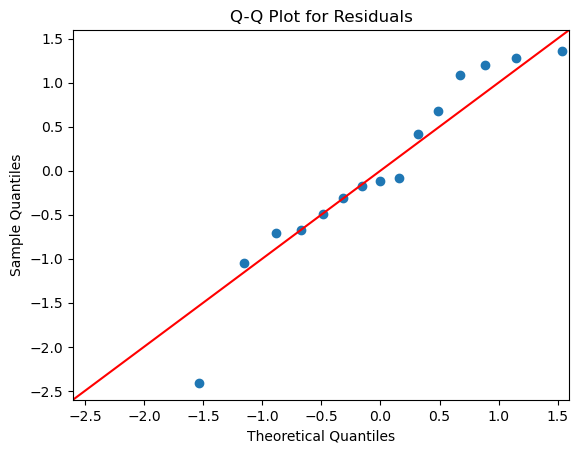

Jarque-Bera test statistic: 0.7123735682367978, p-value: 0.7003417952928104
Shapiro-Wilk test statistic: 0.9351000785827637, p-value: 0.3247274160385132


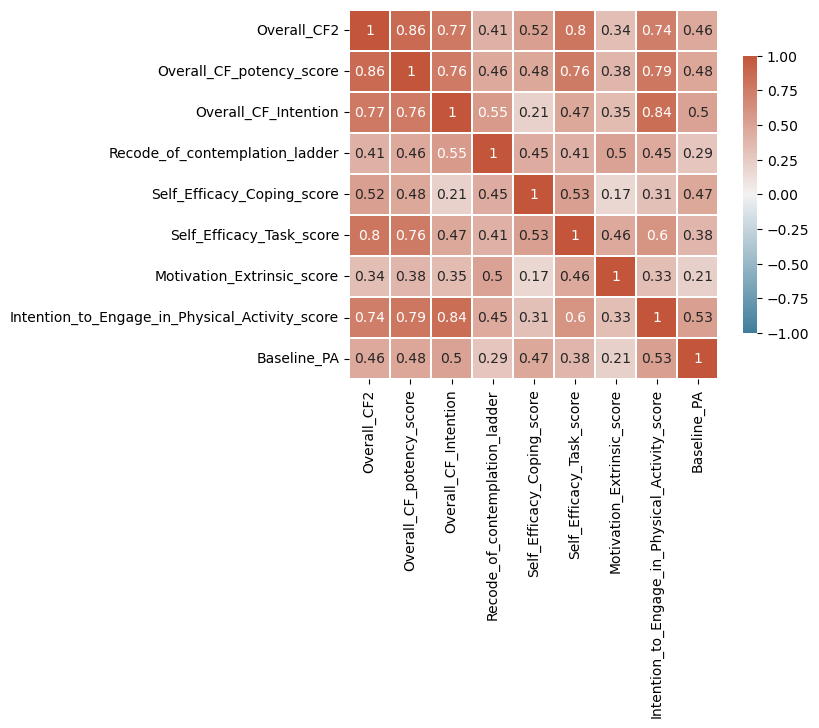

                            OLS Regression Results                            
Dep. Variable:       avg_act_calories   R-squared:                       0.943
Model:                            OLS   Adj. R-squared:                  0.841
Method:                 Least Squares   F-statistic:                     9.250
Date:                Sun, 29 Sep 2024   Prob (F-statistic):             0.0123
Time:                        12:16:13   Log-Likelihood:                -88.925
No. Observations:                  15   AIC:                             197.9
Df Residuals:                       5   BIC:                             204.9
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=15
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


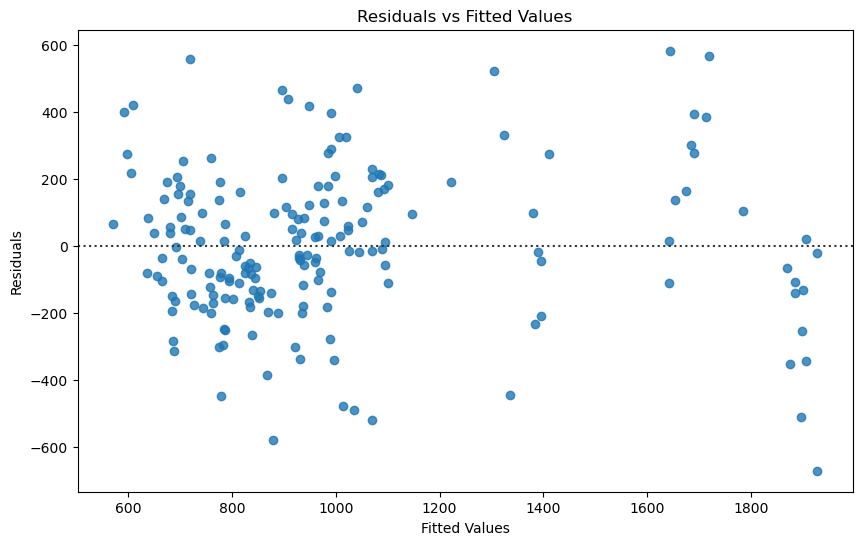

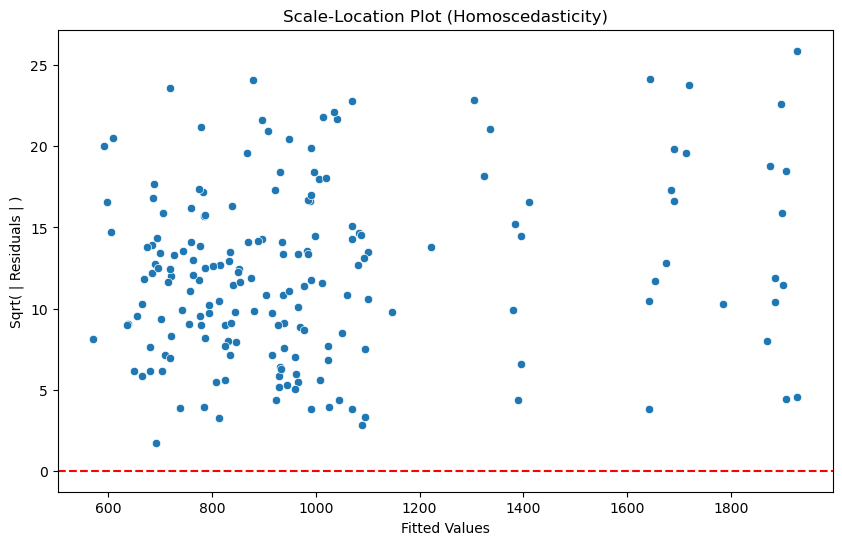

Durbin-Watson statistic: 1.2988306515630719


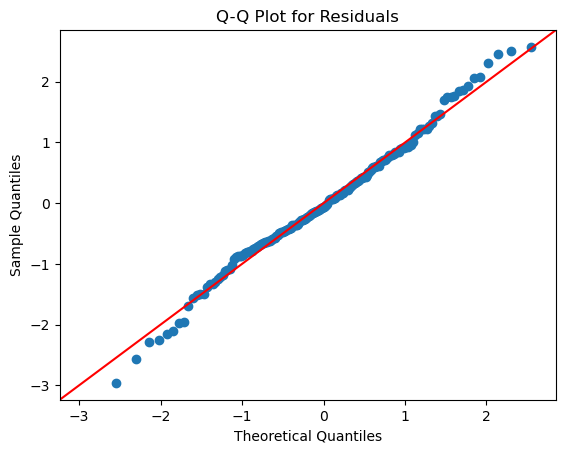

Jarque-Bera test statistic: 0.7904665549910189, p-value: 0.6735229031854032
Shapiro-Wilk test statistic: 0.9919725656509399, p-value: 0.4024006426334381


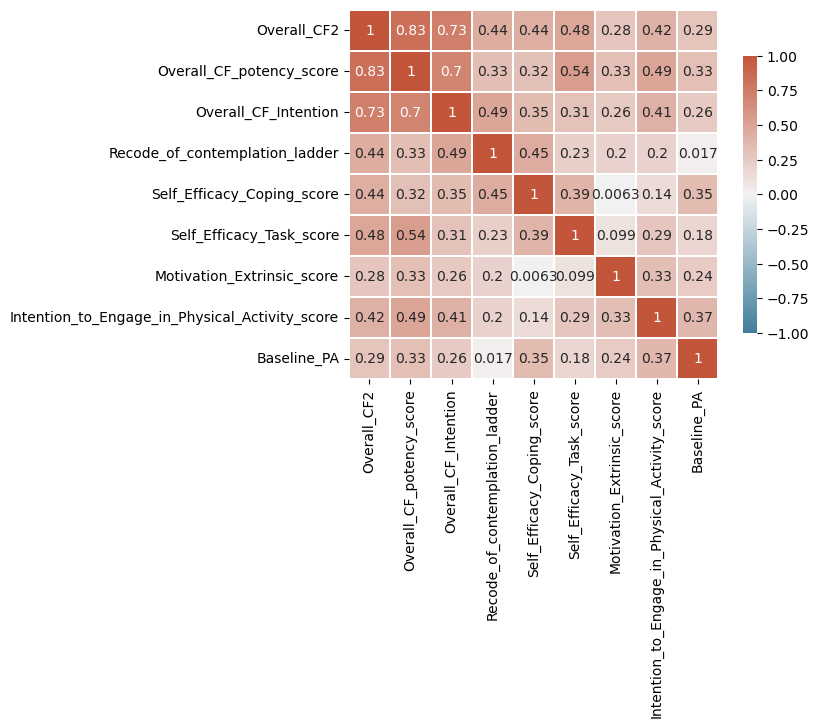

                            OLS Regression Results                            
Dep. Variable:       avg_act_calories   R-squared:                       0.692
Model:                            OLS   Adj. R-squared:                  0.676
Method:                 Least Squares   F-statistic:                     43.46
Date:                Sun, 29 Sep 2024   Prob (F-statistic):           4.98e-40
Time:                        12:16:14   Log-Likelihood:                -1258.8
No. Observations:                 184   AIC:                             2538.
Df Residuals:                     174   BIC:                             2570.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

In [179]:
# Independant Variables: CF + Survey
main_CF_columns = ['Overall_CF2','Overall_CF_potency_score','Overall_CF_Intention']
experimental_group = df[df['Condition'] == 1]

# Regression for Baseline PA levels (Week 1)
independent_vars = main_CF_columns + main_Survey_columns + ['avg_act_calories']
cf_group_baseline = experimental_group[experimental_group['Week'] == 1]

# Regression for Week 2 PA levels, including baseline PA as a control variable
print("\nWeek 2 PA")
cf_group_data = experimental_group[experimental_group['Week'] == 2].dropna(subset=independent_vars).reset_index(drop=True)
X = cf_group_data[main_CF_columns+main_Survey_columns][cf_group_data['Week'] == 2].reset_index(drop=True)
X['Baseline_PA'] = cf_group_baseline['avg_act_calories'].reset_index(drop=True)
# X_scaled = StandardScaler().fit_transform(X)

X_week2 = sm.add_constant(X)
y_week2 = cf_group_data['avg_act_calories'][cf_group_data['Week'] == 2].reset_index(drop=True)
model_week2 = sm.OLS(y_week2, X_week2).fit()
# Residuals vs Fitted plot for linearity check
fitted_vals = model_week2.fittedvalues
residuals = model_week2.resid
plt.figure(figsize=(10, 6))
sns.residplot(x=fitted_vals, y=residuals)#, lowess=True, line_kws={'color': 'red'})
plt.title('Residuals vs Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()
# 4. Homoscedasticity (Constant Variance of Errors)
plt.figure(figsize=(10, 6))
sns.scatterplot(x=fitted_vals, y=np.sqrt(np.abs(residuals)))
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Scale-Location Plot (Homoscedasticity)')
plt.xlabel('Fitted Values')
plt.ylabel('Sqrt( | Residuals | )')
plt.show()
# 5. Independence of Errors: Durbin-Watson test
durbin_watson_stat = sm.stats.durbin_watson(model_week2.resid)
print(f'Durbin-Watson statistic: {durbin_watson_stat}')
# 6. Normality of Residuals
# Q-Q plot for normality
sm.qqplot(residuals, line='45', fit=True)
plt.title('Q-Q Plot for Residuals')
plt.show()
# Jarque-Bera and Shapiro-Wilk tests for normality of residuals
jb_test_stat, jb_p_val = jarque_bera(residuals)
shapiro_test_stat, shapiro_p_val = shapiro(residuals)
print(f'Jarque-Bera test statistic: {jb_test_stat}, p-value: {jb_p_val}')
print(f'Shapiro-Wilk test statistic: {shapiro_test_stat}, p-value: {shapiro_p_val}')
sns.heatmap(
        data=X.corr(),  # our correlation matrix
        linewidths=0.1,  # the width of lines separating the matrix squares
        square=True,   # enforce 1:1 ratios among correlation cells
        cmap=cmap,  # use the color map we defined above
        vmax=1,  # define the max of our correlation scale
        vmin=-1, # define the min of our correlation scale
        center=0,  # The value at which the color map is centered about (white)
        cbar_kws={"shrink": .75},  # shrink the scale a bit
        annot=True
    )
plt.yticks(rotation=0)  
plt.show()
print(model_week2.summary())

# Regression for Week 6 PA levels, including baseline PA as a control variable
print("\nWeek 7 PA")
cf_group_data = experimental_group[experimental_group['Week'] == 7].dropna(subset=independent_vars).reset_index(drop=True)
X = cf_group_data[main_CF_columns+main_Survey_columns][cf_group_data['Week'] == 7].reset_index(drop=True)
X['Baseline_PA'] = cf_group_baseline['avg_act_calories'].reset_index(drop=True)
# X_scaled = StandardScaler().fit_transform(X)

X_week7 = sm.add_constant(X)
y_week7 = cf_group_data['avg_act_calories'][cf_group_data['Week'] == 7].reset_index(drop=True)
model_week7 = sm.OLS(y_week7, X_week7).fit()
# Residuals vs Fitted plot for linearity check
fitted_vals = model_week7.fittedvalues
residuals = model_week7.resid
plt.figure(figsize=(10, 6))
sns.residplot(x=fitted_vals, y=residuals)#, lowess=True, line_kws={'color': 'red'})
plt.title('Residuals vs Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()
# 4. Homoscedasticity (Constant Variance of Errors)
plt.figure(figsize=(10, 6))
sns.scatterplot(x=fitted_vals, y=np.sqrt(np.abs(residuals)))
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Scale-Location Plot (Homoscedasticity)')
plt.xlabel('Fitted Values')
plt.ylabel('Sqrt( | Residuals | )')
plt.show()
# 5. Independence of Errors: Durbin-Watson test
durbin_watson_stat = sm.stats.durbin_watson(model_week7.resid)
print(f'Durbin-Watson statistic: {durbin_watson_stat}')
# 6. Normality of Residuals
# Q-Q plot for normality
sm.qqplot(residuals, line='45', fit=True)
plt.title('Q-Q Plot for Residuals')
plt.show()
# Jarque-Bera and Shapiro-Wilk tests for normality of residuals
jb_test_stat, jb_p_val = jarque_bera(residuals)
shapiro_test_stat, shapiro_p_val = shapiro(residuals)
print(f'Jarque-Bera test statistic: {jb_test_stat}, p-value: {jb_p_val}')
print(f'Shapiro-Wilk test statistic: {shapiro_test_stat}, p-value: {shapiro_p_val}')
sns.heatmap(
        data=X.corr(),  # our correlation matrix
        linewidths=0.1,  # the width of lines separating the matrix squares
        square=True,   # enforce 1:1 ratios among correlation cells
        cmap=cmap,  # use the color map we defined above
        vmax=1,  # define the max of our correlation scale
        vmin=-1, # define the min of our correlation scale
        center=0,  # The value at which the color map is centered about (white)
        cbar_kws={"shrink": .75},  # shrink the scale a bit
        annot=True
    )
plt.yticks(rotation=0)  
plt.show()
print(model_week7.summary())

# Regression for Week 13 PA levels, including baseline PA as a control variable
print("\nWeek 13 PA")
cf_group_data = experimental_group[experimental_group['Week'] == 13].dropna(subset=independent_vars).reset_index(drop=True)
X = cf_group_data[main_CF_columns+main_Survey_columns][cf_group_data['Week'] == 13].reset_index(drop=True)
X['Baseline_PA'] = cf_group_baseline['avg_act_calories'].reset_index(drop=True)
# X_scaled = StandardScaler().fit_transform(X)

X_week13 = sm.add_constant(X)
y_week13 = cf_group_data['avg_act_calories'][cf_group_data['Week'] == 13].reset_index(drop=True)
model_week13 = sm.OLS(y_week13,X_week13).fit()
# Residuals vs Fitted plot for linearity check
fitted_vals = model_week13.fittedvalues
residuals = model_week13.resid
plt.figure(figsize=(10, 6))
sns.residplot(x=fitted_vals, y=residuals)#, lowess=True, line_kws={'color': 'red'})
plt.title('Residuals vs Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()
# 4. Homoscedasticity (Constant Variance of Errors)
plt.figure(figsize=(10, 6))
sns.scatterplot(x=fitted_vals, y=np.sqrt(np.abs(residuals)))
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Scale-Location Plot (Homoscedasticity)')
plt.xlabel('Fitted Values')
plt.ylabel('Sqrt( | Residuals | )')
plt.show()
# 5. Independence of Errors: Durbin-Watson test
durbin_watson_stat = sm.stats.durbin_watson(model_week13.resid)
print(f'Durbin-Watson statistic: {durbin_watson_stat}')
# 6. Normality of Residuals
# Q-Q plot for normality
sm.qqplot(residuals, line='45', fit=True)
plt.title('Q-Q Plot for Residuals')
plt.show()
# Jarque-Bera and Shapiro-Wilk tests for normality of residuals
jb_test_stat, jb_p_val = jarque_bera(residuals)
shapiro_test_stat, shapiro_p_val = shapiro(residuals)
print(f'Jarque-Bera test statistic: {jb_test_stat}, p-value: {jb_p_val}')
print(f'Shapiro-Wilk test statistic: {shapiro_test_stat}, p-value: {shapiro_p_val}')
sns.heatmap(
        data=X.corr(),  # our correlation matrix
        linewidths=0.1,  # the width of lines separating the matrix squares
        square=True,   # enforce 1:1 ratios among correlation cells
        cmap=cmap,  # use the color map we defined above
        vmax=1,  # define the max of our correlation scale
        vmin=-1, # define the min of our correlation scale
        center=0,  # The value at which the color map is centered about (white)
        cbar_kws={"shrink": .75},  # shrink the scale a bit
        annot=True
    )
plt.yticks(rotation=0)  
plt.show()
print(model_week13.summary())

# Regression for Overall Weeks PA levels, including baseline PA as a control variable
print("\nOverall Weeks PA")
cf_group_baseline = experimental_group[experimental_group['Week'] == 1][['Participant_ID', 'avg_act_calories']].rename(columns={'avg_act_calories': 'Baseline_' + 'PA'})
cf_group_data = experimental_group.dropna(subset=independent_vars).reset_index(drop=True)
cf_group_data = cf_group_data.merge(cf_group_baseline, on='Participant_ID')
cf_group_data['Baseline_PA'] = cf_group_data.groupby('Participant_ID')['Baseline_PA'].transform('first')

X = cf_group_data[main_CF_columns+main_Survey_columns+['Baseline_PA']][cf_group_data['Week'] > 1].reset_index(drop=True)
# X['Baseline_PA'] = cf_group_baseline['avg_act_calories'].reset_index(drop=True)
# X_scaled = StandardScaler().fit_transform(X)

X_weeks = sm.add_constant(X)
y_weeks = cf_group_data['avg_act_calories'][cf_group_data['Week'] > 1].reset_index(drop=True)
model_weeks = sm.OLS(y_weeks,X_weeks).fit()
# Residuals vs Fitted plot for linearity check
fitted_vals = model_weeks.fittedvalues
residuals = model_weeks.resid
plt.figure(figsize=(10, 6))
sns.residplot(x=fitted_vals, y=residuals)#, lowess=True, line_kws={'color': 'red'})
plt.title('Residuals vs Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()
# 4. Homoscedasticity (Constant Variance of Errors)
plt.figure(figsize=(10, 6))
sns.scatterplot(x=fitted_vals, y=np.sqrt(np.abs(residuals)))
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Scale-Location Plot (Homoscedasticity)')
plt.xlabel('Fitted Values')
plt.ylabel('Sqrt( | Residuals | )')
plt.show()
# 5. Independence of Errors: Durbin-Watson test
durbin_watson_stat = sm.stats.durbin_watson(model_weeks.resid)
print(f'Durbin-Watson statistic: {durbin_watson_stat}')
# 6. Normality of Residuals
# Q-Q plot for normality
sm.qqplot(residuals, line='45', fit=True)
plt.title('Q-Q Plot for Residuals')
plt.show()
# Jarque-Bera and Shapiro-Wilk tests for normality of residuals
jb_test_stat, jb_p_val = jarque_bera(residuals)
shapiro_test_stat, shapiro_p_val = shapiro(residuals)
print(f'Jarque-Bera test statistic: {jb_test_stat}, p-value: {jb_p_val}')
print(f'Shapiro-Wilk test statistic: {shapiro_test_stat}, p-value: {shapiro_p_val}')
sns.heatmap(
        data=X.corr(),  # our correlation matrix
        linewidths=0.1,  # the width of lines separating the matrix squares
        square=True,   # enforce 1:1 ratios among correlation cells
        cmap=cmap,  # use the color map we defined above
        vmax=1,  # define the max of our correlation scale
        vmin=-1, # define the min of our correlation scale
        center=0,  # The value at which the color map is centered about (white)
        cbar_kws={"shrink": .75},  # shrink the scale a bit
        annot=True
    )
plt.yticks(rotation=0)  
plt.show()
print(model_weeks.summary())


In [107]:
cf_group_baseline = experimental_group[experimental_group['Week'] == 1][['Participant_ID', 'avg_act_calories']].rename(columns={'avg_act_calories': 'baseline_' + 'PA'})

cf_group_data = experimental_group.dropna(subset=independent_vars).reset_index(drop=True)
cf_group_data = cf_group_data.merge(cf_group_baseline, on='Participant_ID')
#cf_group_data['Baseline_PA'] = cf_group_data.groupby('Participant_ID')['Baseline_PA'].transform('first')
cf_group_baseline
cf_group_data


,index,Variable_item_descriptions,Researcher_comments,Participant_ID,Week,Condition,Are_you_currently_a_college_student?,Are_you_currently_financially_supported_by_a_parent/guardian/or_other_individual(s)?,Are_you_currently_financially_supported_by_one_parent/guardian/or_other_individual_or_more_than_one_parent/guardian/or_other_individual?,Are_your_parents/_guardians/_or_other_individuals_currently_living_together?,...,Overall_CF_Intention,Motivation,Self_Efficacy,Overall_Intention,Overall_Engagement_LastWeek,Height_cm,Weight_kg,BMI,age,baseline_PA
0,2,NaN,NaN,1,2,1.0,NaN,NaN,NaN,NaN,...,7.000000,3.750,6.888889,6.833333,NaN,165.10,104.32616,38.273579,26.0,1159.285714
1,3,NaN,NaN,1,3,1.0,NaN,NaN,NaN,NaN,...,4.666667,4.000,4.777778,5.833333,1.666667,165.10,104.32616,38.273579,26.0,1159.285714
2,4,NaN,NaN,1,4,1.0,NaN,NaN,NaN,NaN,...,7.000000,3.750,4.972222,5.500000,1.000000,165.10,104.32616,38.273579,26.0,1159.285714
3,5,NaN,NaN,1,5,1.0,NaN,NaN,NaN,NaN,...,4.333333,3.375,5.194444,5.666667,4.333333,165.10,104.32616,38.273579,26.0,1159.285714
4,6,NaN,NaN,1,6,1.0,NaN,NaN,NaN,NaN,...,4.000000,4.000,4.416667,4.500000,1.000000,165.10,104.32616,38.273579,26.0,1159.285714
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179,588,NaN,NaN,41,5,1.0,NaN,NaN,NaN,NaN,...,6.000000,3.875,8.111111,6.333333,3.666667,176.53,88.45044,28.383304,37.0,650.857143
180,589,NaN,NaN,41,6,1.0,NaN,NaN,NaN,NaN,...,3.000000,3.625,7.750000,4.333333,3.000000,176.53,88.45044,28.383304,37.0,650.857143
181,590,NaN,NaN,41,7,1.0,NaN,NaN,NaN,NaN,...,6.666667,4.375,9.000000,6.833333,3.333333,176.53,88.45044,28.383304,37.0,650.857143
182,591,NaN,NaN,41,8,1.0,NaN,NaN,NaN,NaN,...,6.666667,3.875,8.111111,6.666667,3.333333,176.53,88.45044,28.383304,37.0,650.857143



 avg_lightly_active_minutes Recode_of_contemplation_ladder

 avg_lightly_active_minutes Self_Efficacy_Coping_score

 avg_lightly_active_minutes Self_Efficacy_Task_score

T-test Mean Difference over all Weeks:
T-statistic: 2.8887
P-value: 0.0079


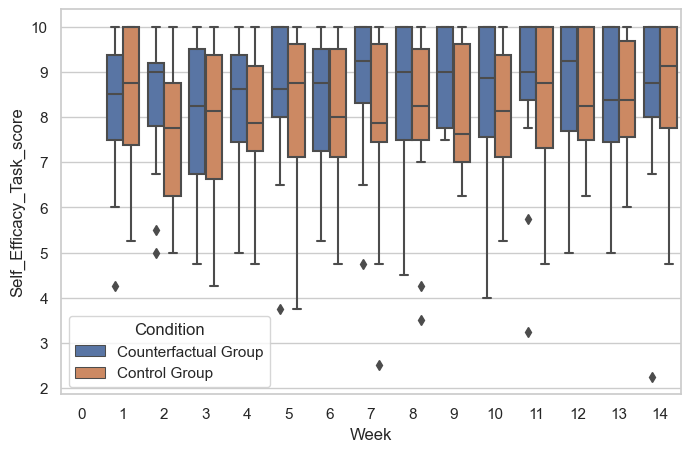

Significant Results found in Counterfactual Group for Self_Efficacy_Task_score:

                   Mixed Linear Model Regression Results
Model:             MixedLM  Dependent Variable:  avg_lightly_active_minutes
No. Observations:  202      Method:              REML                      
No. Groups:        18       Scale:               1378.3554                 
Min. group size:   2        Log-Likelihood:      -1036.1472                
Max. group size:   13       Converged:           Yes                       
Mean group size:   11.2                                                    
---------------------------------------------------------------------------
                               Coef.   Std.Err.   z    P>|z| [0.025  0.975]
---------------------------------------------------------------------------
Intercept                      124.845   42.989  2.904 0.004 40.589 209.102
Self_Efficacy_Task_score        11.146    4.943  2.255 0.024  1.459  20.834
Week                      

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

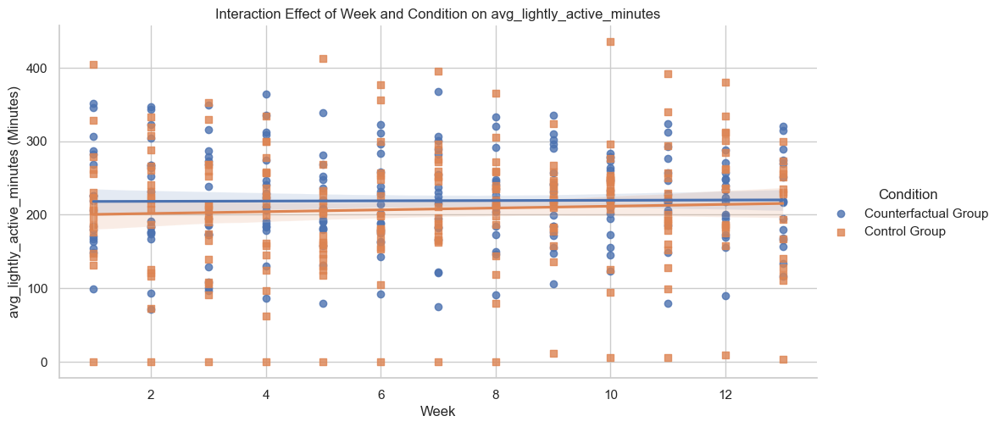

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

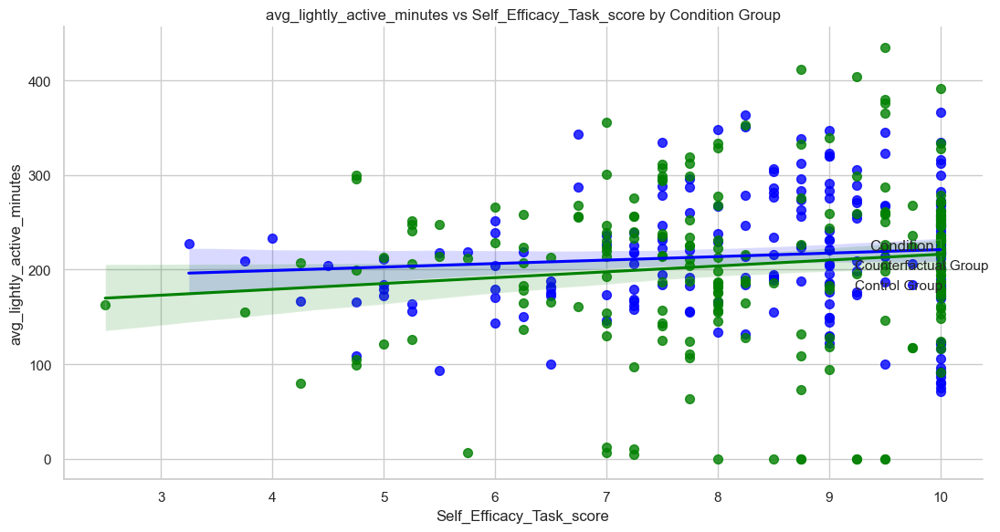

Condition 1: Pearson r = 0.09, p-value = 0.198
Condition 2: Pearson r = 0.12, p-value = 0.093
Condition 1: 11.15, 0.024
Condition 2: -14.28, 0.024


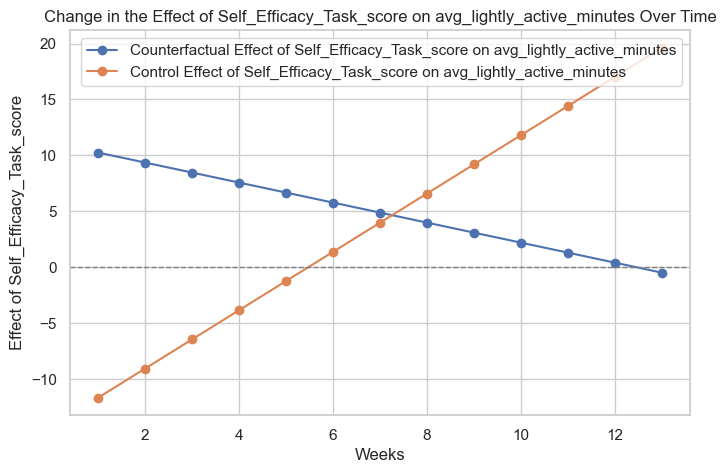

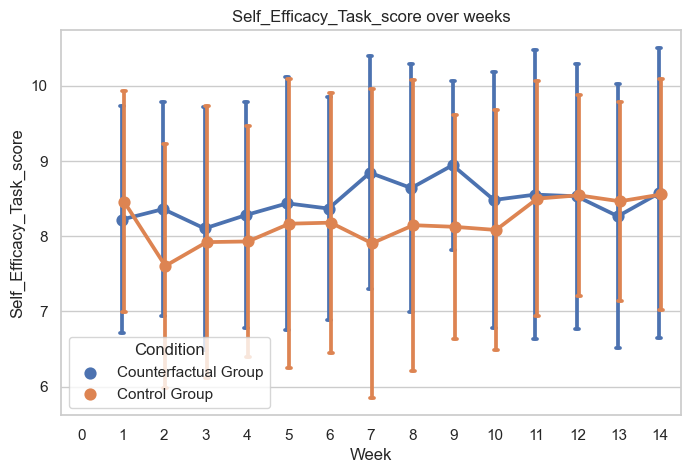


 avg_lightly_active_minutes Self_Efficacy_Scheduling_score

 avg_lightly_active_minutes Motivation_Intrinsic_score

T-test Mean Difference over all Weeks:
T-statistic: 2.5835
P-value: 0.0184


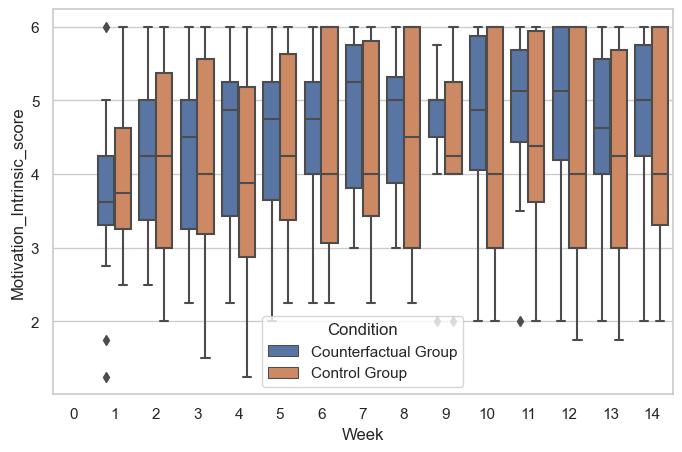

Significant Results found in Counterfactual Group for Motivation_Intrinsic_score:

                    Mixed Linear Model Regression Results
Model:              MixedLM   Dependent Variable:   avg_lightly_active_minutes
No. Observations:   202       Method:               REML                      
No. Groups:         18        Scale:                1348.7589                 
Min. group size:    2         Log-Likelihood:       -1033.7759                
Max. group size:    13        Converged:            Yes                       
Mean group size:    11.2                                                      
------------------------------------------------------------------------------
                                 Coef.   Std.Err.   z    P>|z|  [0.025  0.975]
------------------------------------------------------------------------------
Intercept                        168.155   27.841  6.040 0.000 113.588 222.723
Motivation_Intrinsic_score        11.416    5.897  1.936 0.053  -0.14

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

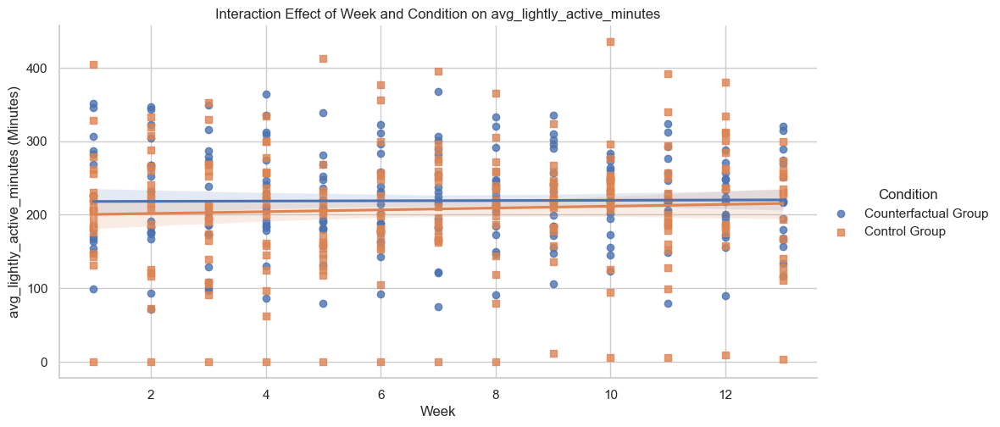

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

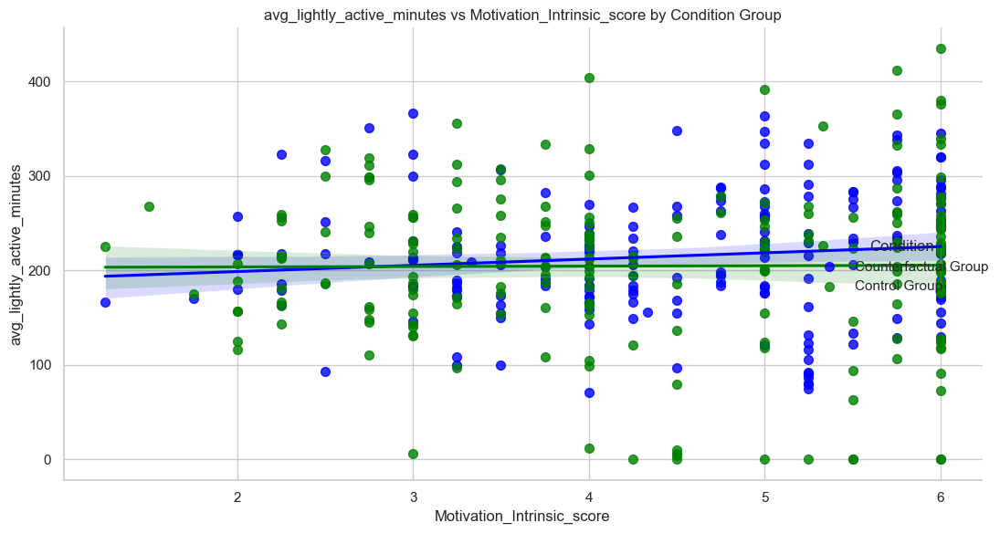

Condition 1: Pearson r = 0.12, p-value = 0.084
Condition 2: Pearson r = 0.01, p-value = 0.925
Condition 1: 11.42, 0.053
Condition 2: -16.94, 0.037


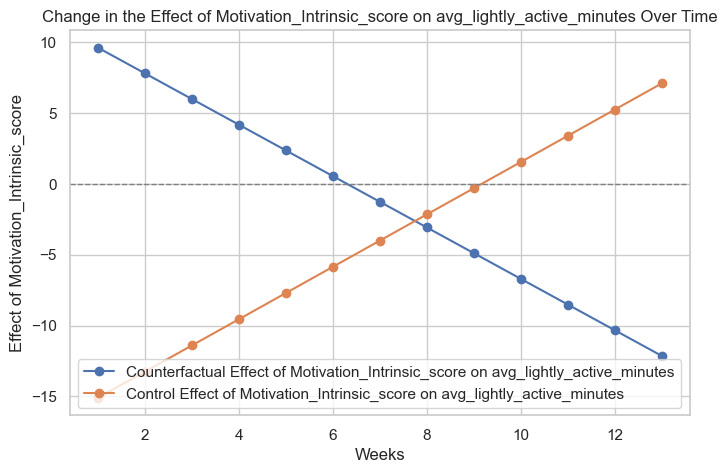

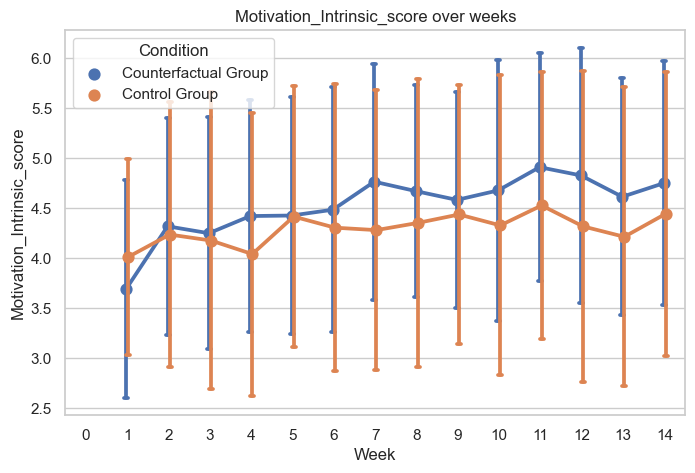


 avg_lightly_active_minutes Motivation_Extrinsic_score

T-test Mean Difference over all Weeks:
T-statistic: 6.4462
P-value: 0.0000


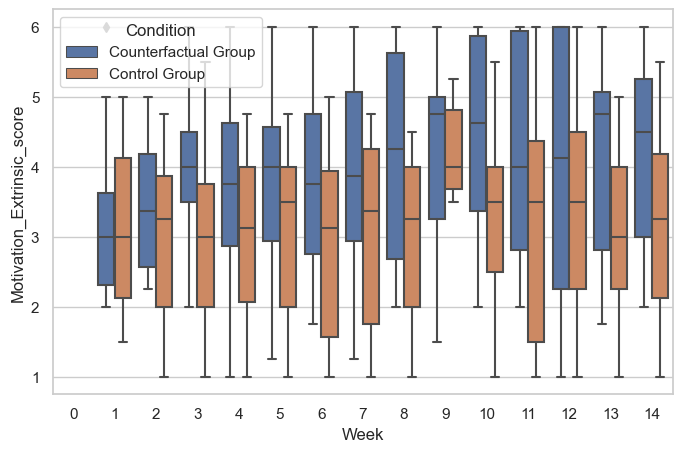

Significant Results found in Counterfactual Group for Motivation_Extrinsic_score:

                    Mixed Linear Model Regression Results
Model:              MixedLM   Dependent Variable:   avg_lightly_active_minutes
No. Observations:   202       Method:               REML                      
No. Groups:         18        Scale:                1395.3961                 
Min. group size:    2         Log-Likelihood:       -1037.0139                
Max. group size:    13        Converged:            Yes                       
Mean group size:    11.2                                                      
------------------------------------------------------------------------------
                                 Coef.   Std.Err.   z    P>|z|  [0.025  0.975]
------------------------------------------------------------------------------
Intercept                        251.364   24.537 10.244 0.000 203.272 299.456
Motivation_Extrinsic_score        -9.489    5.744 -1.652 0.099 -20.74

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

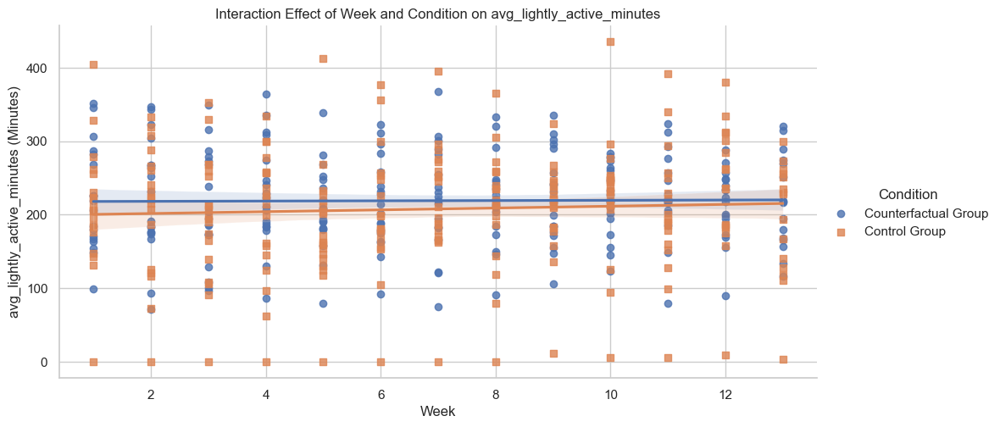

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

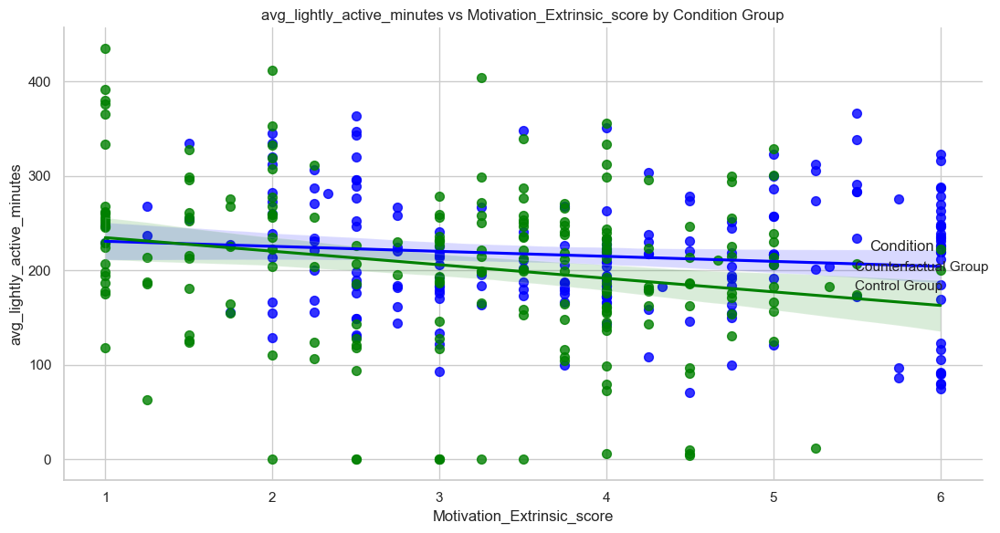

Condition 1: Pearson r = -0.12, p-value = 0.100
Condition 2: Pearson r = -0.22, p-value = 0.002
Condition 1: -9.49, 0.099
Condition 2: 4.77, 0.587


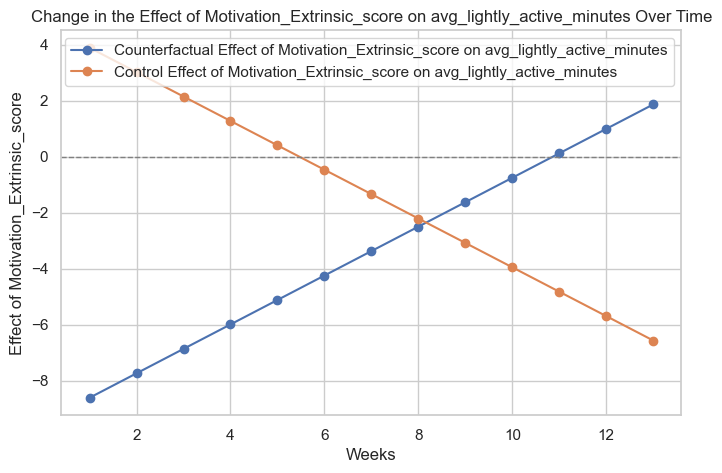

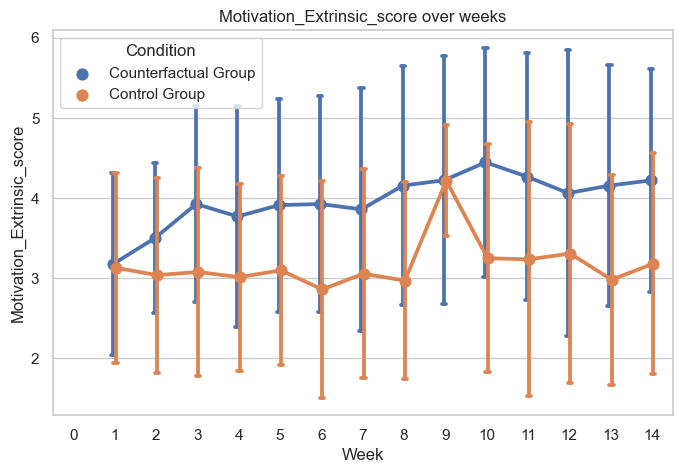


 avg_lightly_active_minutes Intention_to_Engage_in_Physical_Activity_score

T-test Mean Difference over all Weeks:
T-statistic: 12.3322
P-value: 0.0000


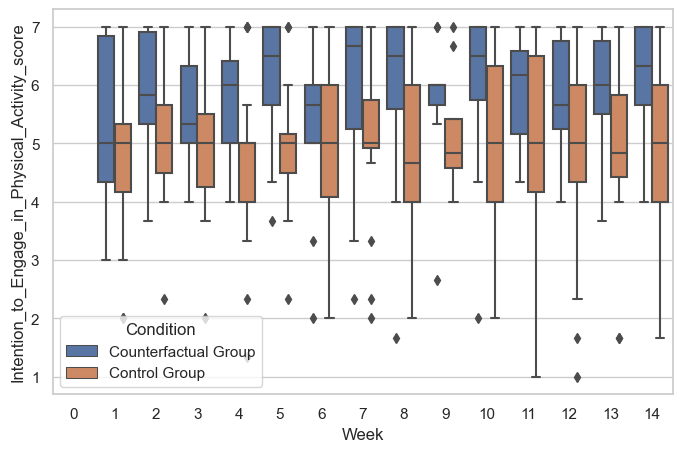

Significant Results found in Counterfactual Group for Intention_to_Engage_in_Physical_Activity_score:

                              Mixed Linear Model Regression Results
Model:                     MixedLM         Dependent Variable:         avg_lightly_active_minutes
No. Observations:          202             Method:                     REML                      
No. Groups:                18              Scale:                      1359.2928                 
Min. group size:           2               Log-Likelihood:             -1034.4601                
Max. group size:           13              Converged:                  Yes                       
Mean group size:           11.2                                                                  
-------------------------------------------------------------------------------------------------
                                                     Coef.   Std.Err.   z    P>|z| [0.025  0.975]
---------------------------------------------

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

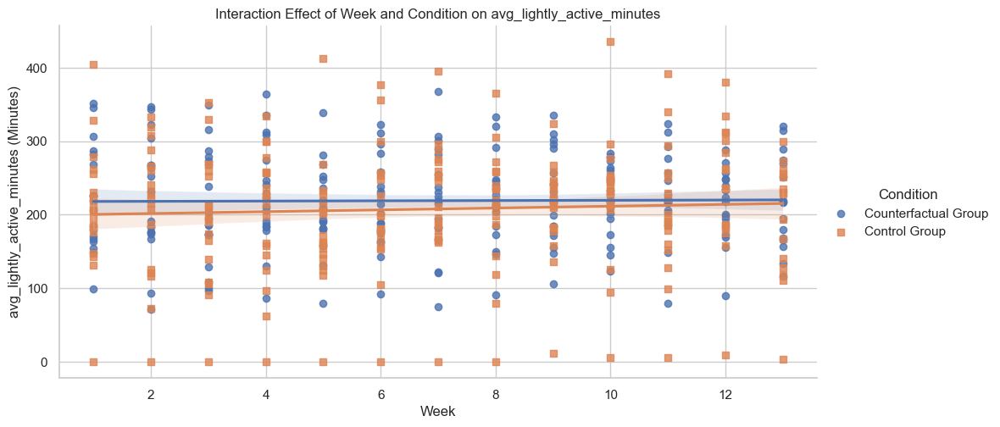

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

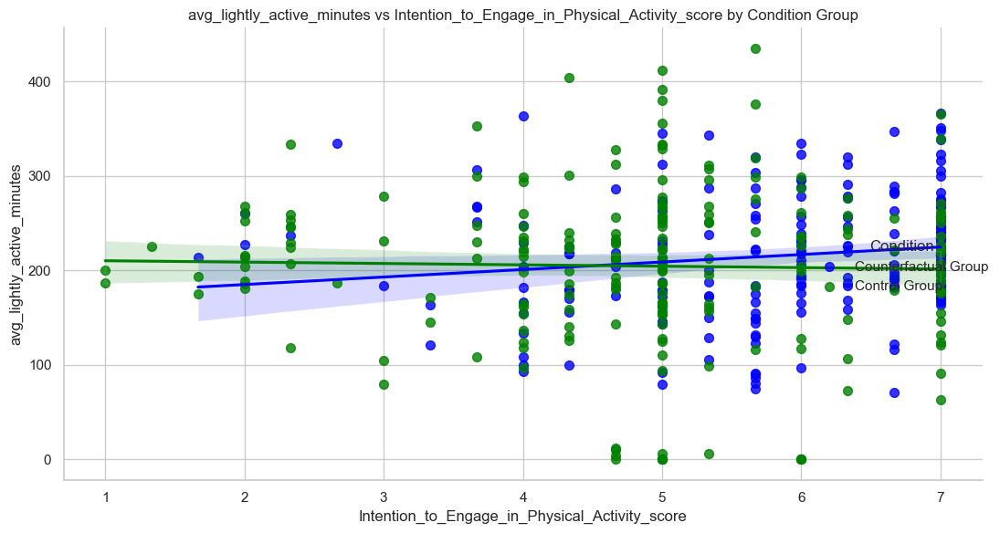

Condition 1: Pearson r = 0.15, p-value = 0.037
Condition 2: Pearson r = -0.02, p-value = 0.730
Condition 1: 14.59, 0.004
Condition 2: -9.90, 0.208


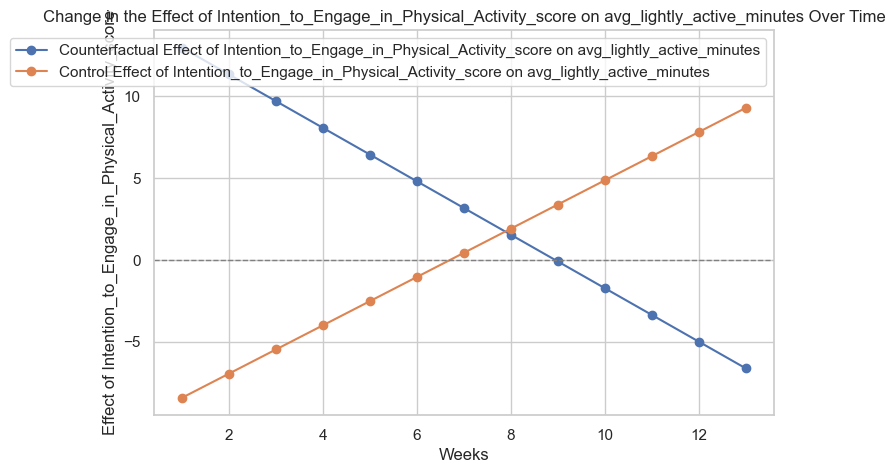

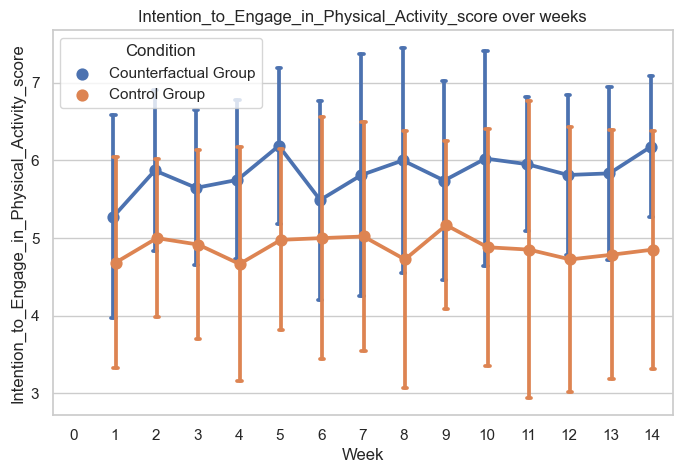


 avg_fairly_active_minutes Recode_of_contemplation_ladder

 avg_fairly_active_minutes Self_Efficacy_Coping_score

T-test Mean Difference over all Weeks:
T-statistic: 6.1616
P-value: 0.0000


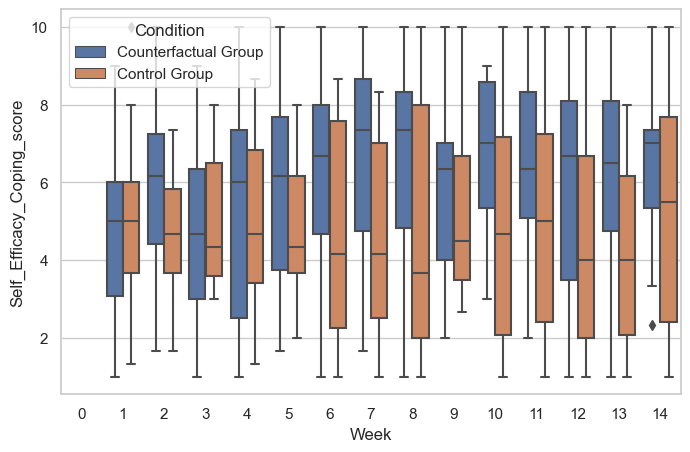

Significant Results found in Counterfactual Group for Self_Efficacy_Coping_score:

                  Mixed Linear Model Regression Results
Model:             MixedLM  Dependent Variable:  avg_fairly_active_minutes
No. Observations:  202      Method:              REML                     
No. Groups:        18       Scale:               69.3414                  
Min. group size:   2        Log-Likelihood:      -736.2882                
Max. group size:   13       Converged:           Yes                      
Mean group size:   11.2                                                   
--------------------------------------------------------------------------
                                Coef.  Std.Err.   z    P>|z| [0.025 0.975]
--------------------------------------------------------------------------
Intercept                        7.196    4.028  1.786 0.074 -0.699 15.092
Self_Efficacy_Coping_score       1.679    0.618  2.716 0.007  0.467  2.890
Week                             0.2

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

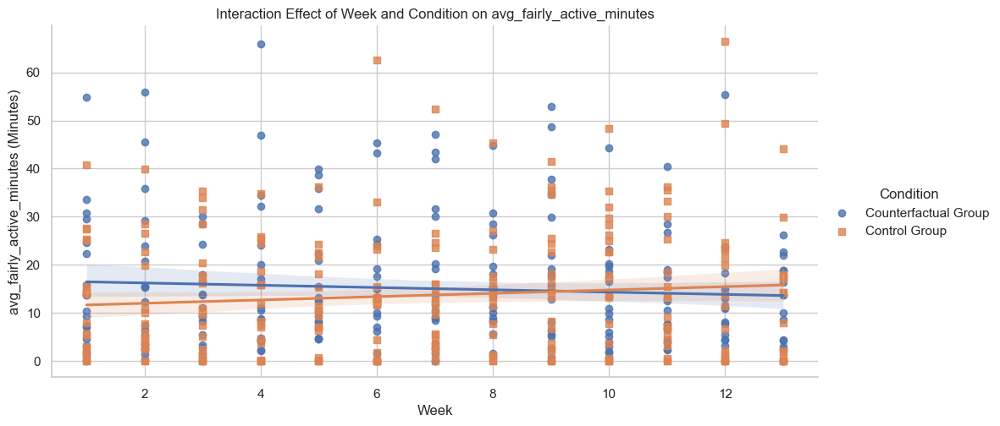

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

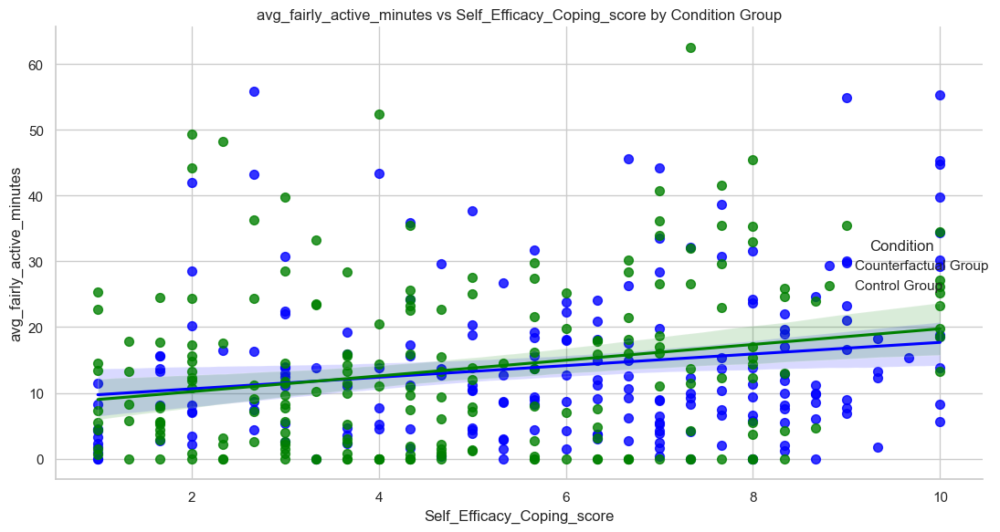

Condition 1: Pearson r = 0.19, p-value = 0.007
Condition 2: Pearson r = 0.23, p-value = 0.001
Condition 1: 1.68, 0.007
Condition 2: 0.45, 0.591


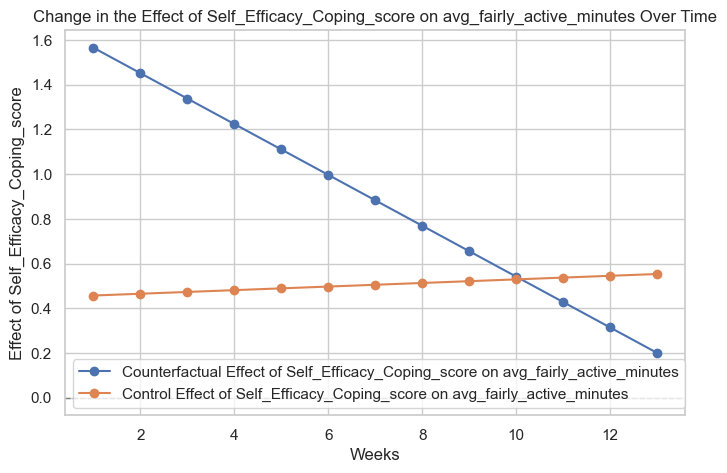

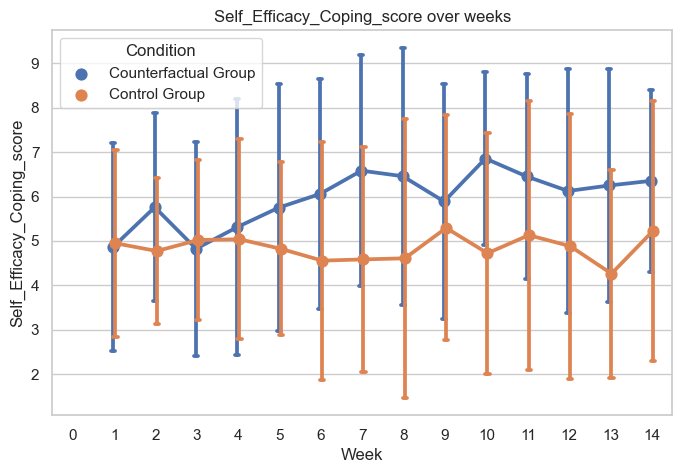


 avg_fairly_active_minutes Self_Efficacy_Task_score

T-test Mean Difference over all Weeks:
T-statistic: 2.8887
P-value: 0.0079


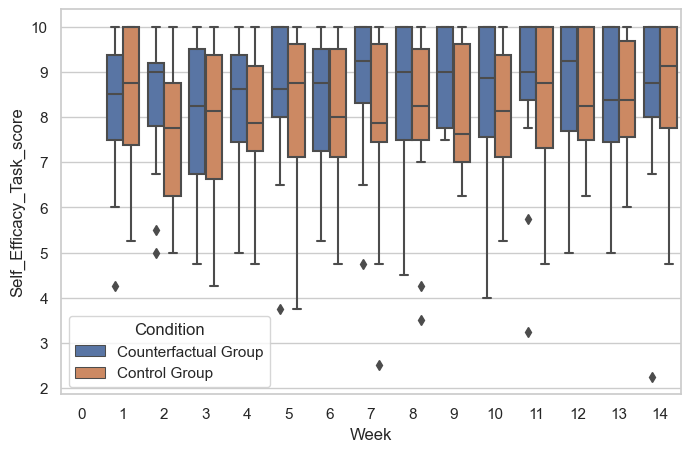

Significant Results found in Counterfactual Group for Self_Efficacy_Task_score:

                  Mixed Linear Model Regression Results
Model:              MixedLM Dependent Variable: avg_fairly_active_minutes
No. Observations:   202     Method:             REML                     
No. Groups:         18      Scale:              69.6486                  
Min. group size:    2       Log-Likelihood:     -734.6364                
Max. group size:    13      Converged:          Yes                      
Mean group size:    11.2                                                 
-------------------------------------------------------------------------
                              Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
-------------------------------------------------------------------------
Intercept                     -2.194    9.064 -0.242 0.809 -19.958 15.570
Self_Efficacy_Task_score       2.211    1.062  2.081 0.037   0.129  4.293
Week                          -0.391    0.839 -0.

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

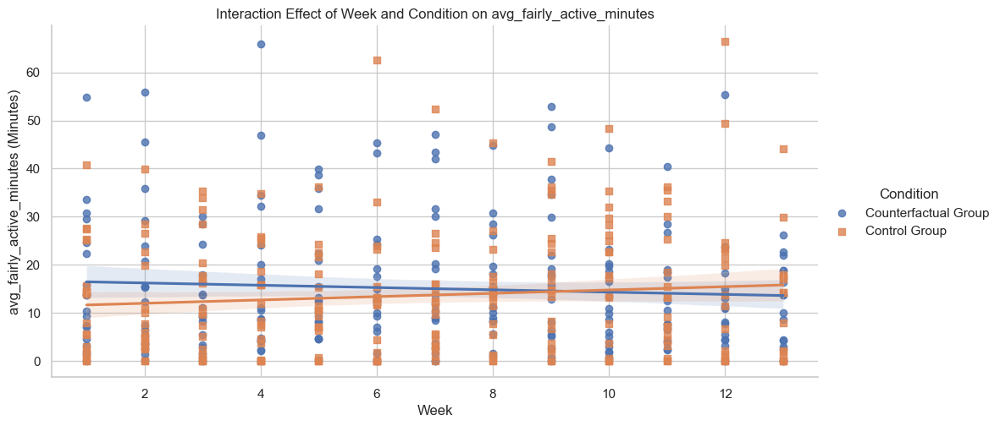

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

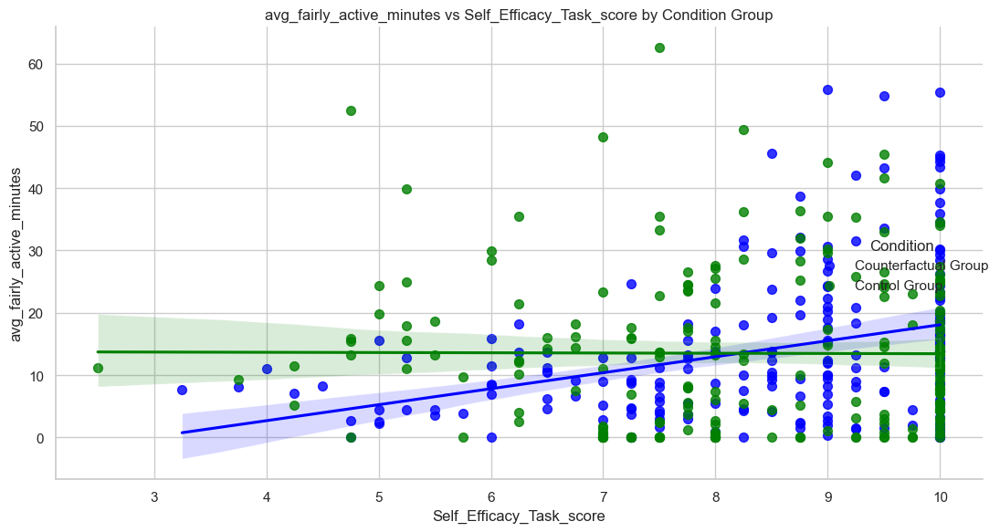

Condition 1: Pearson r = 0.34, p-value = 0.000
Condition 2: Pearson r = -0.00, p-value = 0.945
Condition 1: 2.21, 0.037
Condition 2: -0.28, 0.784


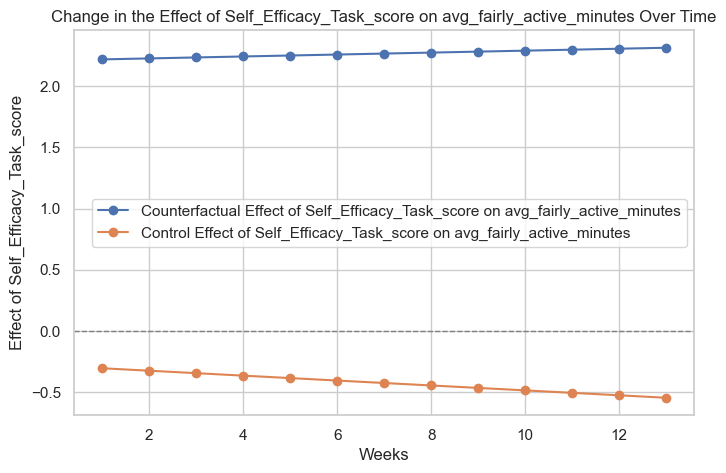

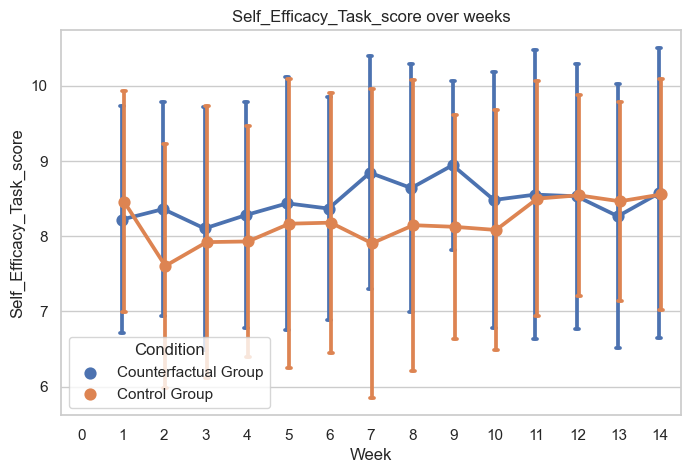


 avg_fairly_active_minutes Self_Efficacy_Scheduling_score

 avg_fairly_active_minutes Motivation_Intrinsic_score

 avg_fairly_active_minutes Motivation_Extrinsic_score

 avg_fairly_active_minutes Intention_to_Engage_in_Physical_Activity_score

 avg_very_active_minutes Recode_of_contemplation_ladder

 avg_very_active_minutes Self_Efficacy_Coping_score

T-test Mean Difference over all Weeks:
T-statistic: 6.1616
P-value: 0.0000


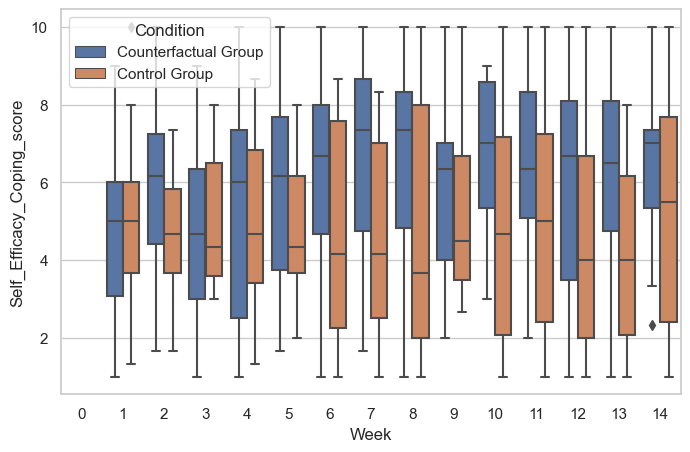

Significant Results found in Counterfactual Group for Self_Efficacy_Coping_score:

                   Mixed Linear Model Regression Results
Model:              MixedLM   Dependent Variable:   avg_very_active_minutes
No. Observations:   202       Method:               REML                   
No. Groups:         18        Scale:                58.0938                
Min. group size:    2         Log-Likelihood:       -725.1953              
Max. group size:    13        Converged:            Yes                    
Mean group size:    11.2                                                   
---------------------------------------------------------------------------
                                 Coef.  Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------------------------
Intercept                         9.395    4.311  2.179 0.029  0.945 17.845
Self_Efficacy_Coping_score        1.407    0.589  2.389 0.017  0.253  2.560
Week                    

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

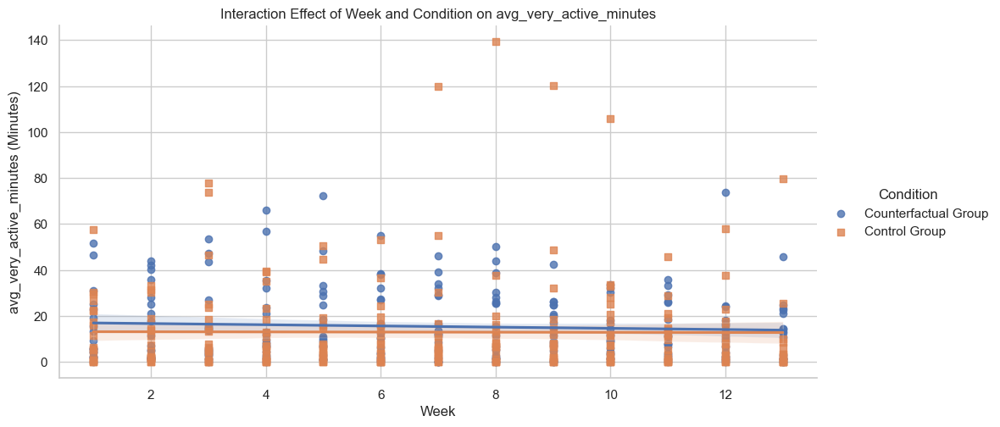

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

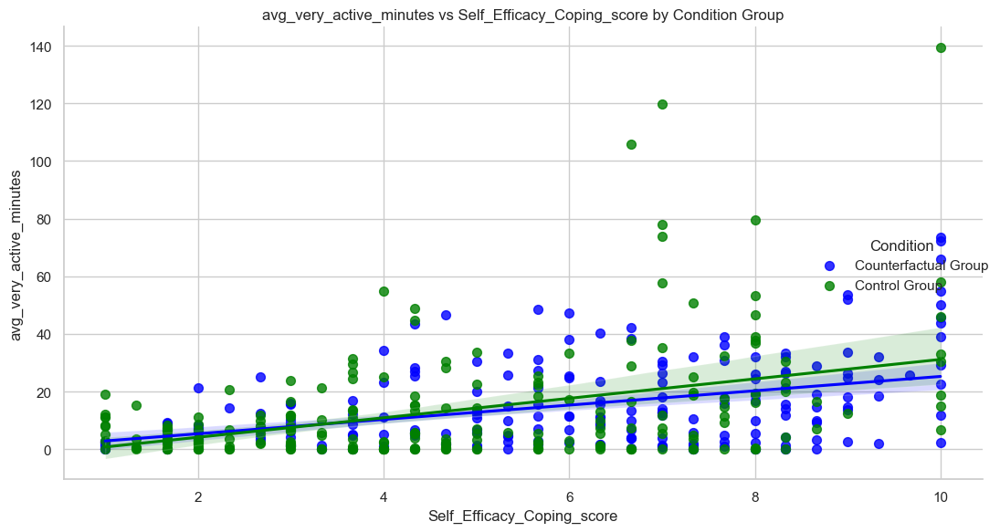

Condition 1: Pearson r = 0.42, p-value = 0.000
Condition 2: Pearson r = 0.40, p-value = 0.000
Condition 1: 1.41, 0.017
Condition 2: 1.01, 0.337


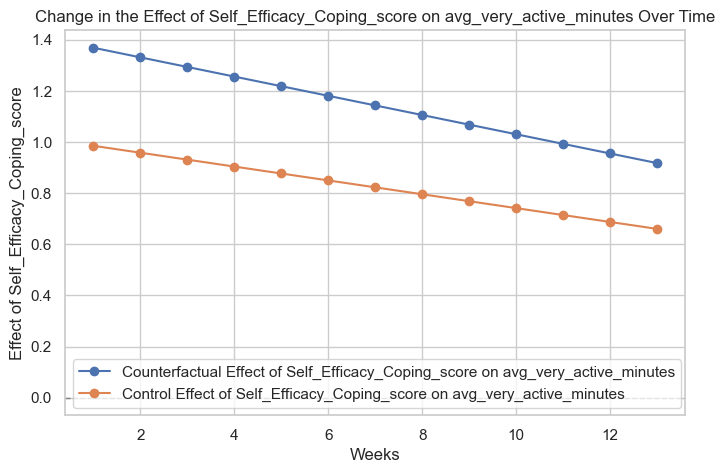

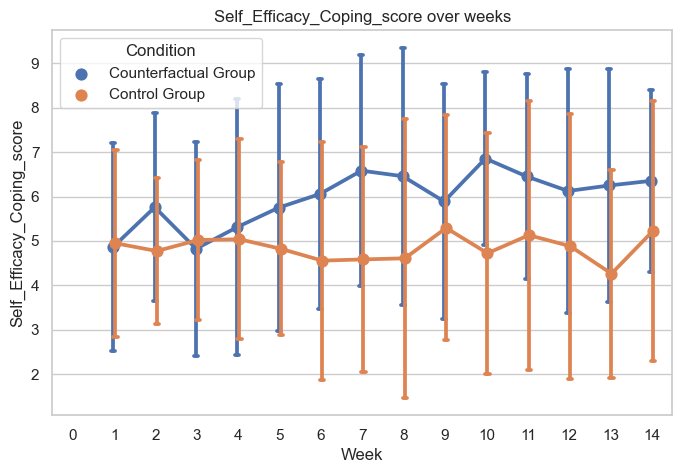


 avg_very_active_minutes Self_Efficacy_Task_score

T-test Mean Difference over all Weeks:
T-statistic: 2.8887
P-value: 0.0079


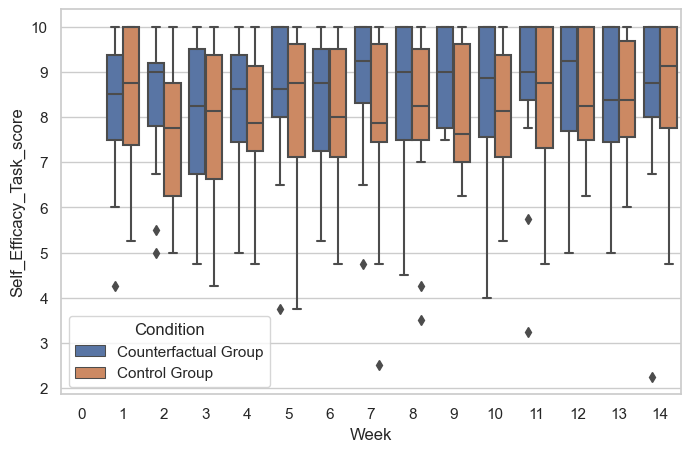

Significant Results found in Counterfactual Group for Self_Efficacy_Task_score:

                  Mixed Linear Model Regression Results
Model:               MixedLM  Dependent Variable:  avg_very_active_minutes
No. Observations:    202      Method:              REML                   
No. Groups:          18       Scale:               57.9185                
Min. group size:     2        Log-Likelihood:      -724.7848              
Max. group size:     13       Converged:           Yes                    
Mean group size:     11.2                                                 
--------------------------------------------------------------------------
                               Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
--------------------------------------------------------------------------
Intercept                      -2.123    9.044 -0.235 0.814 -19.849 15.603
Self_Efficacy_Task_score        2.277    1.027  2.217 0.027   0.264  4.290
Week                            0.211 

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

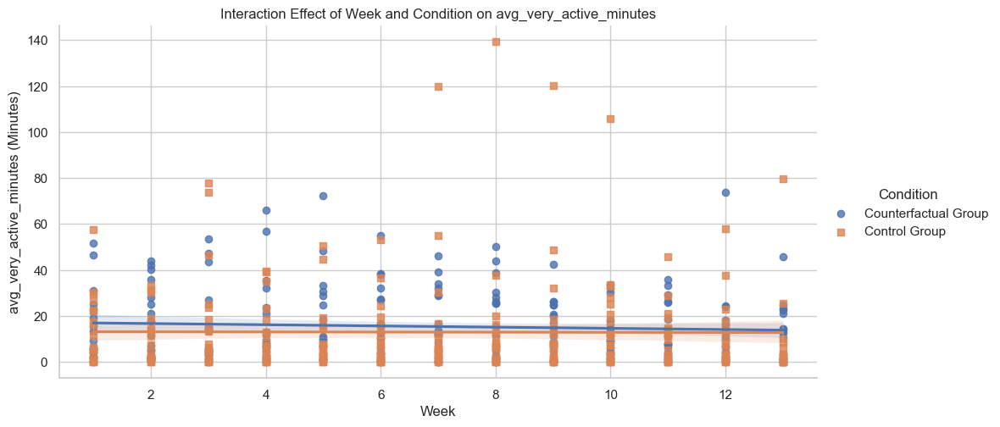

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

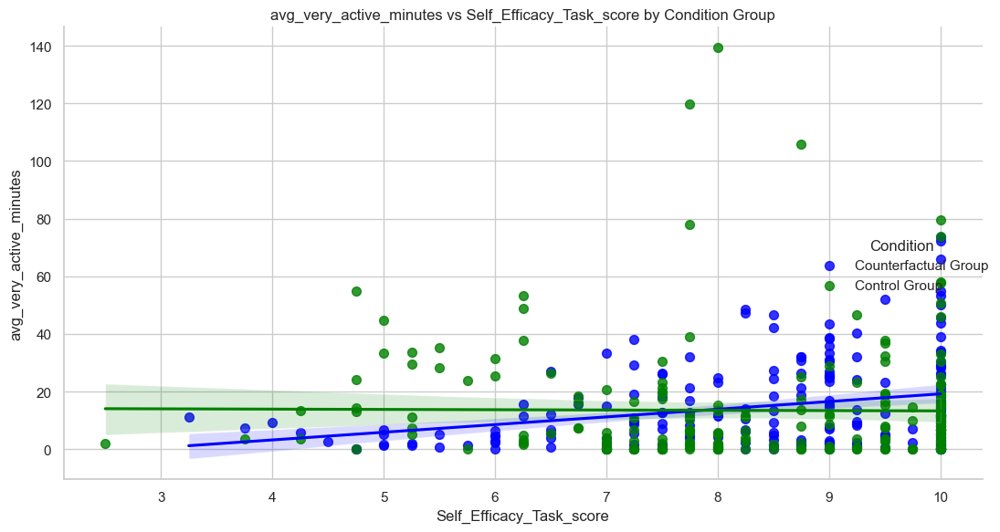

Condition 1: Pearson r = 0.28, p-value = 0.000
Condition 2: Pearson r = -0.01, p-value = 0.908
Condition 1: 2.28, 0.027
Condition 2: 1.22, 0.350


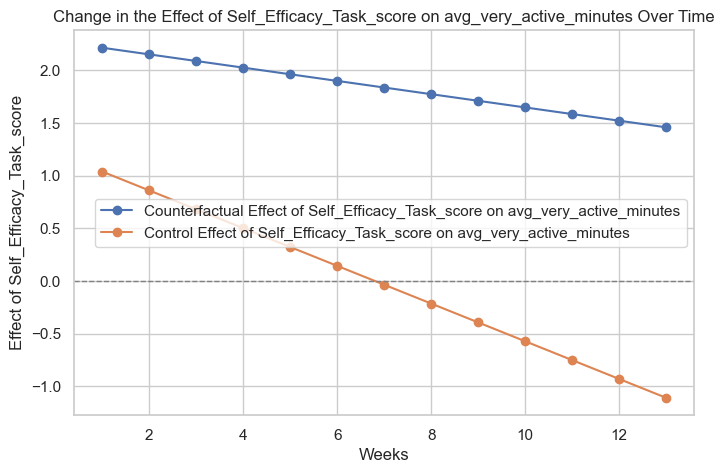

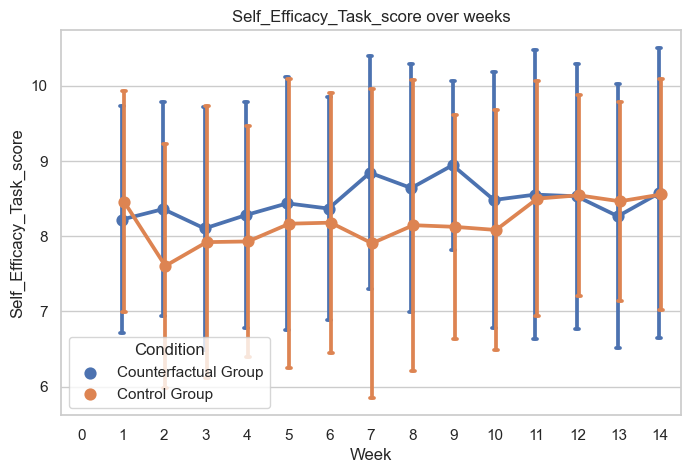


 avg_very_active_minutes Self_Efficacy_Scheduling_score

 avg_very_active_minutes Motivation_Intrinsic_score

 avg_very_active_minutes Motivation_Extrinsic_score

 avg_very_active_minutes Intention_to_Engage_in_Physical_Activity_score

T-test Mean Difference over all Weeks:
T-statistic: 12.3322
P-value: 0.0000


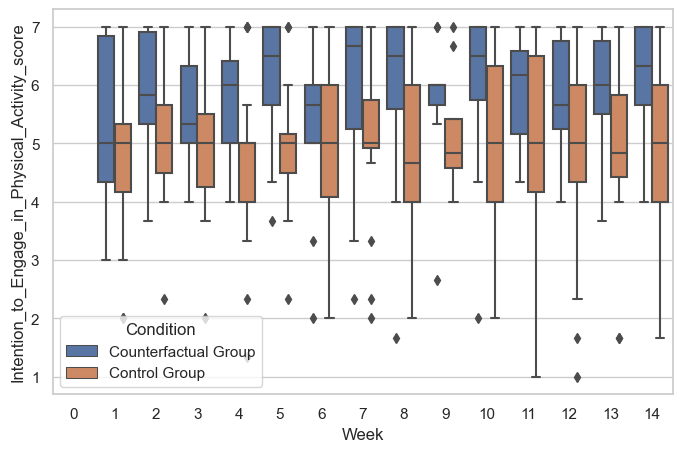

Significant Results found in Counterfactual Group for Intention_to_Engage_in_Physical_Activity_score:

                             Mixed Linear Model Regression Results
Model:                      MixedLM         Dependent Variable:         avg_very_active_minutes
No. Observations:           202             Method:                     REML                   
No. Groups:                 18              Scale:                      57.9994                
Min. group size:            2               Log-Likelihood:             -724.7993              
Max. group size:            13              Converged:                  Yes                    
Mean group size:            11.2                                                               
-----------------------------------------------------------------------------------------------
                                                     Coef.  Std.Err.   z    P>|z| [0.025 0.975]
--------------------------------------------------------------

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

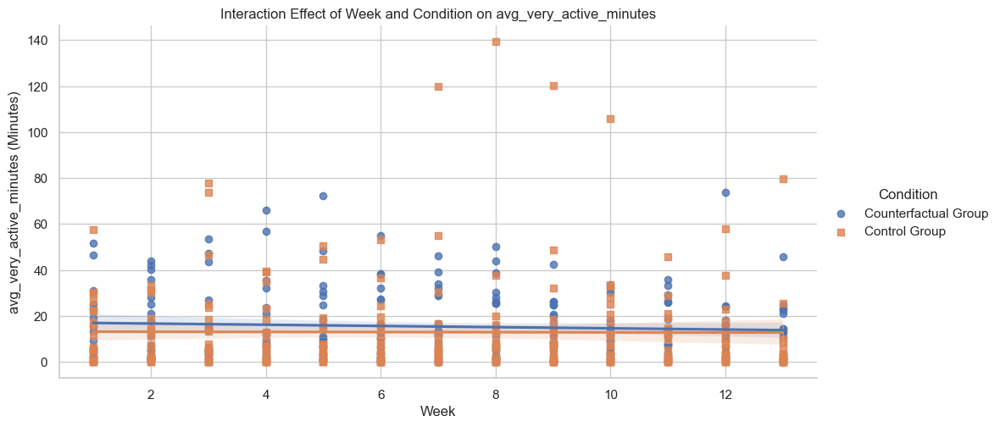

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

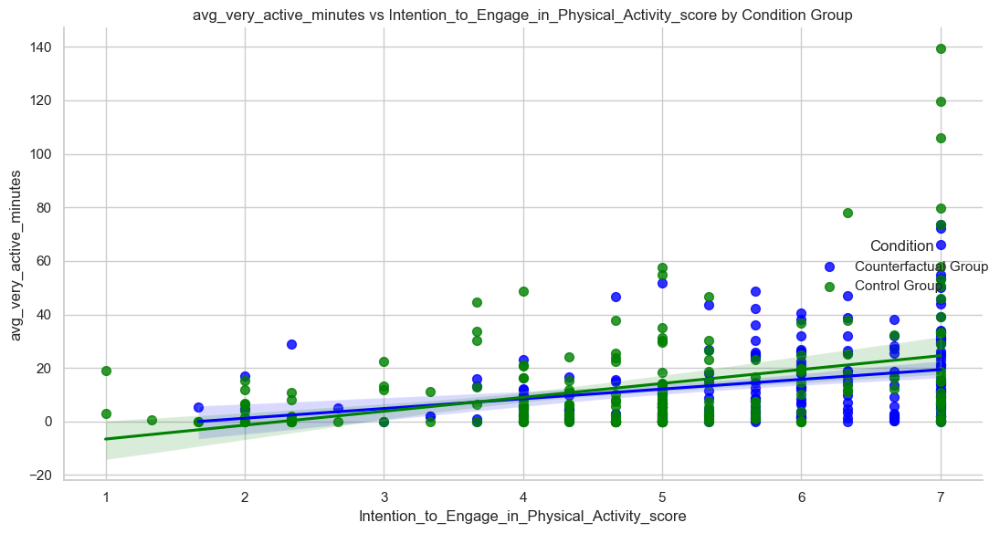

Condition 1: Pearson r = 0.29, p-value = 0.000
Condition 2: Pearson r = 0.37, p-value = 0.000
Condition 1: 2.22, 0.035
Condition 2: 0.79, 0.615


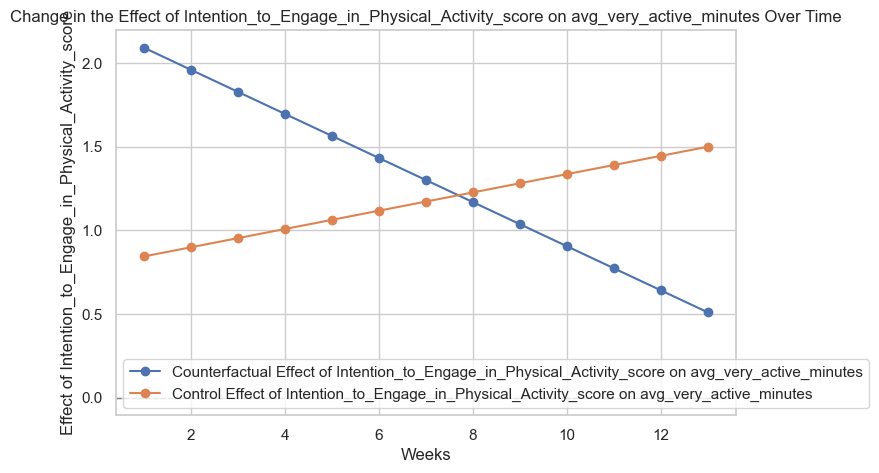

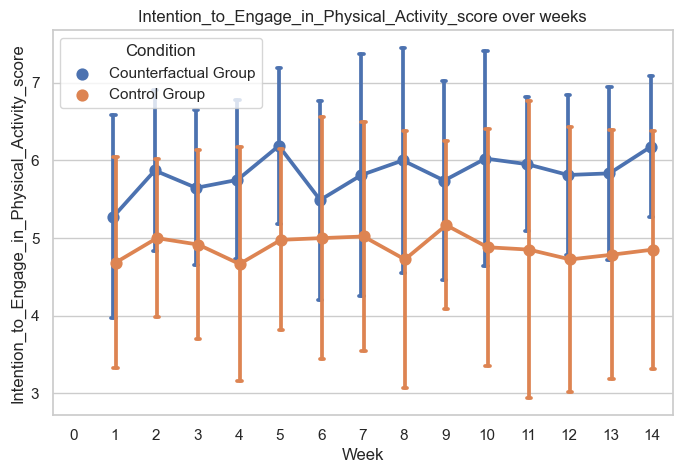


 avg_total_active_minutes Recode_of_contemplation_ladder

 avg_total_active_minutes Self_Efficacy_Coping_score

 avg_total_active_minutes Self_Efficacy_Task_score

T-test Mean Difference over all Weeks:
T-statistic: 2.8887
P-value: 0.0079


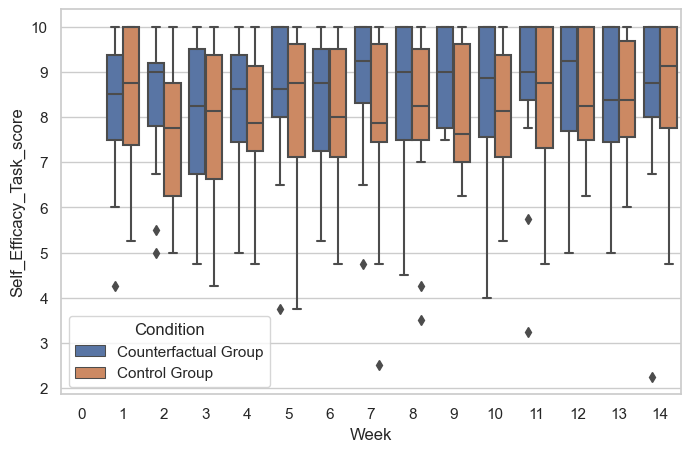

Significant Results found in Counterfactual Group for Self_Efficacy_Task_score:

                   Mixed Linear Model Regression Results
Model:               MixedLM  Dependent Variable:  avg_total_active_minutes
No. Observations:    202      Method:              REML                    
No. Groups:          18       Scale:               1594.7597               
Min. group size:     2        Log-Likelihood:      -1051.7062              
Max. group size:     13       Converged:           Yes                     
Mean group size:     11.2                                                  
---------------------------------------------------------------------------
                               Coef.   Std.Err.   z    P>|z| [0.025  0.975]
---------------------------------------------------------------------------
Intercept                      121.273   46.782  2.592 0.010 29.583 212.964
Self_Efficacy_Task_score        15.556    5.350  2.908 0.004  5.071  26.041
Week                      

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

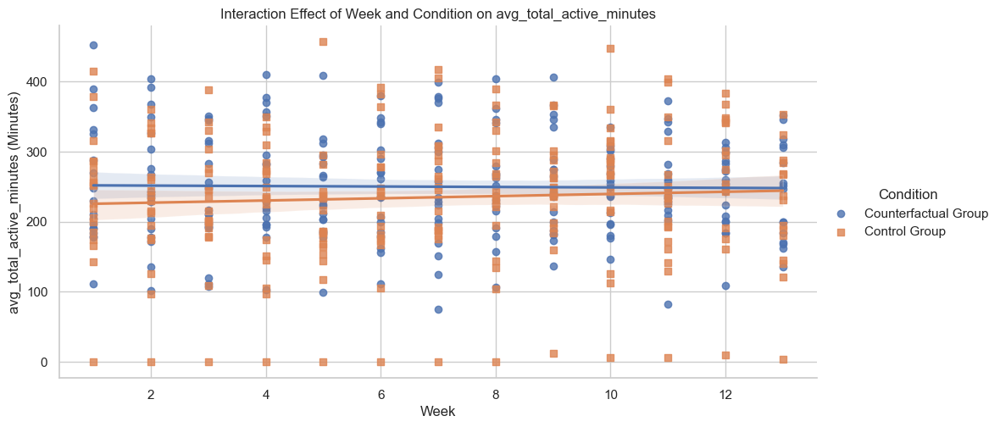

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

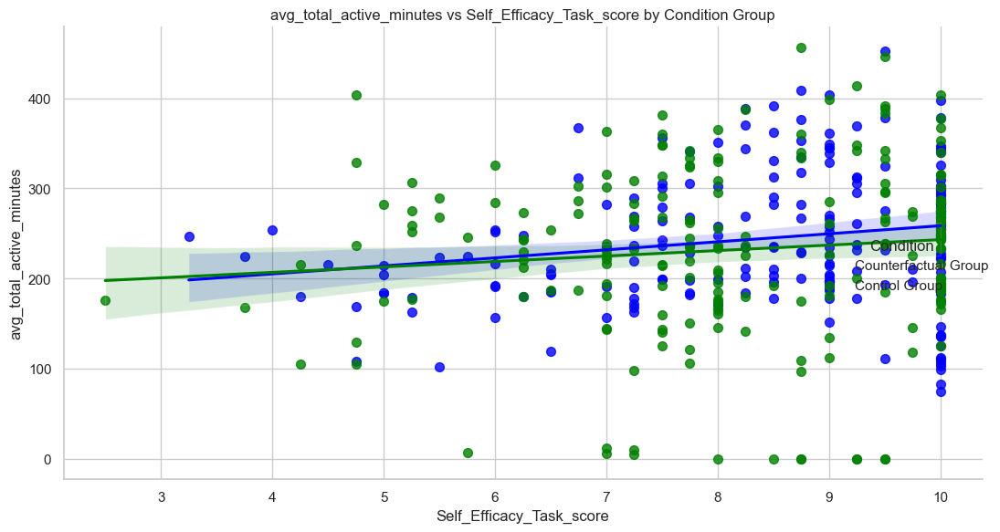

Condition 1: Pearson r = 0.19, p-value = 0.006
Condition 2: Pearson r = 0.10, p-value = 0.139
Condition 1: 15.56, 0.004
Condition 2: -13.24, 0.070


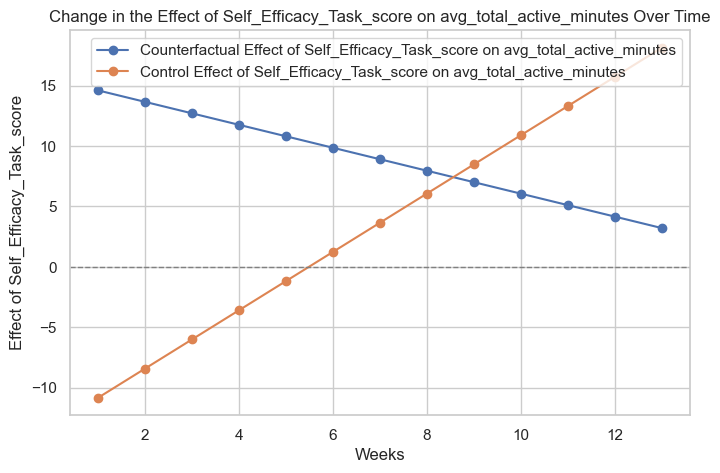

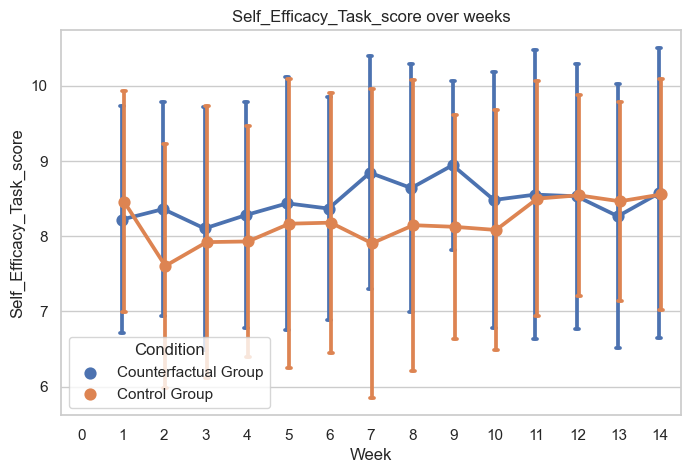


 avg_total_active_minutes Self_Efficacy_Scheduling_score

 avg_total_active_minutes Motivation_Intrinsic_score

T-test Mean Difference over all Weeks:
T-statistic: 2.5835
P-value: 0.0184


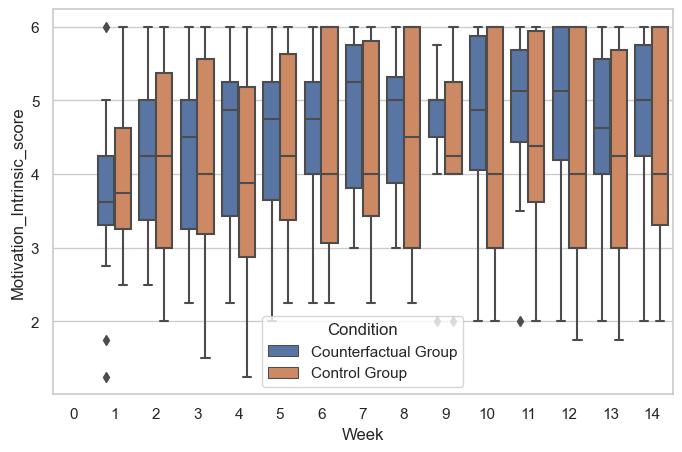

Significant Results found in Counterfactual Group for Motivation_Intrinsic_score:

                    Mixed Linear Model Regression Results
Model:                MixedLM   Dependent Variable:   avg_total_active_minutes
No. Observations:     202       Method:               REML                    
No. Groups:           18        Scale:                1574.5740               
Min. group size:      2         Log-Likelihood:       -1050.2684              
Max. group size:      13        Converged:            Yes                     
Mean group size:      11.2                                                    
------------------------------------------------------------------------------
                                 Coef.   Std.Err.   z    P>|z|  [0.025  0.975]
------------------------------------------------------------------------------
Intercept                        185.309   30.708  6.035 0.000 125.122 245.495
Motivation_Intrinsic_score        15.221    6.419  2.371 0.018   2.63

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

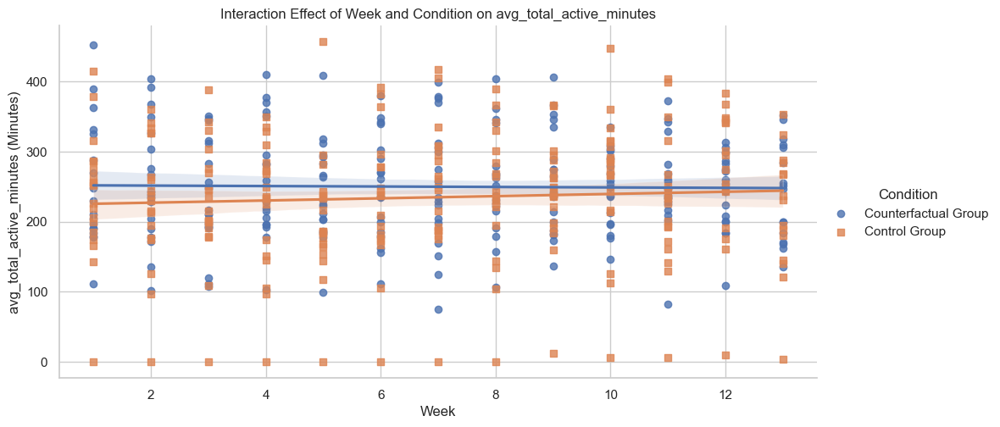

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

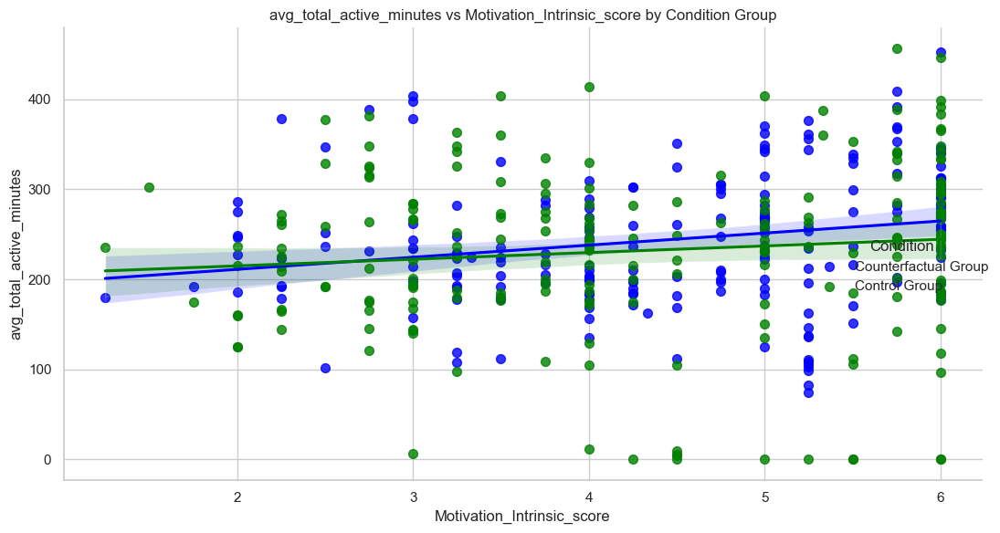

Condition 1: Pearson r = 0.22, p-value = 0.002
Condition 2: Pearson r = 0.10, p-value = 0.136
Condition 1: 15.22, 0.018
Condition 2: -14.37, 0.122


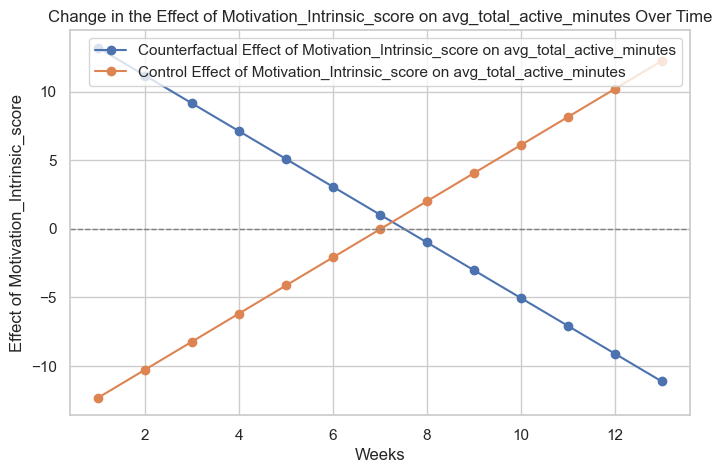

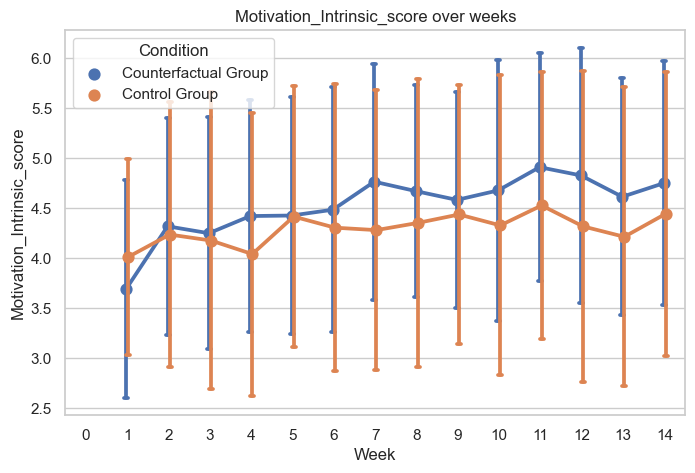


 avg_total_active_minutes Motivation_Extrinsic_score

 avg_total_active_minutes Intention_to_Engage_in_Physical_Activity_score

T-test Mean Difference over all Weeks:
T-statistic: 12.3322
P-value: 0.0000


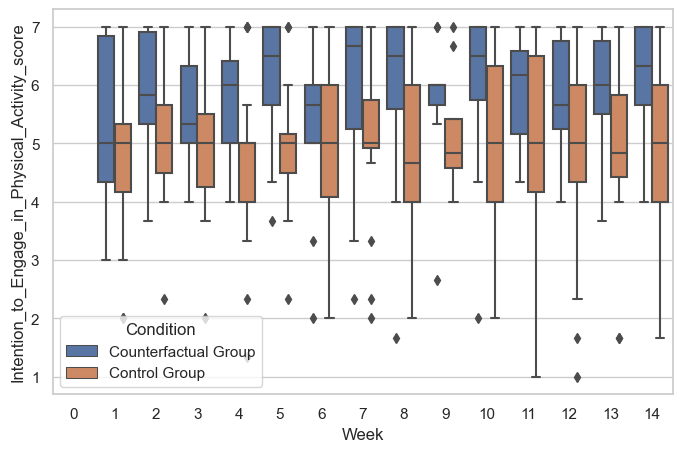

Significant Results found in Counterfactual Group for Intention_to_Engage_in_Physical_Activity_score:

                              Mixed Linear Model Regression Results
Model:                     MixedLM          Dependent Variable:          avg_total_active_minutes
No. Observations:          202              Method:                      REML                    
No. Groups:                18               Scale:                       1572.7390               
Min. group size:           2                Log-Likelihood:              -1050.0972              
Max. group size:           13               Converged:                   Yes                     
Mean group size:           11.2                                                                  
-------------------------------------------------------------------------------------------------
                                                     Coef.   Std.Err.   z    P>|z| [0.025  0.975]
---------------------------------------------

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

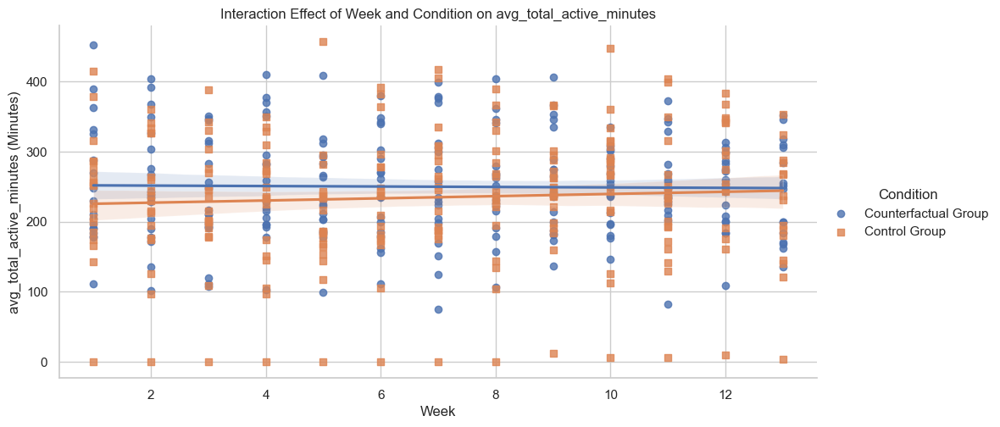

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

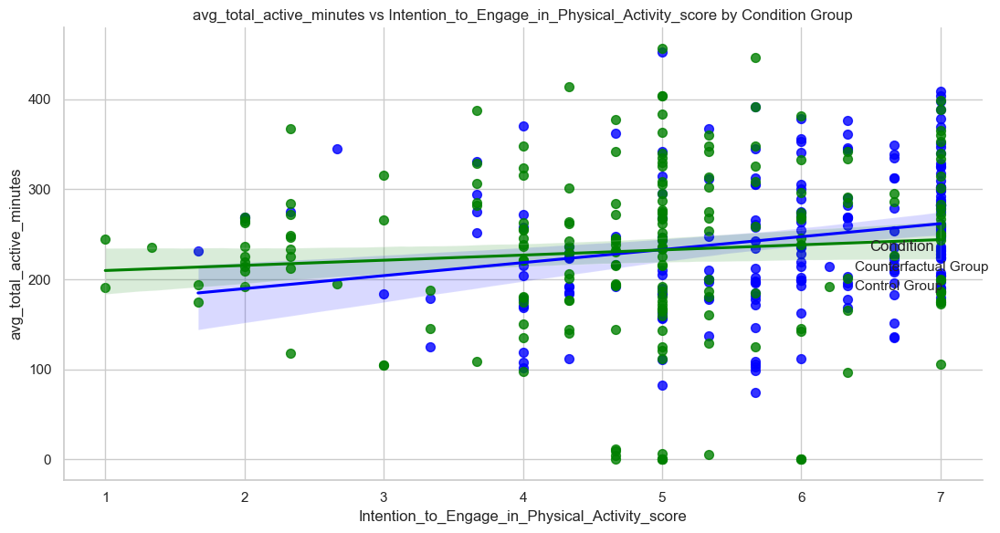

Condition 1: Pearson r = 0.23, p-value = 0.001
Condition 2: Pearson r = 0.09, p-value = 0.219
Condition 1: 18.36, 0.001
Condition 2: -8.42, 0.349


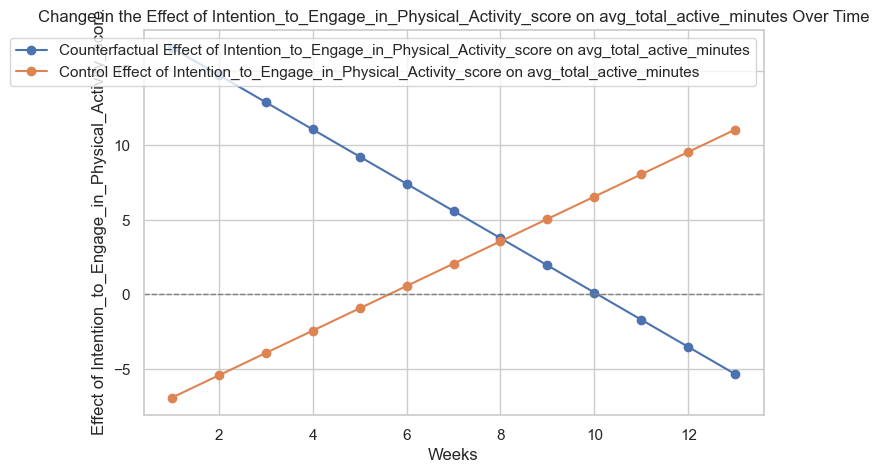

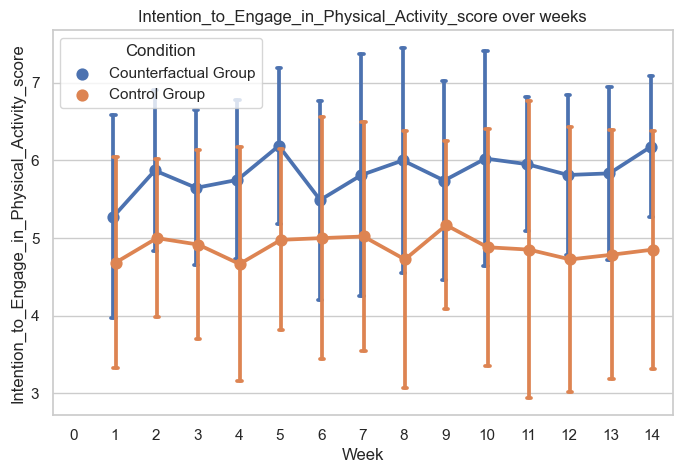


 avg_active_minutes Recode_of_contemplation_ladder

 avg_active_minutes Self_Efficacy_Coping_score

T-test Mean Difference over all Weeks:
T-statistic: 6.1616
P-value: 0.0000


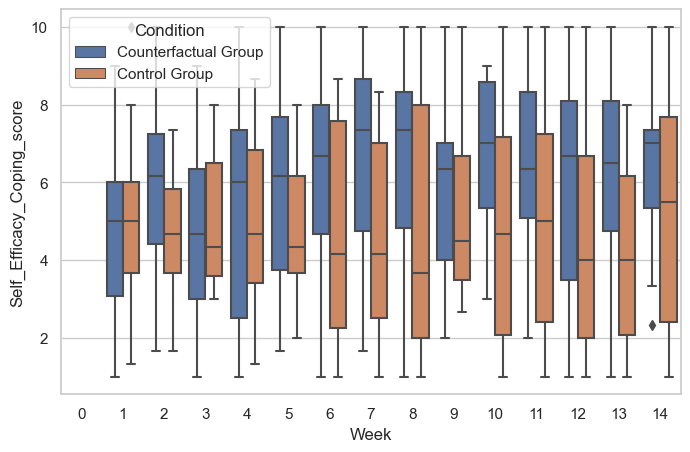

Significant Results found in Counterfactual Group for Self_Efficacy_Coping_score:

                   Mixed Linear Model Regression Results
Model:                 MixedLM    Dependent Variable:    avg_active_minutes
No. Observations:      202        Method:                REML              
No. Groups:            18         Scale:                 194.2499          
Min. group size:       2          Log-Likelihood:        -842.7529         
Max. group size:       13         Converged:             Yes               
Mean group size:       11.2                                                
---------------------------------------------------------------------------
                                 Coef.  Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------------------------
Intercept                        16.422    7.479  2.196 0.028  1.764 31.080
Self_Efficacy_Coping_score        3.126    1.064  2.938 0.003  1.041  5.211
Week                    

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

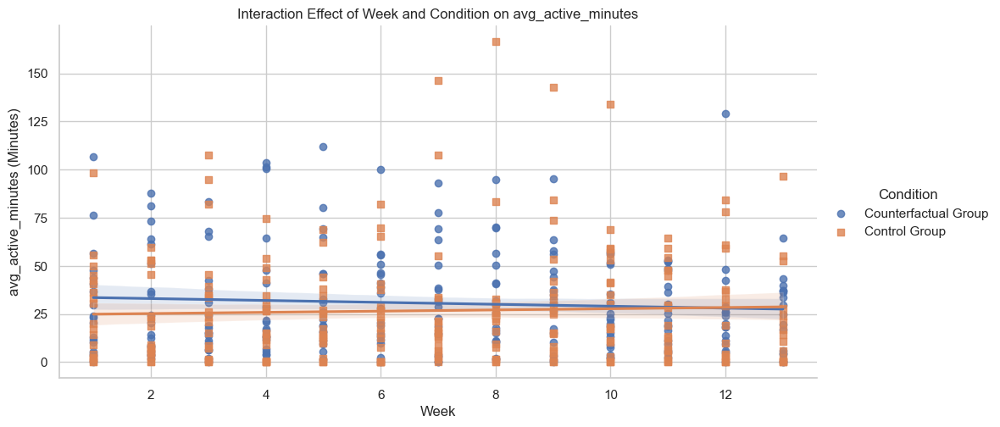

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

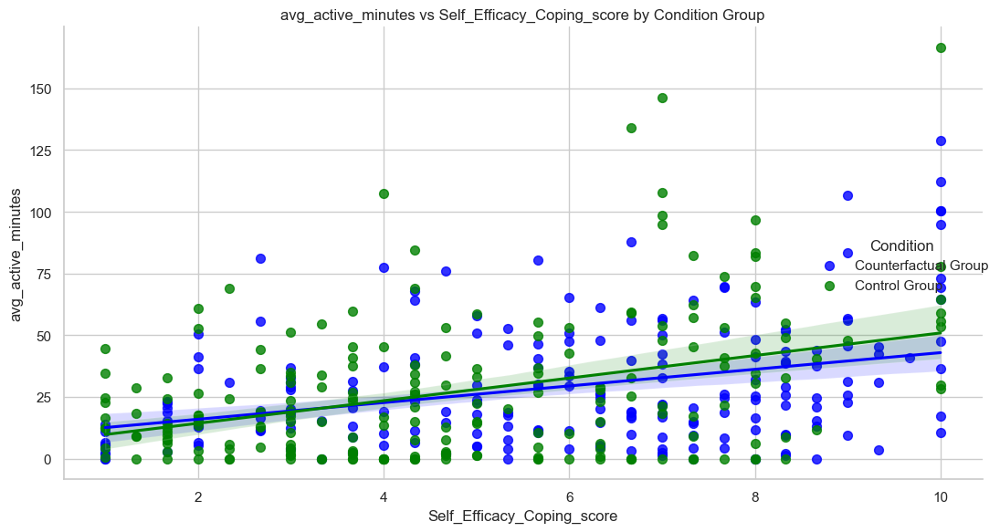

Condition 1: Pearson r = 0.35, p-value = 0.000
Condition 2: Pearson r = 0.38, p-value = 0.000
Condition 1: 3.13, 0.003
Condition 2: 1.45, 0.378


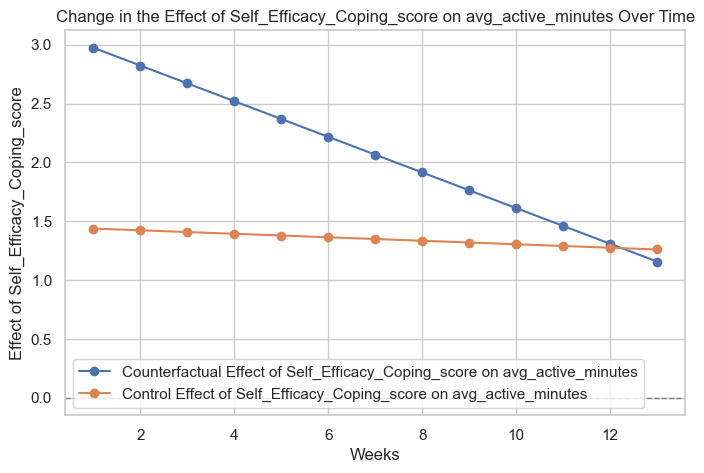

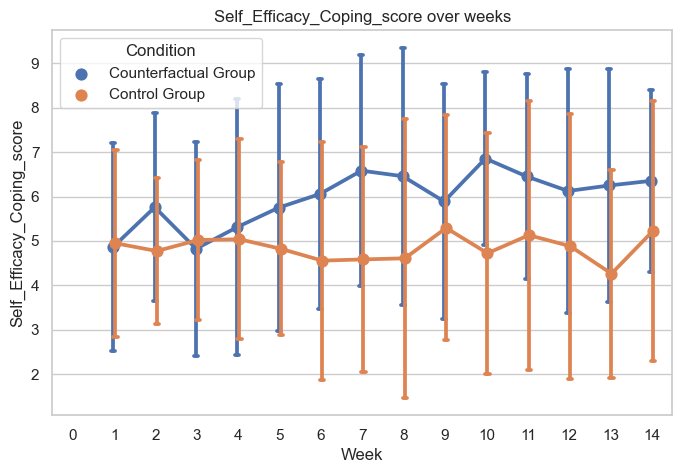


 avg_active_minutes Self_Efficacy_Task_score

T-test Mean Difference over all Weeks:
T-statistic: 2.8887
P-value: 0.0079


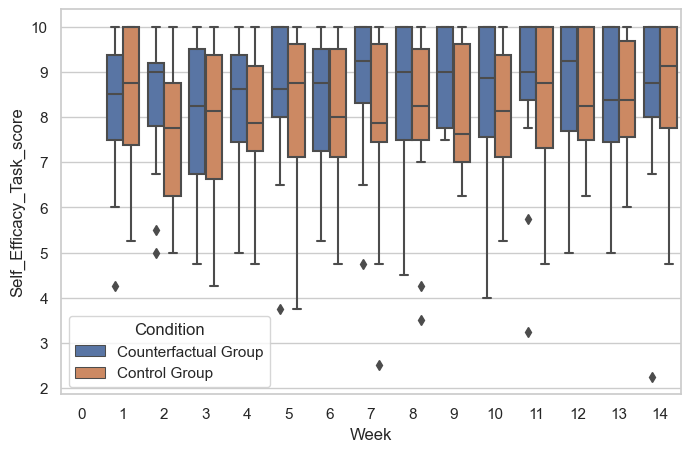

Significant Results found in Counterfactual Group for Self_Efficacy_Task_score:

                  Mixed Linear Model Regression Results
Model:                MixedLM    Dependent Variable:    avg_active_minutes
No. Observations:     202        Method:                REML              
No. Groups:           18         Scale:                 194.2501          
Min. group size:      2          Log-Likelihood:        -841.9507         
Max. group size:      13         Converged:             Yes               
Mean group size:      11.2                                                
--------------------------------------------------------------------------
                               Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
--------------------------------------------------------------------------
Intercept                      -3.850   16.125 -0.239 0.811 -35.454 27.753
Self_Efficacy_Task_score        4.438    1.856  2.392 0.017   0.801  8.075
Week                           -0.188 

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

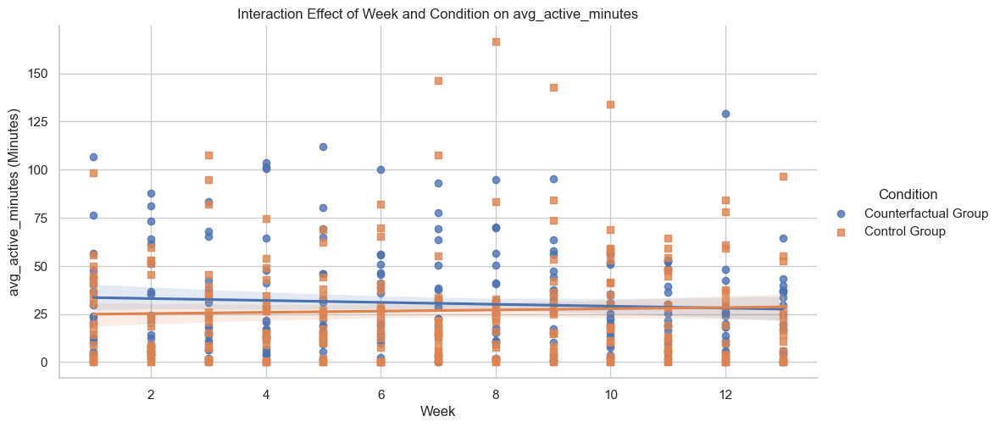

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

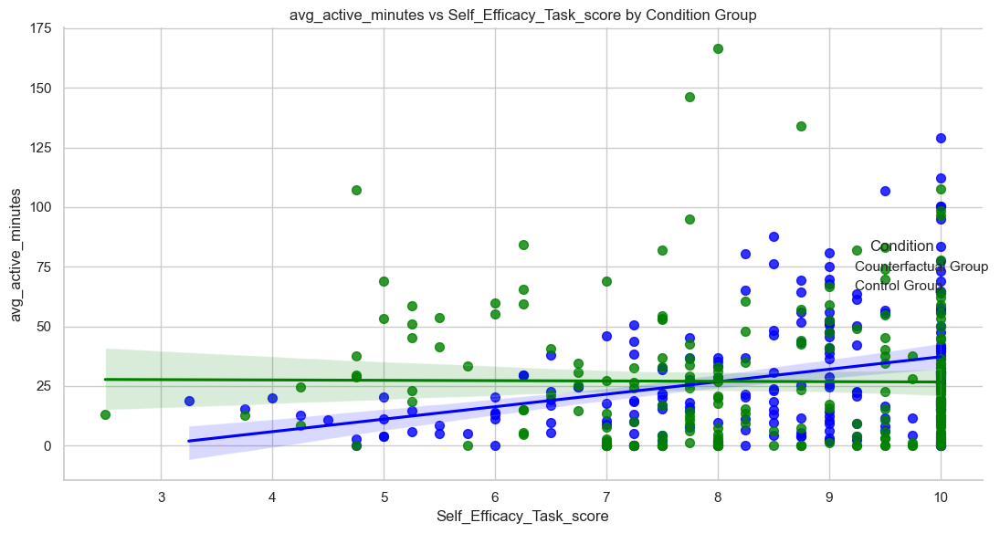

Condition 1: Pearson r = 0.33, p-value = 0.000
Condition 2: Pearson r = -0.01, p-value = 0.911
Condition 1: 4.44, 0.017
Condition 2: 0.90, 0.659


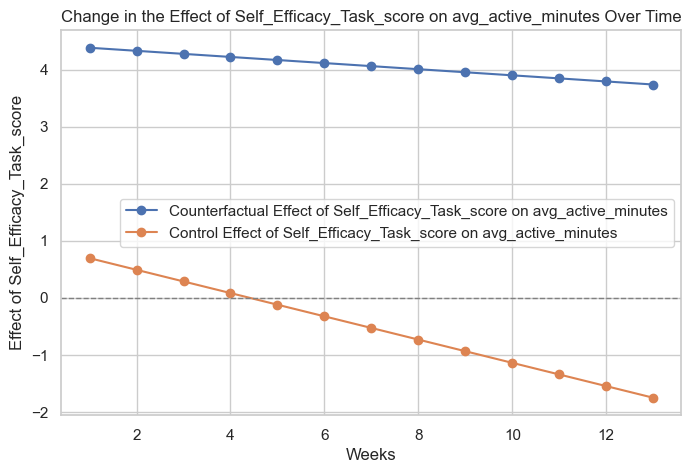

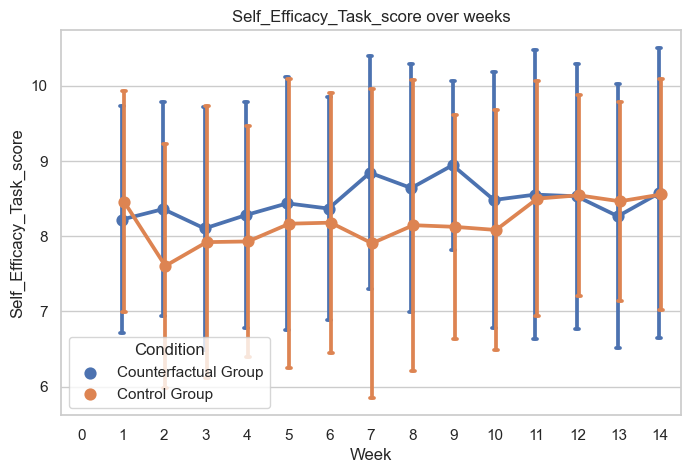


 avg_active_minutes Self_Efficacy_Scheduling_score

 avg_active_minutes Motivation_Intrinsic_score

T-test Mean Difference over all Weeks:
T-statistic: 2.5835
P-value: 0.0184


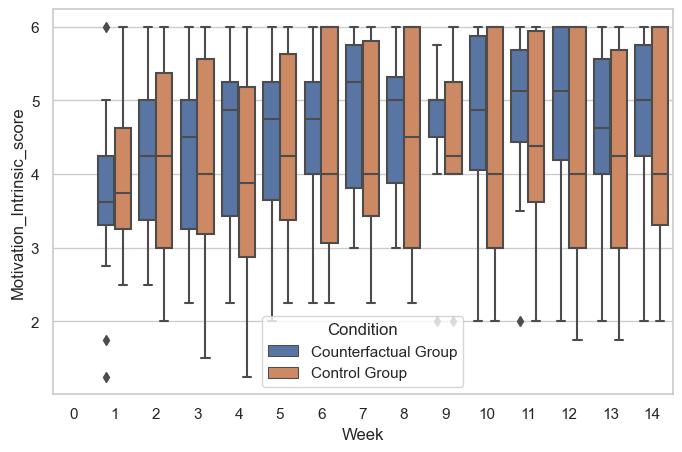

Significant Results found in Counterfactual Group for Motivation_Intrinsic_score:

                   Mixed Linear Model Regression Results
Model:                 MixedLM    Dependent Variable:    avg_active_minutes
No. Observations:      202        Method:                REML              
No. Groups:            18         Scale:                 199.4581          
Min. group size:       2          Log-Likelihood:        -844.0631         
Max. group size:       13         Converged:             Yes               
Mean group size:       11.2                                                
---------------------------------------------------------------------------
                                 Coef.  Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------------------------
Intercept                        15.788   10.687  1.477 0.140 -5.159 36.735
Motivation_Intrinsic_score        4.134    2.280  1.813 0.070 -0.334  8.602
Week                    

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

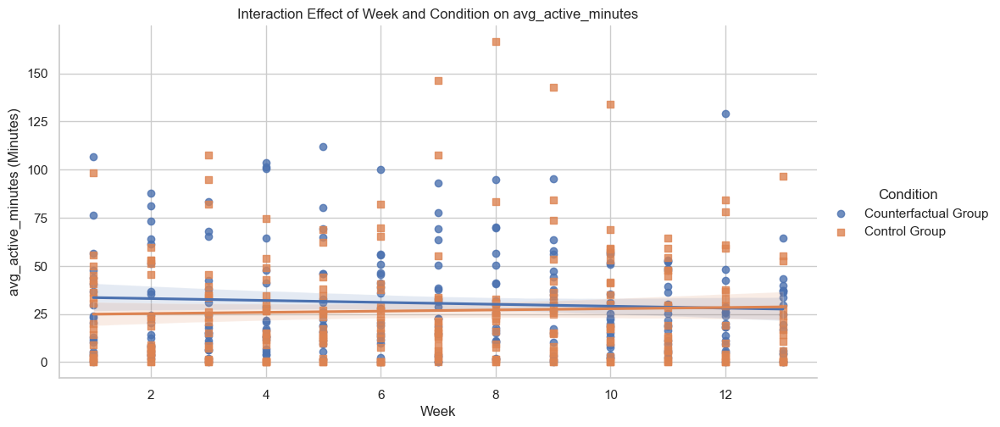

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

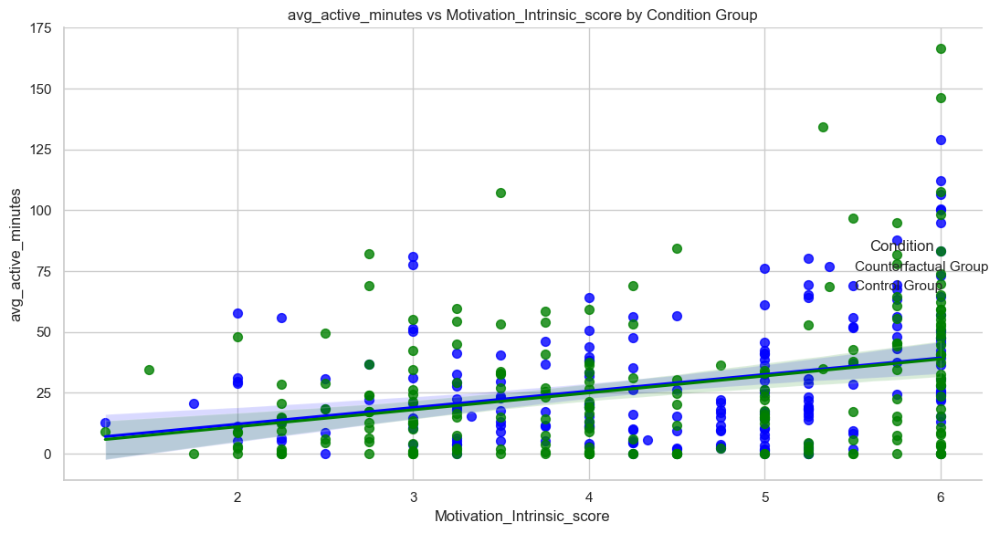

Condition 1: Pearson r = 0.32, p-value = 0.000
Condition 2: Pearson r = 0.32, p-value = 0.000
Condition 1: 4.13, 0.070
Condition 2: 2.24, 0.380


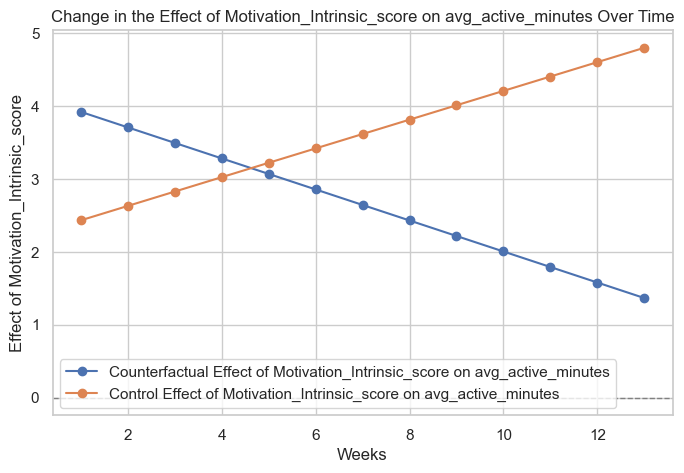

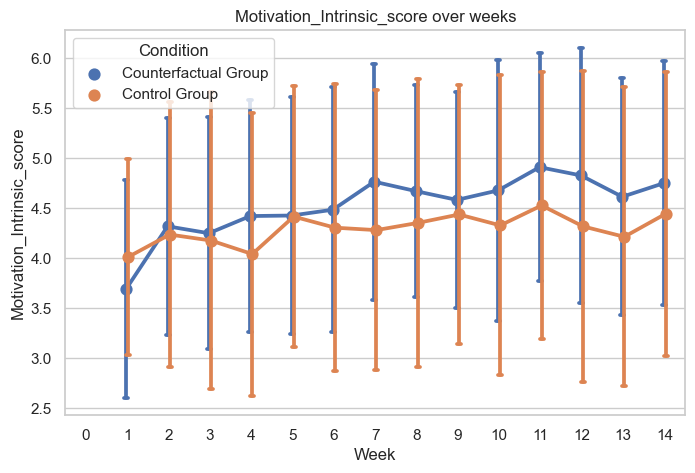


 avg_active_minutes Motivation_Extrinsic_score

 avg_active_minutes Intention_to_Engage_in_Physical_Activity_score

T-test Mean Difference over all Weeks:
T-statistic: 12.3322
P-value: 0.0000


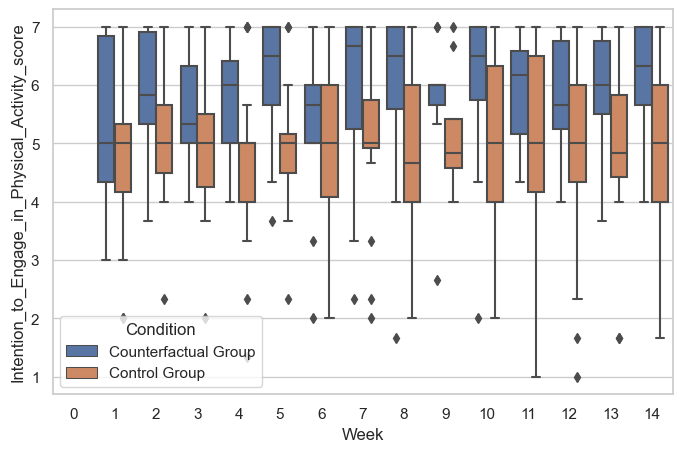

Significant Results found in Counterfactual Group for Intention_to_Engage_in_Physical_Activity_score:

                             Mixed Linear Model Regression Results
Model:                        MixedLM           Dependent Variable:           avg_active_minutes
No. Observations:             202               Method:                       REML              
No. Groups:                   18                Scale:                        196.9890          
Min. group size:              2                 Log-Likelihood:               -843.2822         
Max. group size:              13                Converged:                    Yes               
Mean group size:              11.2                                                              
------------------------------------------------------------------------------------------------
                                                     Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
------------------------------------------------------

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

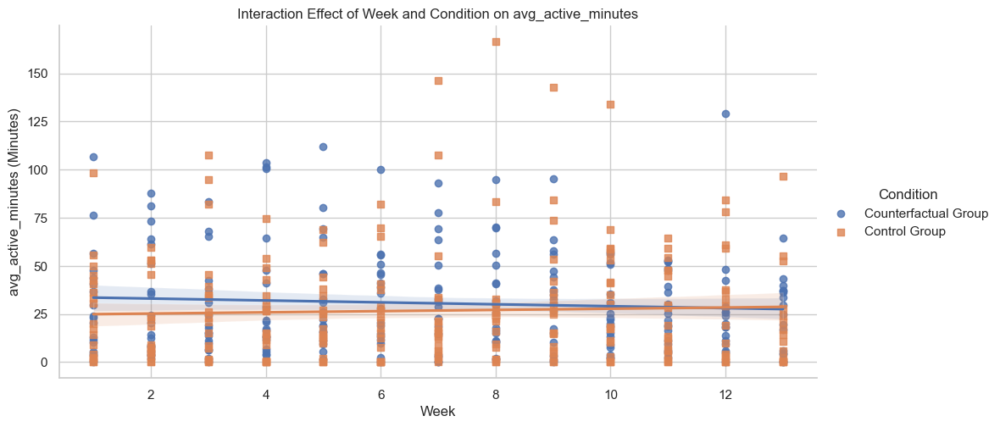

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

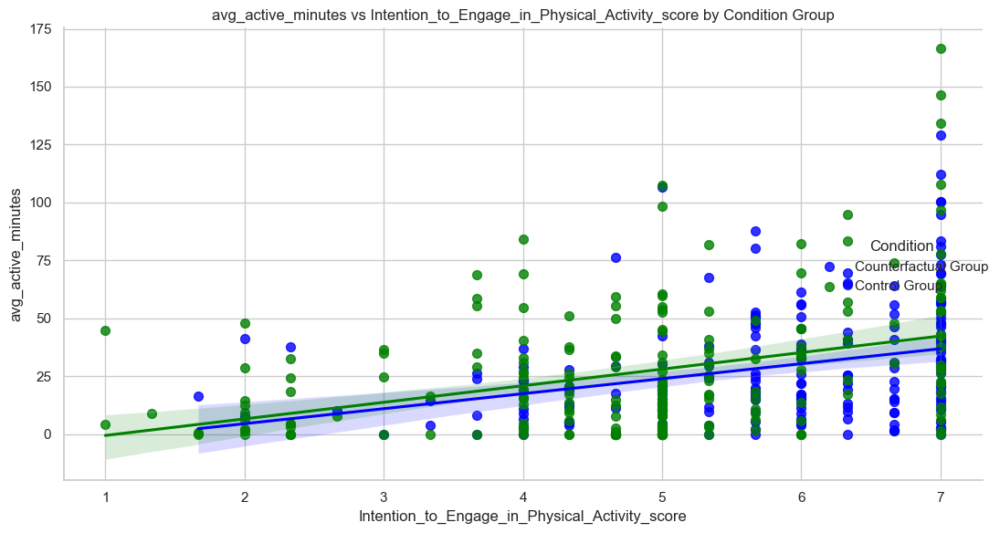

Condition 1: Pearson r = 0.31, p-value = 0.000
Condition 2: Pearson r = 0.35, p-value = 0.000
Condition 1: 3.86, 0.047
Condition 2: 1.24, 0.617


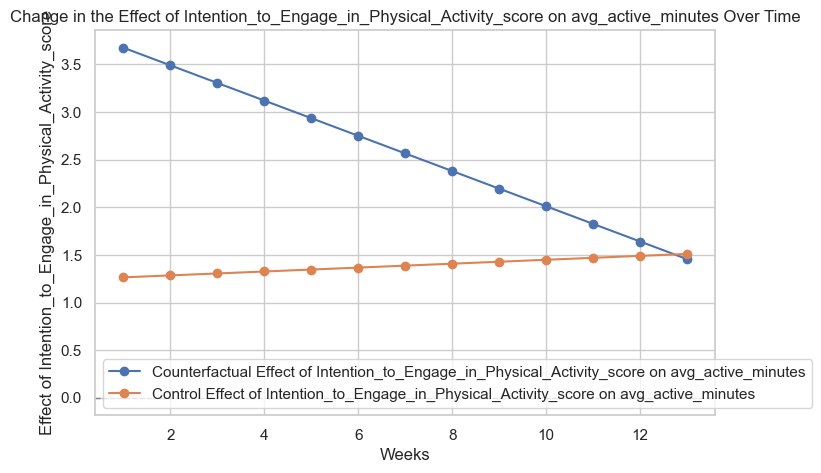

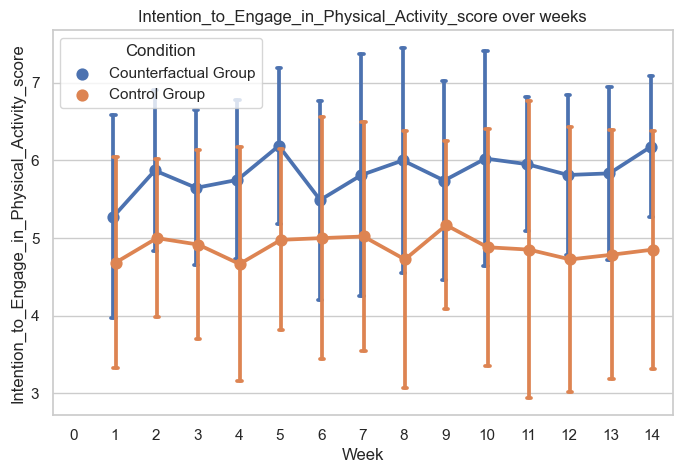


 avg_calories Recode_of_contemplation_ladder

T-test Mean Difference over all Weeks:
T-statistic: 7.4249
P-value: 0.0000


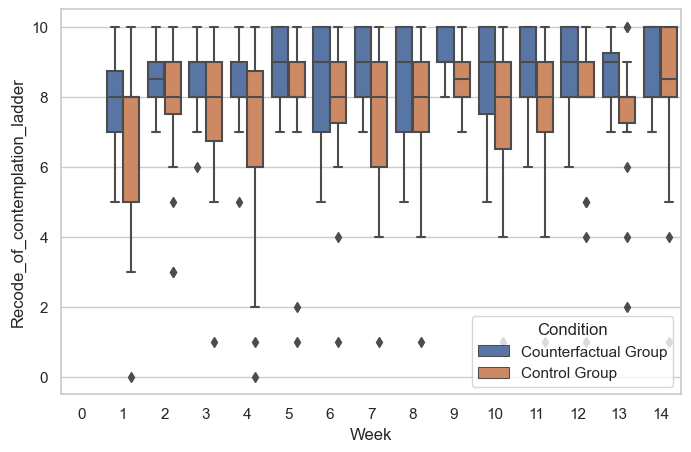

Significant Results found in Counterfactual Group for Recode_of_contemplation_ladder:

                        Mixed Linear Model Regression Results
Model:                      MixedLM          Dependent Variable:          avg_calories
No. Observations:           202              Method:                      REML        
No. Groups:                 18               Scale:                       43858.6656  
Min. group size:            2                Log-Likelihood:              -1387.7876  
Max. group size:            13               Converged:                   Yes         
Mean group size:            11.2                                                      
--------------------------------------------------------------------------------------
                                      Coef.    Std.Err.   z    P>|z|  [0.025   0.975] 
--------------------------------------------------------------------------------------
Intercept                             3031.965  263.430 11.510 0.000

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

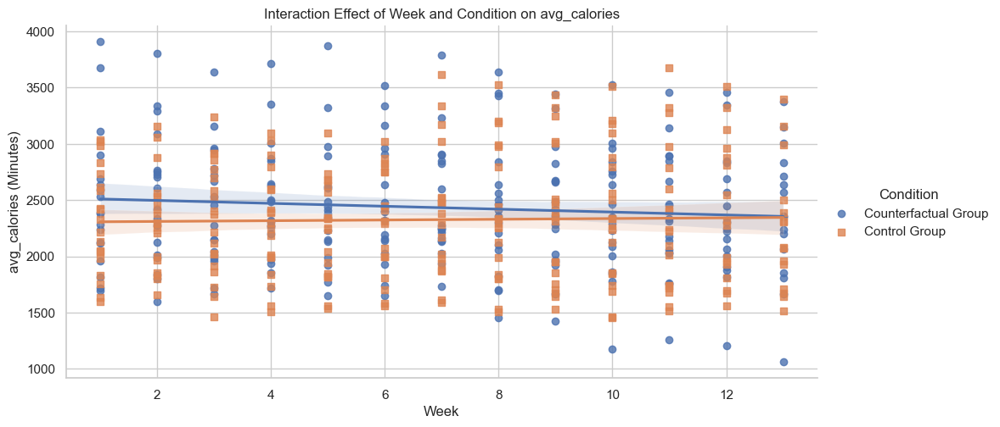

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

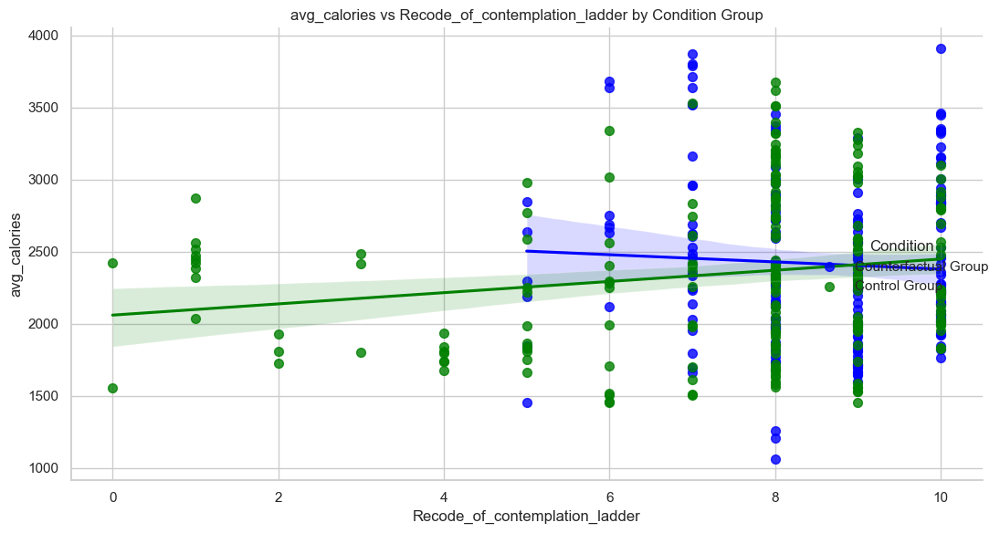

Condition 1: Pearson r = -0.06, p-value = 0.409
Condition 2: Pearson r = 0.17, p-value = 0.017
Condition 1: -60.24, 0.031
Condition 2: 14.64, 0.376


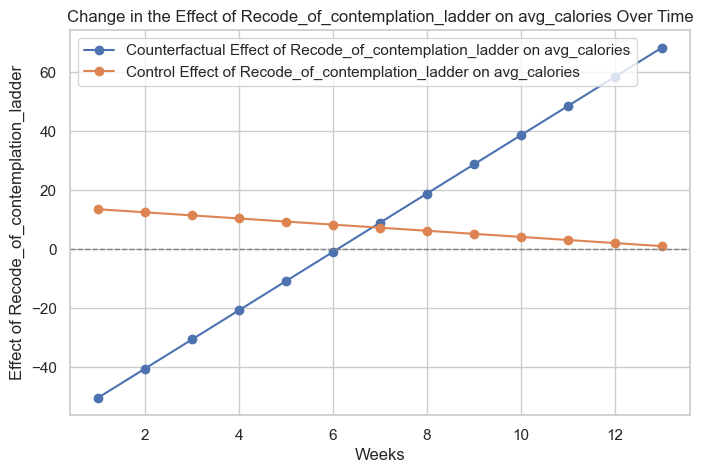

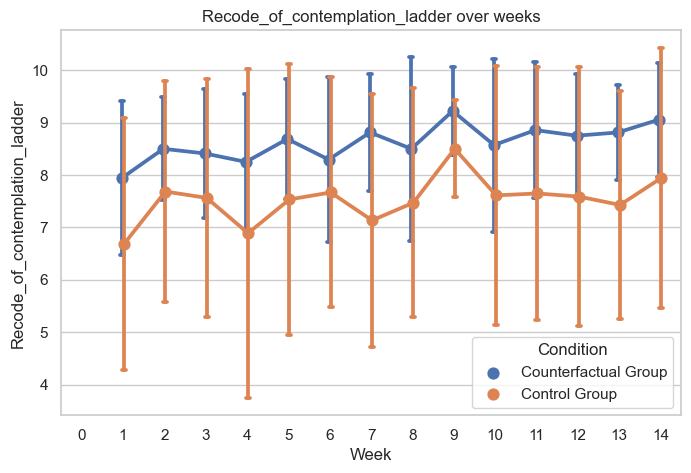


 avg_calories Self_Efficacy_Coping_score

T-test Mean Difference over all Weeks:
T-statistic: 6.1616
P-value: 0.0000


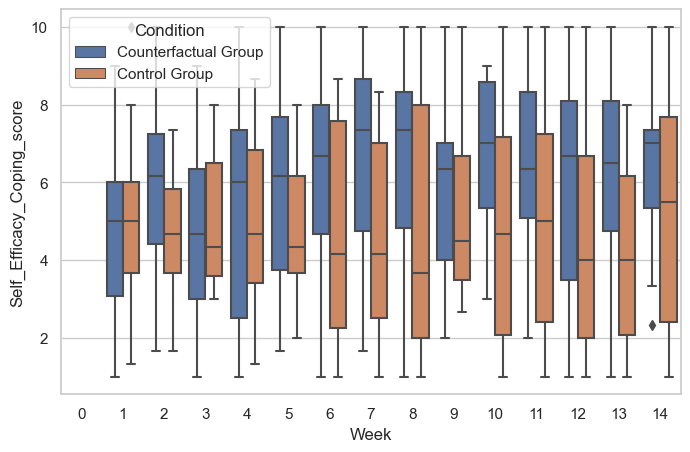

Significant Results found in Counterfactual Group for Self_Efficacy_Coping_score:

                      Mixed Linear Model Regression Results
Model:                    MixedLM         Dependent Variable:         avg_calories
No. Observations:         202             Method:                     REML        
No. Groups:               18              Scale:                      42797.4749  
Min. group size:          2               Log-Likelihood:             -1385.9848  
Max. group size:          13              Converged:                  Yes         
Mean group size:          11.2                                                    
----------------------------------------------------------------------------------
                                  Coef.    Std.Err.   z    P>|z|  [0.025   0.975] 
----------------------------------------------------------------------------------
Intercept                         2540.767  147.391 17.238 0.000 2251.886 2829.648
Self_Efficacy_Coping_score 

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

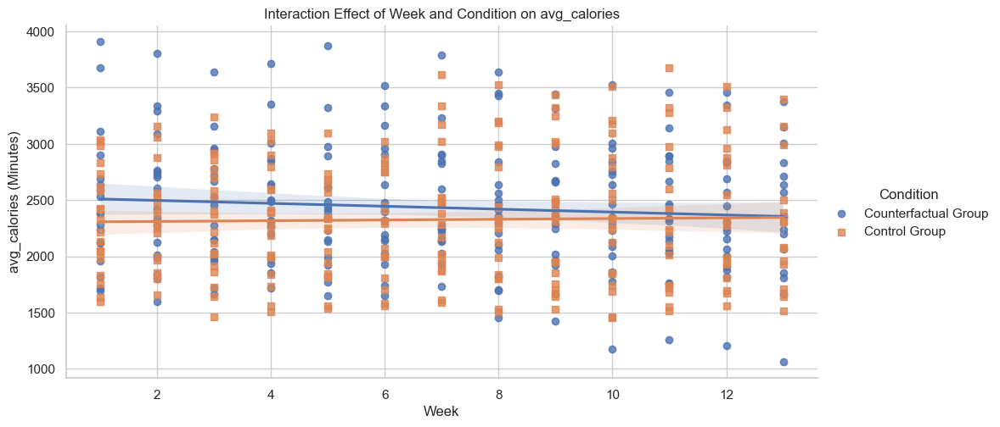

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

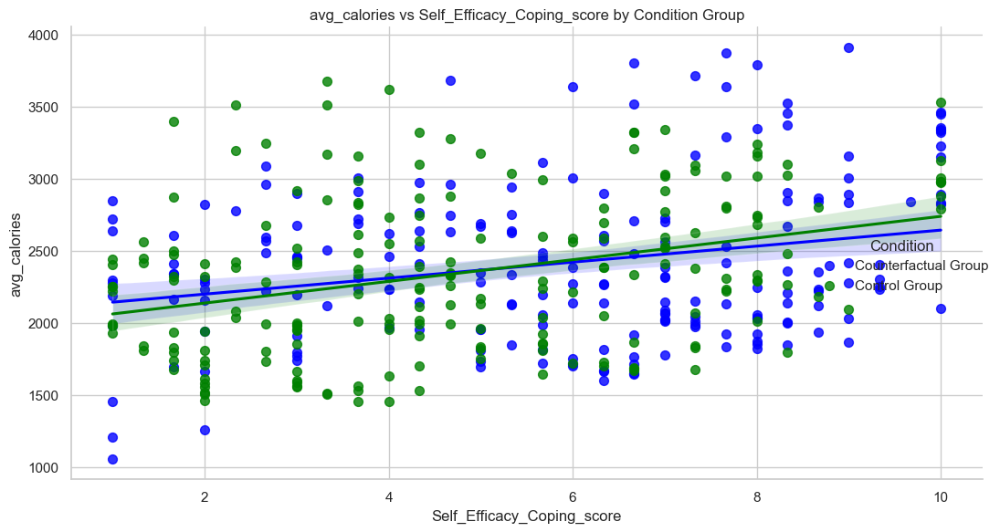

Condition 1: Pearson r = 0.25, p-value = 0.000
Condition 2: Pearson r = 0.33, p-value = 0.000
Condition 1: -0.65, 0.968
Condition 2: 15.73, 0.444


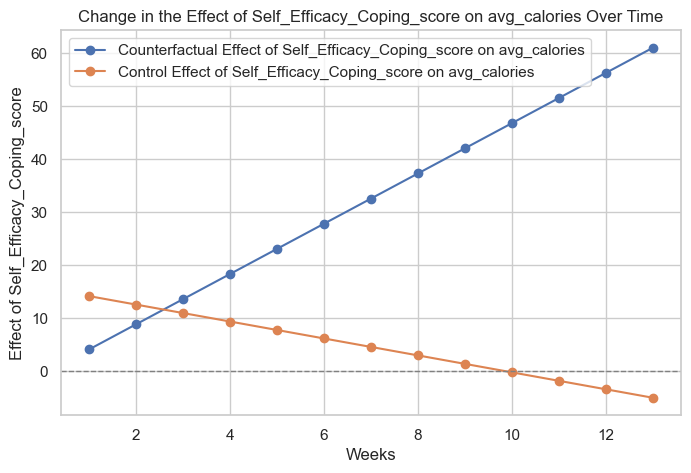

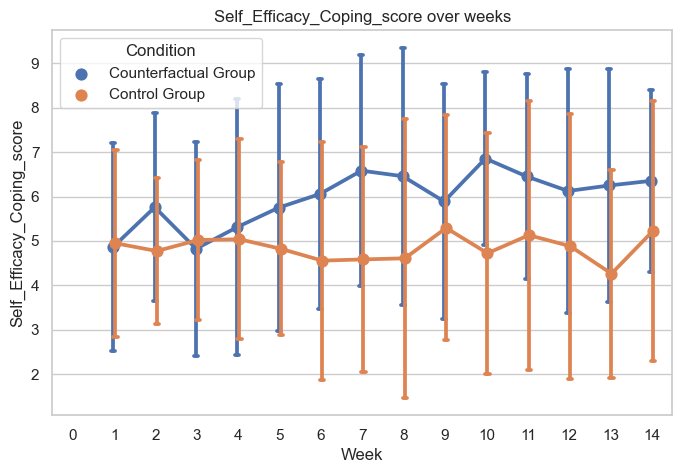


 avg_calories Self_Efficacy_Task_score

T-test Mean Difference over all Weeks:
T-statistic: 2.8887
P-value: 0.0079


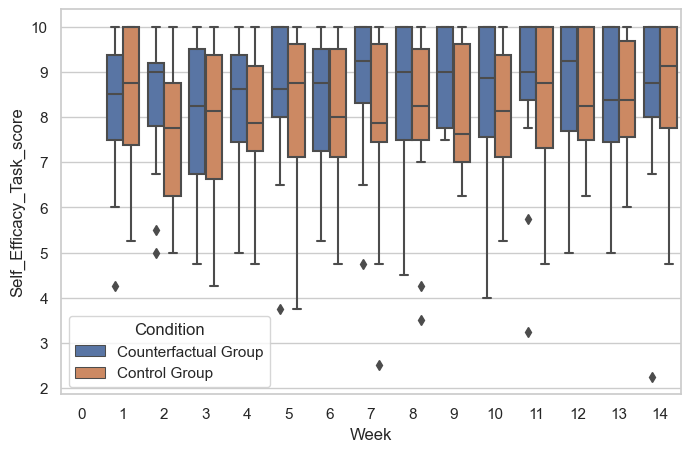

Significant Results found in Counterfactual Group for Self_Efficacy_Task_score:

                     Mixed Linear Model Regression Results
Model:                    MixedLM        Dependent Variable:        avg_calories
No. Observations:         202            Method:                    REML        
No. Groups:               18             Scale:                     40297.7296  
Min. group size:          2              Log-Likelihood:            -1380.0009  
Max. group size:          13             Converged:                 Yes         
Mean group size:          11.2                                                  
--------------------------------------------------------------------------------
                                Coef.    Std.Err.   z    P>|z|  [0.025   0.975] 
--------------------------------------------------------------------------------
Intercept                       1648.487  260.074  6.339 0.000 1138.750 2158.223
Self_Efficacy_Task_score         106.166   27.715 

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

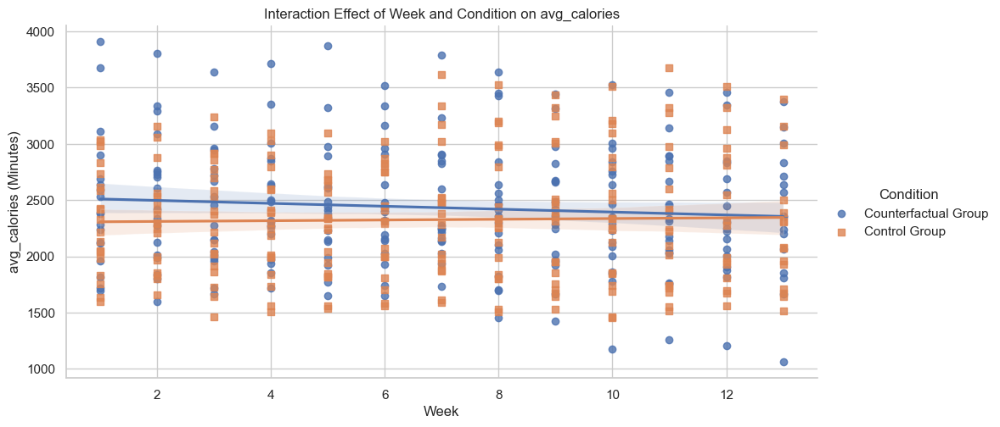

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

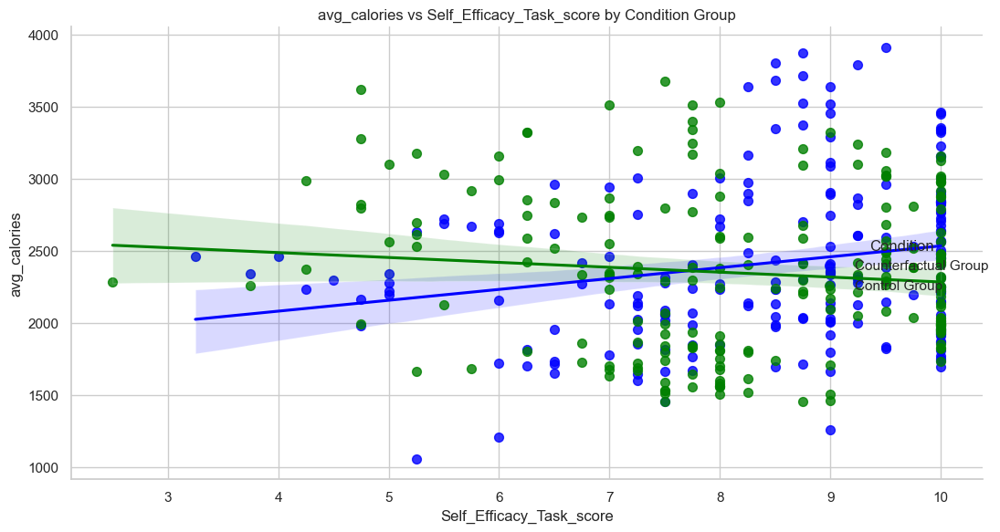

Condition 1: Pearson r = 0.21, p-value = 0.002
Condition 2: Pearson r = -0.10, p-value = 0.149
Condition 1: 106.17, 0.000
Condition 2: -22.90, 0.368


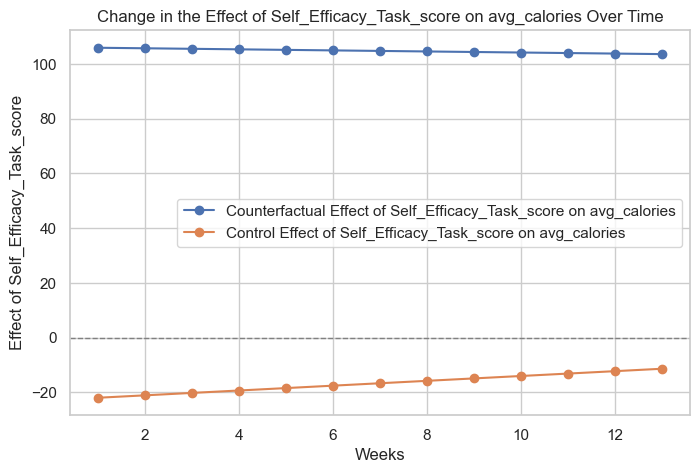

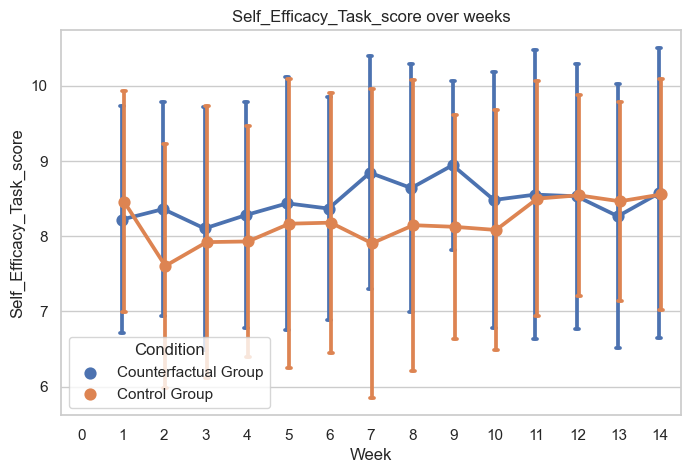


 avg_calories Self_Efficacy_Scheduling_score

 avg_calories Motivation_Intrinsic_score

T-test Mean Difference over all Weeks:
T-statistic: 2.5835
P-value: 0.0184


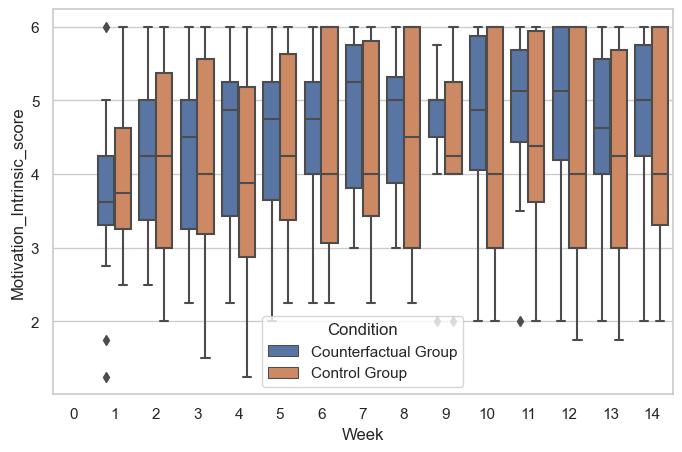

Significant Results found in Counterfactual Group for Motivation_Intrinsic_score:

                      Mixed Linear Model Regression Results
Model:                    MixedLM         Dependent Variable:         avg_calories
No. Observations:         202             Method:                     REML        
No. Groups:               18              Scale:                      45021.7149  
Min. group size:          2               Log-Likelihood:             -1389.4953  
Max. group size:          13              Converged:                  Yes         
Mean group size:          11.2                                                    
----------------------------------------------------------------------------------
                                  Coef.    Std.Err.   z    P>|z|  [0.025   0.975] 
----------------------------------------------------------------------------------
Intercept                         2258.486  189.506 11.918 0.000 1887.061 2629.910
Motivation_Intrinsic_score 

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

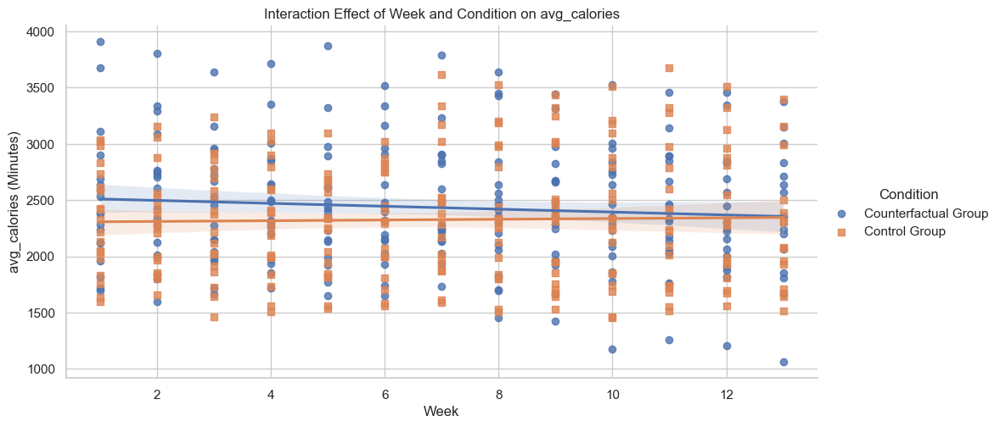

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

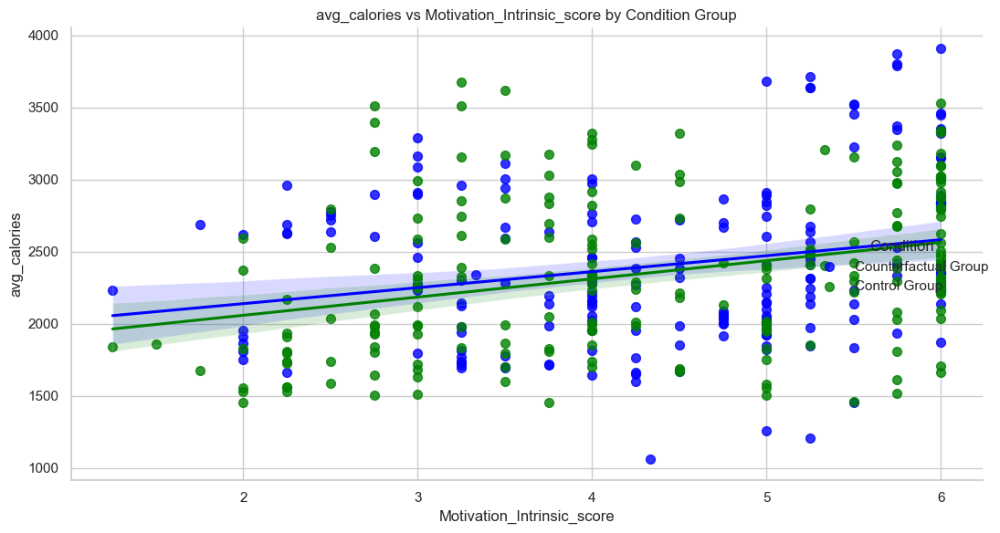

Condition 1: Pearson r = 0.23, p-value = 0.001
Condition 2: Pearson r = 0.31, p-value = 0.000
Condition 1: 63.81, 0.067
Condition 2: -6.26, 0.845


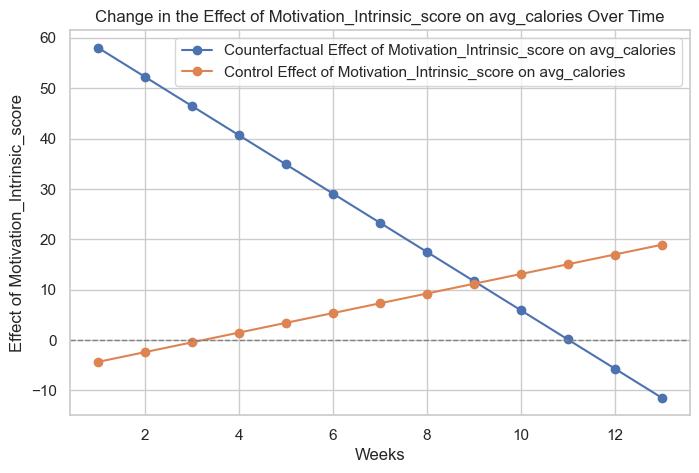

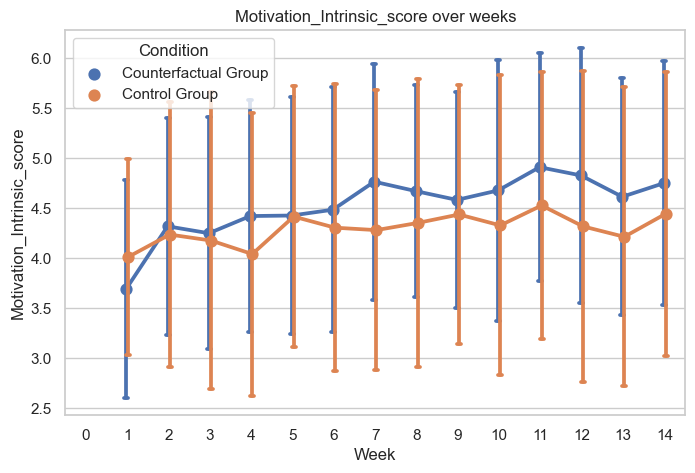


 avg_calories Motivation_Extrinsic_score

T-test Mean Difference over all Weeks:
T-statistic: 6.4462
P-value: 0.0000


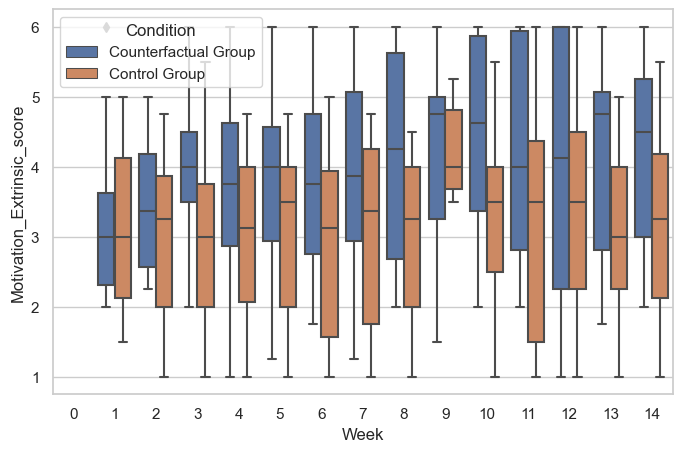

Significant Results found in Counterfactual Group for Motivation_Extrinsic_score:

                      Mixed Linear Model Regression Results
Model:                    MixedLM         Dependent Variable:         avg_calories
No. Observations:         202             Method:                     REML        
No. Groups:               18              Scale:                      44100.1289  
Min. group size:          2               Log-Likelihood:             -1387.4729  
Max. group size:          13              Converged:                  Yes         
Mean group size:          11.2                                                    
----------------------------------------------------------------------------------
                                  Coef.    Std.Err.   z    P>|z|  [0.025   0.975] 
----------------------------------------------------------------------------------
Intercept                         2602.329  169.354 15.366 0.000 2270.402 2934.256
Motivation_Extrinsic_score 

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

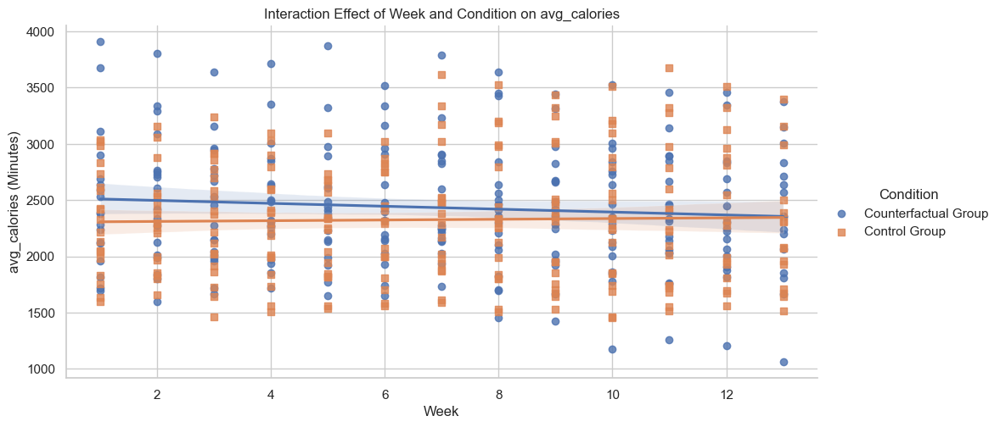

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

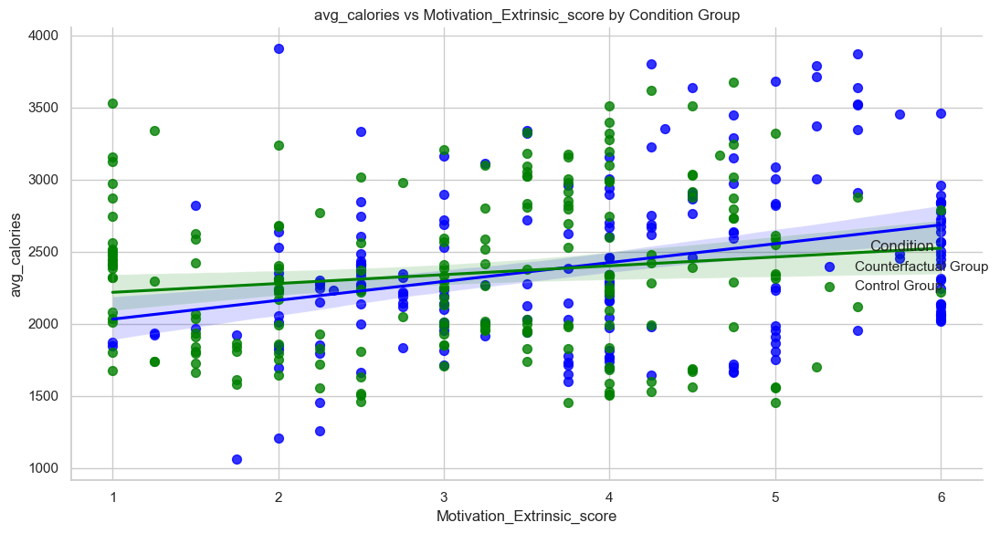

Condition 1: Pearson r = 0.33, p-value = 0.000
Condition 2: Pearson r = 0.15, p-value = 0.037
Condition 1: -19.16, 0.565
Condition 2: 30.72, 0.366


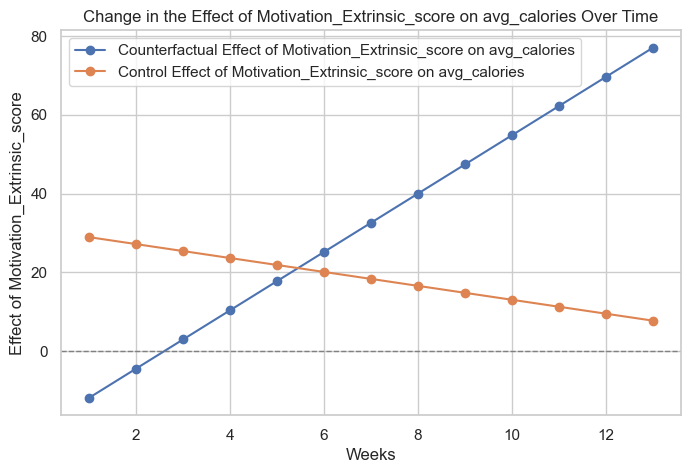

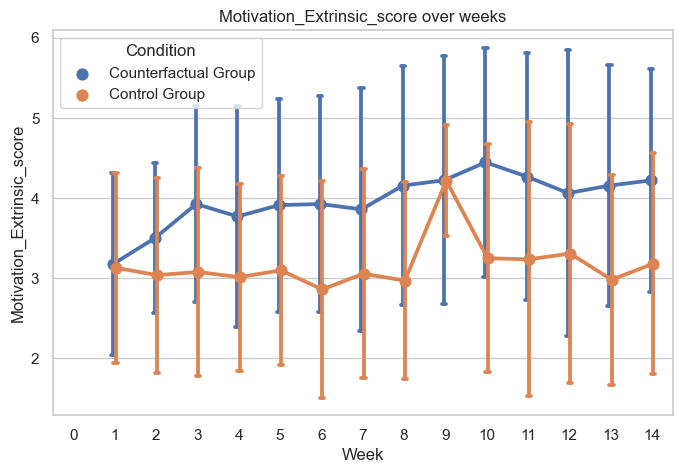


 avg_calories Intention_to_Engage_in_Physical_Activity_score

T-test Mean Difference over all Weeks:
T-statistic: 12.3322
P-value: 0.0000


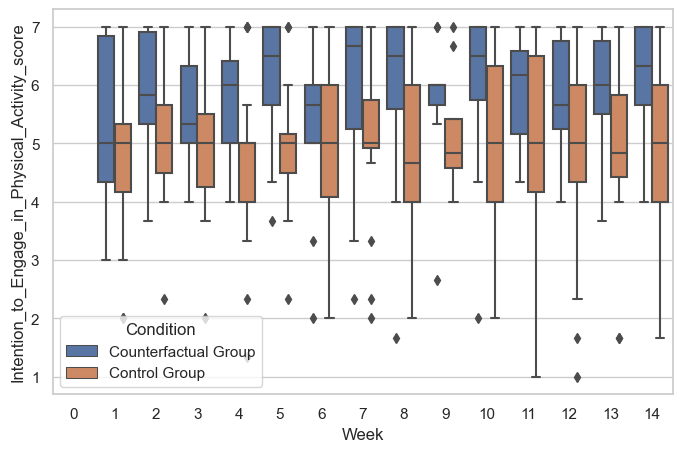

Significant Results found in Counterfactual Group for Intention_to_Engage_in_Physical_Activity_score:

                                Mixed Linear Model Regression Results
Model:                            MixedLM               Dependent Variable:               avg_calories
No. Observations:                 202                   Method:                           REML        
No. Groups:                       18                    Scale:                            44561.9783  
Min. group size:                  2                     Log-Likelihood:                   -1388.8933  
Max. group size:                  13                    Converged:                        Yes         
Mean group size:                  11.2                                                                
------------------------------------------------------------------------------------------------------
                                                      Coef.    Std.Err.   z    P>|z|  [0.025   0.975] 
---

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

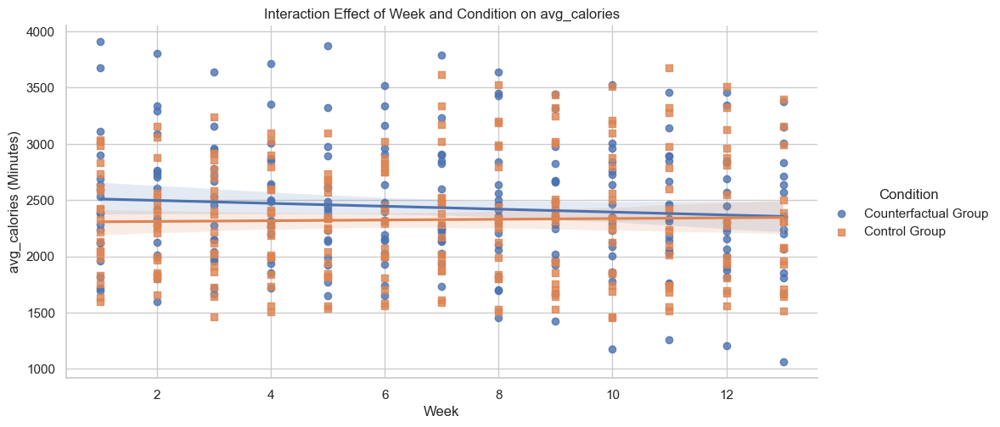

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

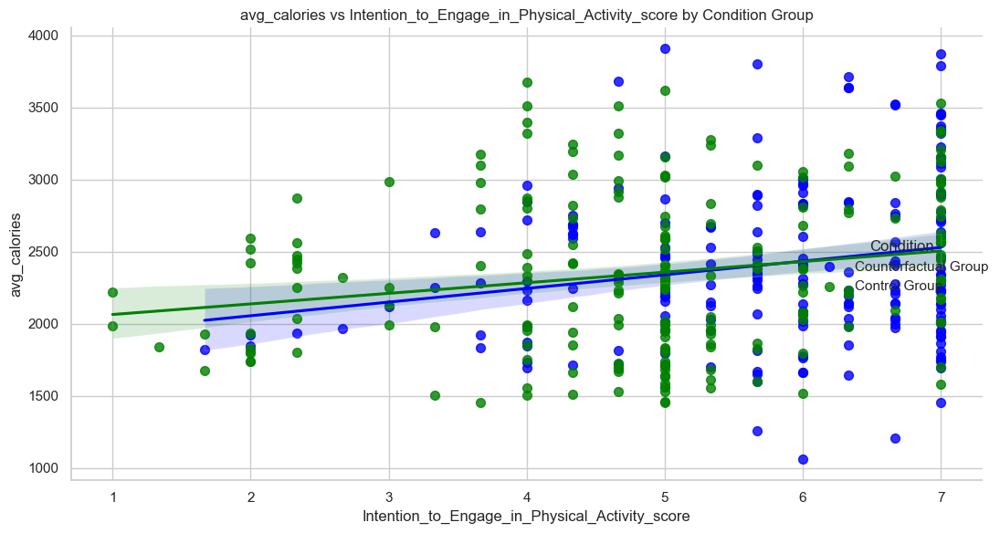

Condition 1: Pearson r = 0.20, p-value = 0.004
Condition 2: Pearson r = 0.19, p-value = 0.006
Condition 1: 70.12, 0.017
Condition 2: -20.57, 0.501


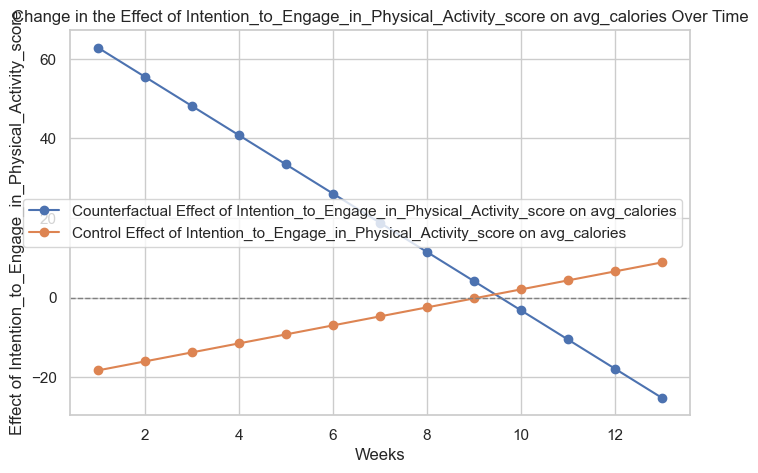

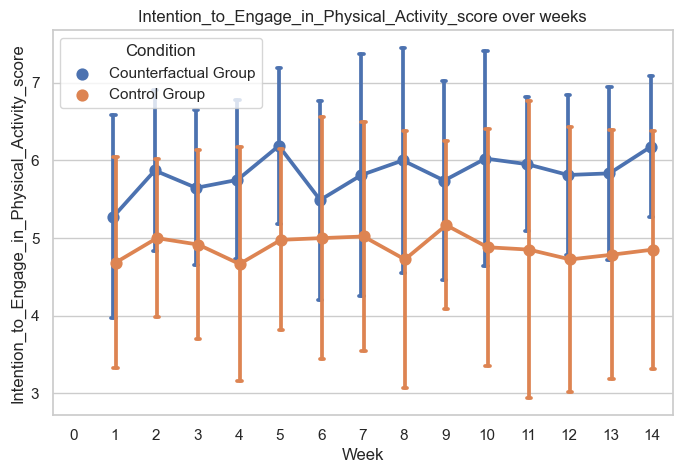


 avg_act_calories Recode_of_contemplation_ladder

 avg_act_calories Self_Efficacy_Coping_score

 avg_act_calories Self_Efficacy_Task_score

T-test Mean Difference over all Weeks:
T-statistic: 2.8887
P-value: 0.0079


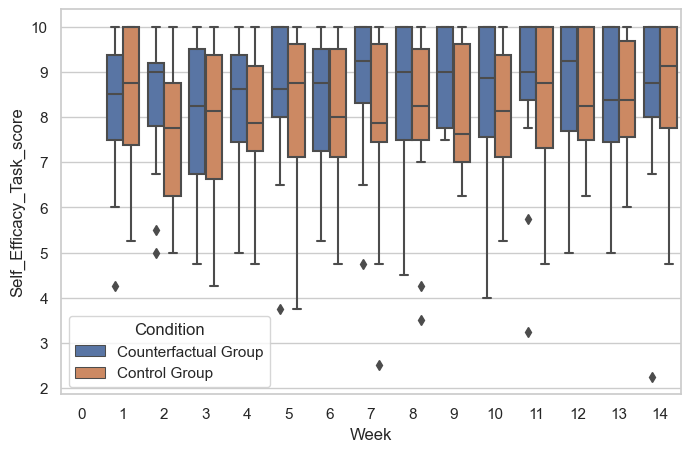

Significant Results found in Counterfactual Group for Self_Efficacy_Task_score:

                     Mixed Linear Model Regression Results
Model:                   MixedLM      Dependent Variable:      avg_act_calories
No. Observations:        202          Method:                  REML            
No. Groups:              18           Scale:                   36682.4058      
Min. group size:         2            Log-Likelihood:          -1365.6199      
Max. group size:         13           Converged:               Yes             
Mean group size:         11.2                                                  
-------------------------------------------------------------------------------
                                Coef.    Std.Err.   z    P>|z|  [0.025   0.975]
-------------------------------------------------------------------------------
Intercept                        265.486  232.802  1.140 0.254 -190.797 721.769
Self_Efficacy_Task_score          97.878   26.052  3.757 0.0

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

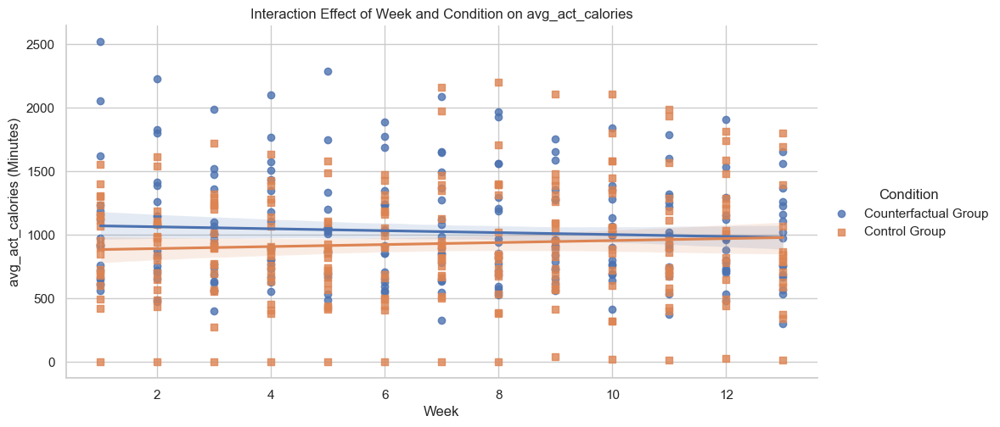

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

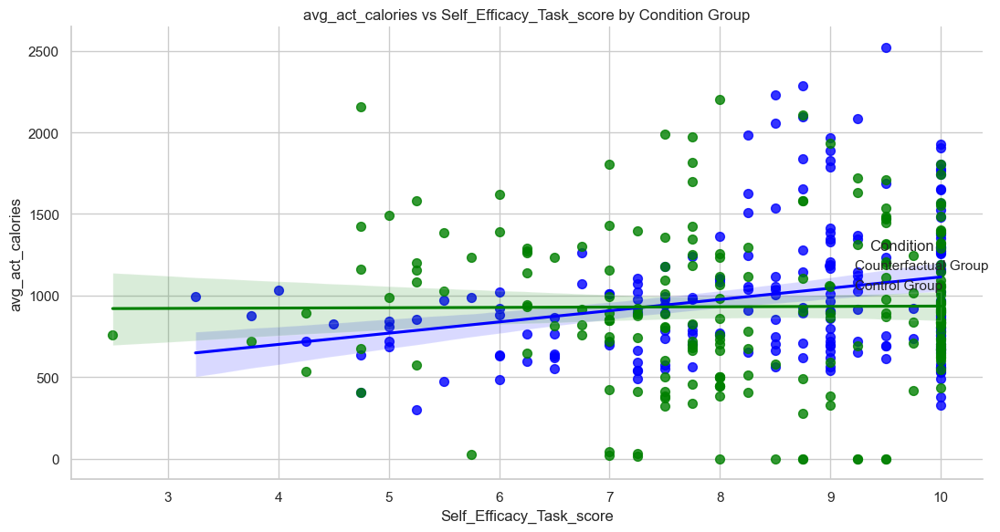

Condition 1: Pearson r = 0.26, p-value = 0.000
Condition 2: Pearson r = 0.01, p-value = 0.920
Condition 1: 97.88, 0.000
Condition 2: -49.42, 0.144


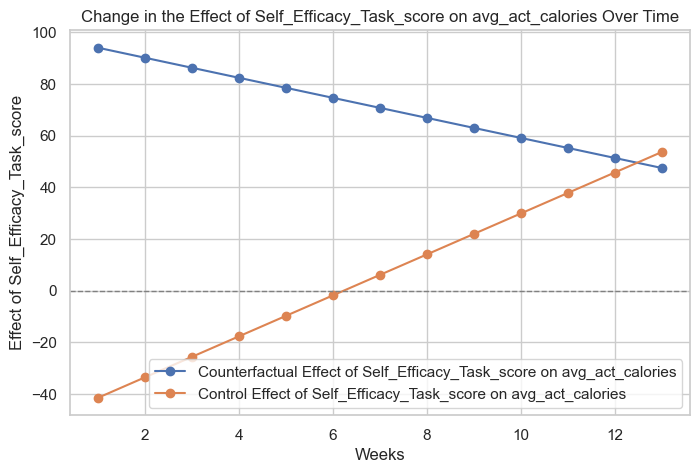

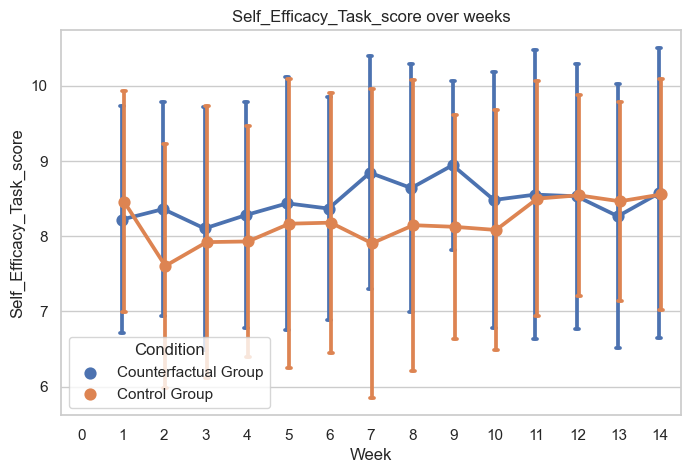


 avg_act_calories Self_Efficacy_Scheduling_score

 avg_act_calories Motivation_Intrinsic_score

T-test Mean Difference over all Weeks:
T-statistic: 2.5835
P-value: 0.0184


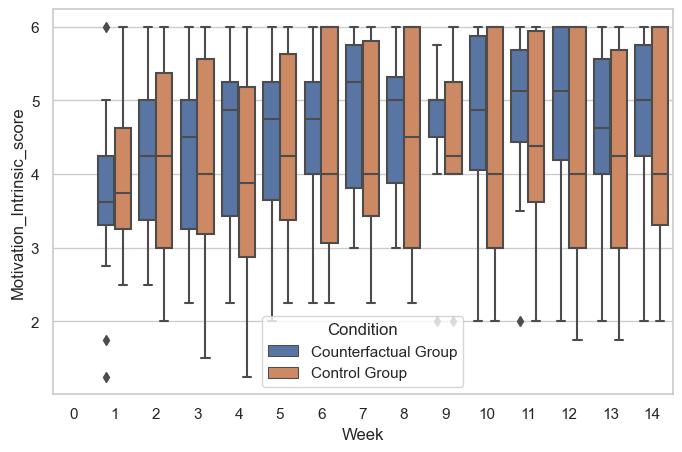

Significant Results found in Counterfactual Group for Motivation_Intrinsic_score:

                      Mixed Linear Model Regression Results
Model:                   MixedLM       Dependent Variable:       avg_act_calories
No. Observations:        202           Method:                   REML            
No. Groups:              18            Scale:                    37625.9060      
Min. group size:         2             Log-Likelihood:           -1367.7525      
Max. group size:         13            Converged:                Yes             
Mean group size:         11.2                                                    
---------------------------------------------------------------------------------
                                  Coef.    Std.Err.   z    P>|z|  [0.025  0.975] 
---------------------------------------------------------------------------------
Intercept                          742.123  159.080  4.665 0.000 430.332 1053.913
Motivation_Intrinsic_score          7

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

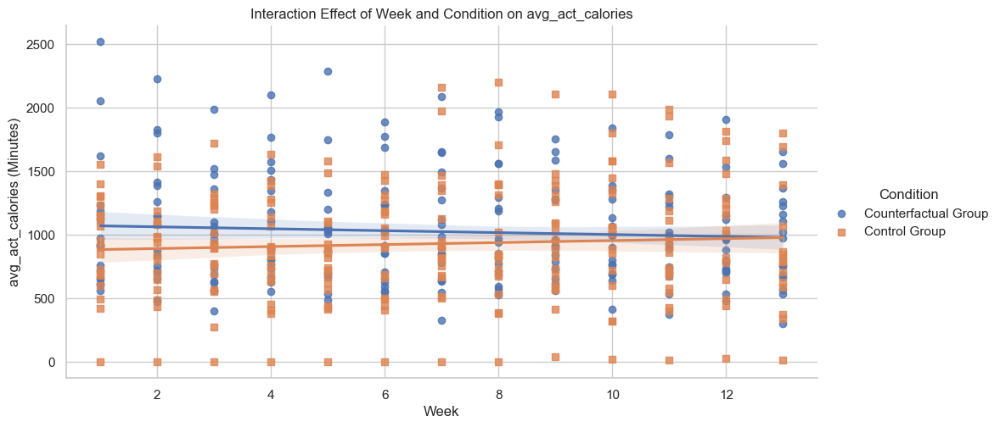

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

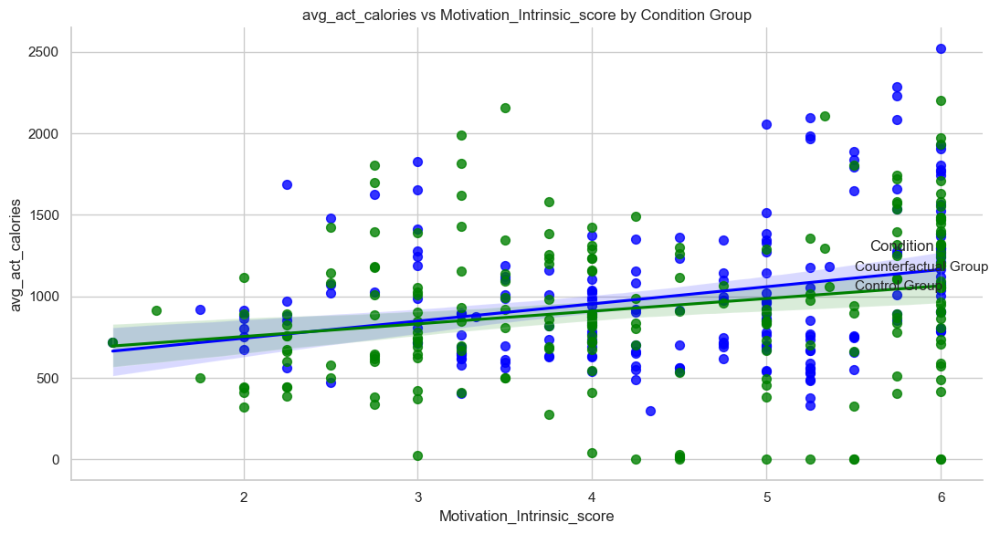

Condition 1: Pearson r = 0.29, p-value = 0.000
Condition 2: Pearson r = 0.22, p-value = 0.001
Condition 1: 78.70, 0.013
Condition 2: -34.34, 0.425


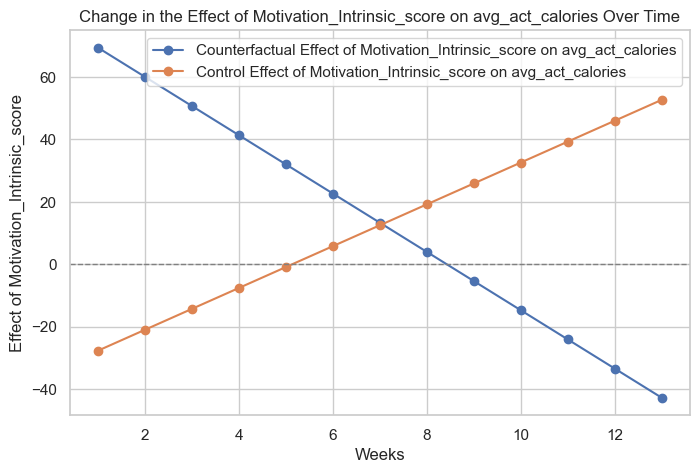

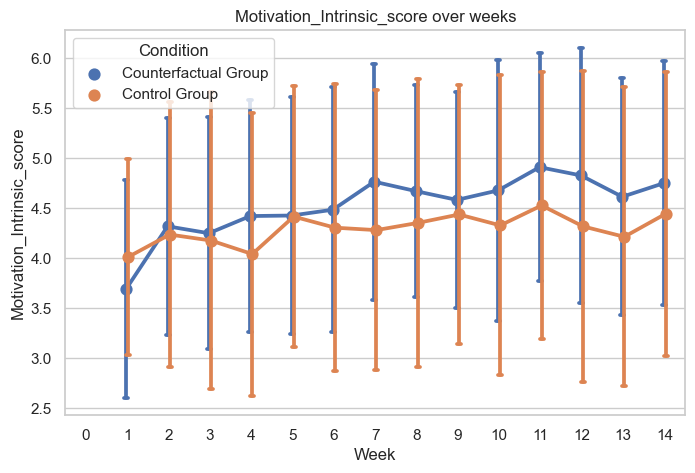


 avg_act_calories Motivation_Extrinsic_score

 avg_act_calories Intention_to_Engage_in_Physical_Activity_score

T-test Mean Difference over all Weeks:
T-statistic: 12.3322
P-value: 0.0000


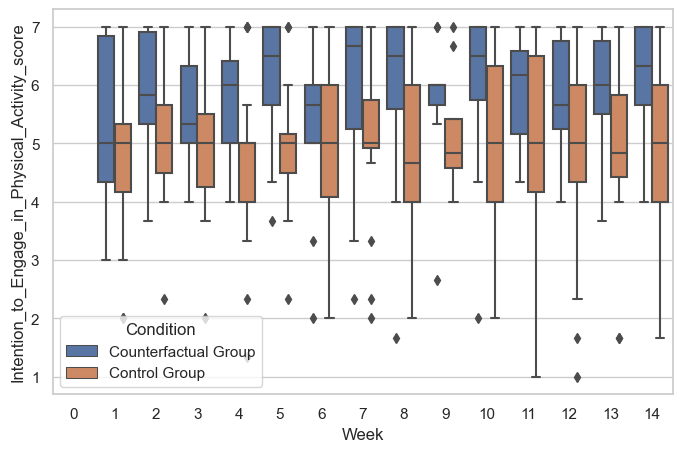

Significant Results found in Counterfactual Group for Intention_to_Engage_in_Physical_Activity_score:

                               Mixed Linear Model Regression Results
Model:                          MixedLM             Dependent Variable:             avg_act_calories
No. Observations:               202                 Method:                         REML            
No. Groups:                     18                  Scale:                          37312.1111      
Min. group size:                2                   Log-Likelihood:                 -1367.1324      
Max. group size:                13                  Converged:                      Yes             
Mean group size:                11.2                                                                
----------------------------------------------------------------------------------------------------
                                                      Coef.    Std.Err.   z    P>|z|  [0.025  0.975]
--------------------

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 800x500 with 0 Axes>

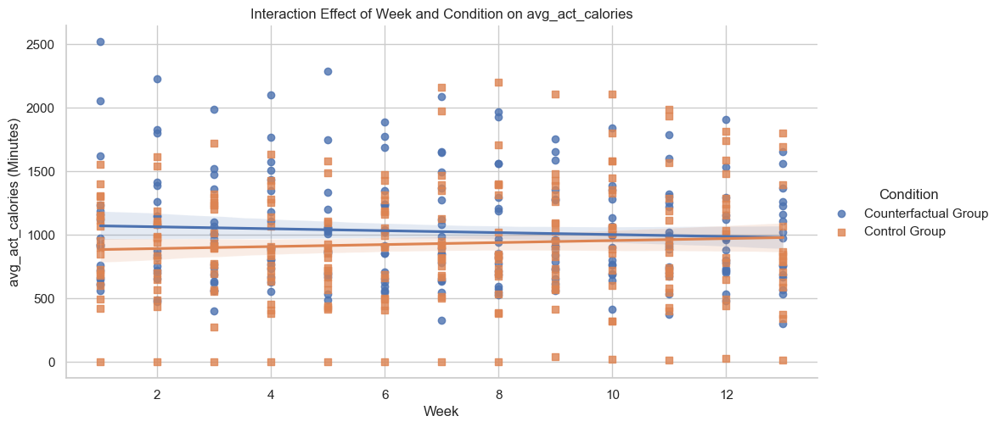

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2604589845.py:141: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 800x500 with 0 Axes>

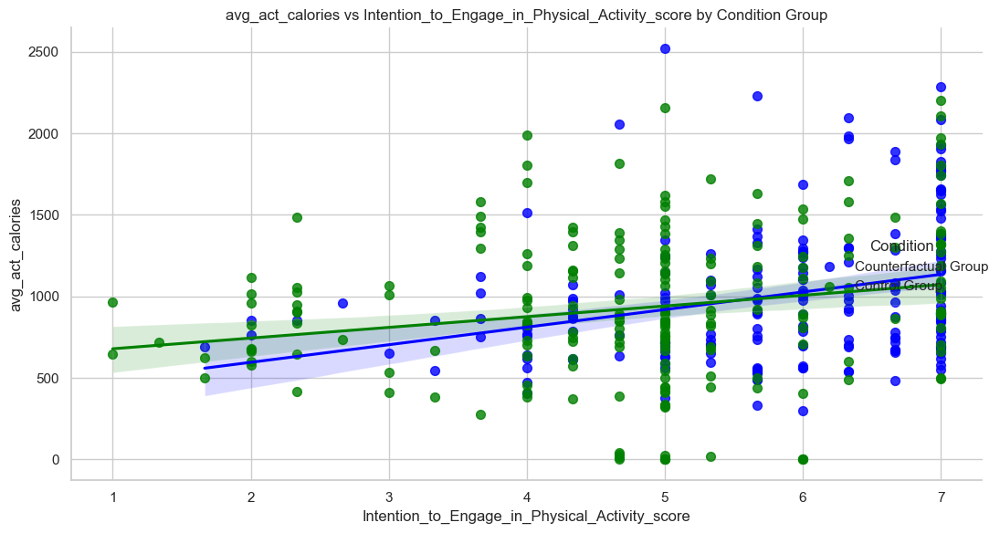

Condition 1: Pearson r = 0.30, p-value = 0.000
Condition 2: Pearson r = 0.20, p-value = 0.004
Condition 1: 90.76, 0.001
Condition 2: -17.66, 0.669


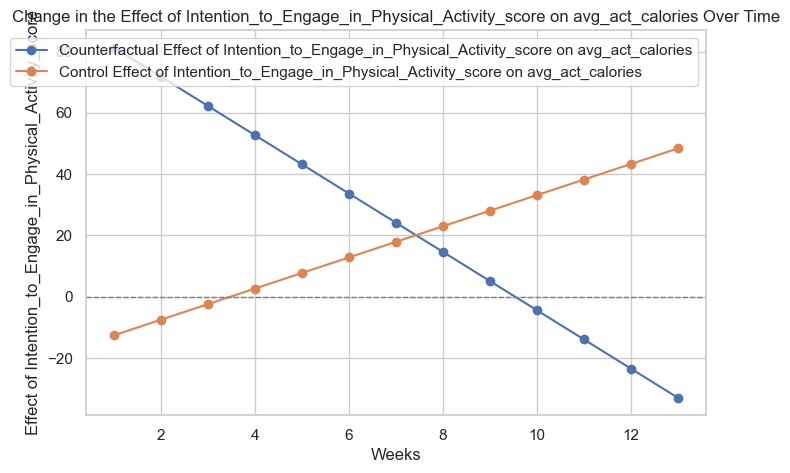

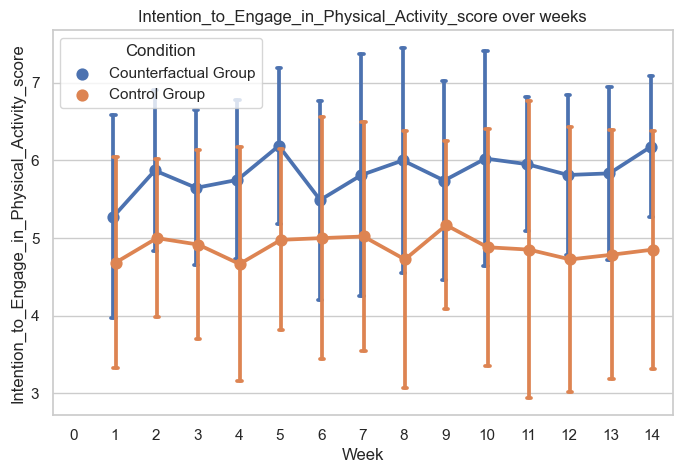

In [261]:
# Function to check significant interaction in the mixed-effects model
def check_significant_interaction(model, col):
    # Check if the p-value for the interaction term (Week:Condition) is significant
    for param, pvalue in model.pvalues.items():
        if col in param and pvalue <= 0.1:
            return True
    return False

def run_spearman_correlation(df, col1, col2):
    corr, p_value = spearmanr(df[col1], df[col2])
    return corr, p_value

def run_linear_regression(df, X_cols, y_col):
    X = df[X_cols]
    y = df[y_col]
    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()
    return model

######### Hypothesis 1: Longitudinal Analysis of Physical Activity Metrics over the interview weeks
main_CF_columns = ['Overall_CF1', 'Overall_CF2', 'Overall_CF_engagement', 'Overall_CF_potency_score', 'Overall_CF_Intention']
main_activity_columns = ['avg_lightly_active_minutes','avg_fairly_active_minutes','avg_very_active_minutes',
'avg_total_active_minutes','avg_active_minutes','avg_calories','avg_act_calories']
main_Survey_columns = ['Recode_of_contemplation_ladder', 'Self_Efficacy_Coping_score',
'Self_Efficacy_Task_score', 'Self_Efficacy_Scheduling_score','Motivation_Intrinsic_score', 'Motivation_Extrinsic_score',
'Intention_to_Engage_in_Physical_Activity_score']

df_physical_activity = df[['Participant_ID', 'Week', 'Condition']+main_Survey_columns+ main_activity_columns]

for activity_col in main_activity_columns:
    for survey_col in main_Survey_columns:
        df_survey = df_physical_activity[['Participant_ID', 'Week', 'Condition',survey_col, activity_col]]
    
        df_survey_baseline = df_survey[df_survey['Week'] == 1][['Participant_ID', survey_col]].rename(columns={survey_col: 'baseline_' + survey_col})
        df_activity_baseline = df_survey[df_survey['Week'] == 1][['Participant_ID', activity_col]].rename(columns={activity_col: 'baseline_' + activity_col})
        # Merge baseline with the main dataframe
        df_survey = df_survey.merge(df_survey_baseline, on='Participant_ID')
        df_survey = df_survey.merge(df_activity_baseline, on='Participant_ID')
        df_survey[f'change_{survey_col}'] = df_survey[survey_col] - df_survey[f'baseline_{survey_col}']
        df_survey[f'change_{activity_col}'] = df_survey[activity_col] - df_survey[f'baseline_{activity_col}']

        change_col = f'change_{survey_col}'
        print( '\n', activity_col, survey_col)

        experimental_group = df_survey[df_survey['Condition'] == 1]
        control_group = df_survey[df_survey['Condition'] == 2]

        # Group by 'Week' and calculate the mean activity for each group
        mean_experimental = experimental_group.groupby('Week')[survey_col].mean()
        mean_control = control_group.groupby('Week')[survey_col].mean()
        # Perform an independent t-test to compare the means of the two groups
        # Drop any NaN values if necessary (in case there are weeks with missing data)
        t_stat, p_value = ttest_ind(mean_experimental.dropna(), mean_control.dropna(), equal_var=False)

        # Calculate mean and standard deviation for each week 
        experimental_stats = experimental_group.groupby('Week')[survey_col].agg(['mean', 'std'])
        control_stats = control_group.groupby('Week')[survey_col].agg(['mean', 'std'])
#         # Print the mean and std for the experimental group in the format: mean (std)
#         print("\nExperimental Group Mean (Std) Survey by Week:")
#         for week, row in experimental_stats.iterrows():
#             print(f"Week {week}: {row['mean']:.2f} ({row['std']:.2f})")

#         # Print the mean and std for the control group in the format: mean (std)
#         print("\nControl Group Mean (Std) Survey by Week:")
#         for week, row in control_stats.iterrows():
#             print(f"Week {week}: {row['mean']:.2f} ({row['std']:.2f})")

        baseline_experimental = experimental_group[survey_col][experimental_group['Week'] == 1]
        baseline_control = control_group[survey_col][control_group['Week'] == 1]
        # Perform t-test for each week
        t_stats_groups = []
        p_values_groups = []
        t_stats_prepost_experimental, p_values_prepost_experimental = [], []
        t_stats_prepost_control, p_values_prepost_control = [], []
        for week in range(1, 14):  # Weeks 1 to 13
            exp_week_data = experimental_group[experimental_group['Week'] == week][survey_col]
            ctrl_week_data = control_group[control_group['Week'] == week][survey_col]
            if week != 1 :
                t_stat_prepost, p_value_prepost = ttest_rel(baseline_experimental, exp_week_data, nan_policy='omit')
                t_stats_prepost_experimental.append(t_stat_prepost)
                p_values_prepost_experimental.append(p_value_prepost)

            if week != 1 :
                t_stat_prepost, p_value_prepost = ttest_rel(baseline_control, ctrl_week_data, nan_policy='omit')
                t_stats_prepost_control.append(t_stat_prepost)
                p_values_prepost_control.append(p_value_prepost)

            if len(exp_week_data) > 0 and len(ctrl_week_data) > 0:
                t_stat_groups, p_value_groups = ttest_ind(exp_week_data, ctrl_week_data, equal_var=False, nan_policy='omit')
                t_stats_groups.append(t_stat_groups)
                p_values_groups.append(p_value_groups)

        df_survey_cf = df_survey[df_survey['Condition'] == 1].dropna(subset=[survey_col,activity_col]).reset_index(drop=True) #[['Participant_ID', 'Week', 'Condition', activity_col]]
        df_survey_control = df_survey[df_survey['Condition'] == 2].dropna(subset=[survey_col,activity_col]).reset_index(drop=True) #[['Participant_ID', 'Week', 'Condition', activity_col]]
        pearsonr_cond1, p_value_cond1 = pearsonr(df_survey_cf[survey_col], df_survey_cf[activity_col])
        pearsonr_cond2, p_value_cond2 = pearsonr(df_survey_control[survey_col], df_survey_control[activity_col])

        fixed_effects=[ survey_col,'Week']
        random_effect_col='Participant_ID'

        formula = f"{activity_col} ~ {' * '.join(fixed_effects)}"
        #formula = f"{activity_col} ~  survey_col + Week + Week:{survey_col} "  #+ Week:Condition:{'baseline_' + activity_col}
        model_cf = smf.mixedlm(formula, df_survey_cf, groups=df_survey_cf[random_effect_col]).fit()
        model_control = smf.mixedlm(formula, df_survey_control, groups=df_survey_control[random_effect_col]).fit()

        if check_significant_interaction(model_cf, survey_col) and p_value<=0.2: 
            print(f"\nT-test Mean Difference over all Weeks:")
            print(f"T-statistic: {t_stat:.4f}")
            print(f"P-value: {p_value:.4f}")
            
            plt.figure(figsize=(8,5))
            df_survey['Condition'] = df_survey['Condition'].map({1: 'Counterfactual Group', 2: 'Control Group'})
            sns.boxplot(x='Week', y=survey_col, 
                        hue='Condition', data=df_survey)
            plt.show()
            print(f"Significant Results found in Counterfactual Group for {survey_col}:\n")
            print(model_cf.summary())
            print(f"Comparable Results found in Control Group for {survey_col}:\n")
            print(model_control.summary())

            # Plot the trends over time for each group
            sns.set(style="whitegrid")
            bins = [-float('inf'), df_survey_cf[survey_col].median(), float('inf')]
            labels = ["Below Average", "Above Average"]
            # Create the binned column
            df_survey_cf['intention_binned'] = pd.cut(df_survey_cf[survey_col], bins=bins, labels=labels)
            # Interaction plot
            plt.figure(figsize=(8, 5)) # hue='intention_binned',  
            sns.lmplot(x='Week', y=activity_col, hue='Condition', data=df_survey, aspect=2, markers=["o", "s"])
            plt.title(f'Interaction Effect of Week and Condition on {activity_col}')
            plt.xlabel('Week')
            plt.ylabel(f'{activity_col} (Minutes)')
            plt.show()
            
            plt.figure(figsize=(8, 5))
            sns.lmplot(data=df_survey, x=survey_col, y=activity_col, hue='Condition', 
                       palette=['blue', 'green'], scatter_kws={'s':50}, height=6, aspect=1.5)
            plt.title(f"{activity_col} vs {survey_col} by Condition Group")
            plt.xlabel(f"{survey_col}")
            plt.ylabel(f"{activity_col}")
            plt.tight_layout()
            plt.show()
            print( f'Condition 1: Pearson r = {pearsonr_cond1:.2f}, p-value = {p_value_cond1:.3f}')
            print( f'Condition 2: Pearson r = {pearsonr_cond2:.2f}, p-value = {p_value_cond2:.3f}')
            
            survey_coef_cond1 = model_cf.params[survey_col]  # Coefficient for survey score (Condition 1)
            survey_coef_cond2 = model_control.params[survey_col] #+ model.params['Condition[T.2.0]']  # Coefficient for Condition 2
            p_value_cond1 = model_cf.pvalues[survey_col]  # P-value for Condition 1
            p_value_cond2 = model_control.pvalues[survey_col] #+ model.pvalues['Condition[T.2.0]']  # P-value for Condition 2
            print(f'Condition 1: {survey_coef_cond1:.2f}, {p_value_cond1:.3f}')
            print(f'Condition 2: {survey_coef_cond2:.2f}, {p_value_cond2:.3f}')
            
            interaction_coef_cond1 = model_cf.params[f'{survey_col}:Week']  # Interaction between Motivation and Week
            interaction_coef_cond2 = model_control.params[f'{survey_col}:Week']  # Interaction between Motivation and Week
            weeks = np.arange(1, 14)
            # Effect of motivation over time (Week)
            cf_effect_motivation = survey_coef_cond1 + interaction_coef_cond1 * weeks
            control_effect_motivation = survey_coef_cond2 + interaction_coef_cond2 * weeks

            plt.figure(figsize=(8, 5))
#             plt.plot(weeks, effect_motivation, label=f'Totall Effect of {survey_col} on {activity_col}', marker='o')
            plt.plot(weeks, cf_effect_motivation, label=f'Counterfactual Effect of {survey_col} on {activity_col}', marker='o')
            plt.plot(weeks, control_effect_motivation, label=f'Control Effect of {survey_col} on {activity_col}', marker='o')
            plt.title(f"Change in the Effect of {survey_col} on {activity_col} Over Time")
            plt.xlabel("Weeks")
            plt.ylabel(f"Effect of {survey_col}")
            plt.axhline(0, color='grey', linestyle='--', linewidth=1)
            plt.grid(True)
            plt.legend()
            plt.show()
            
            plt.figure(figsize=(8, 5))
            sns.pointplot(data=df_survey, x='Week', y=survey_col, hue='Condition', dodge=True, capsize=.1, errorbar='sd')
            _ = plt.title(f'{survey_col} over weeks')
            plt.show()



 avg_lightly_active_minutes Recode_of_contemplation_ladder

 avg_lightly_active_minutes Self_Efficacy_Coping_score

 avg_lightly_active_minutes Self_Efficacy_Task_score

T-test Mean Difference over all Weeks:
T-statistic: 2.8887
P-value: 0.0079


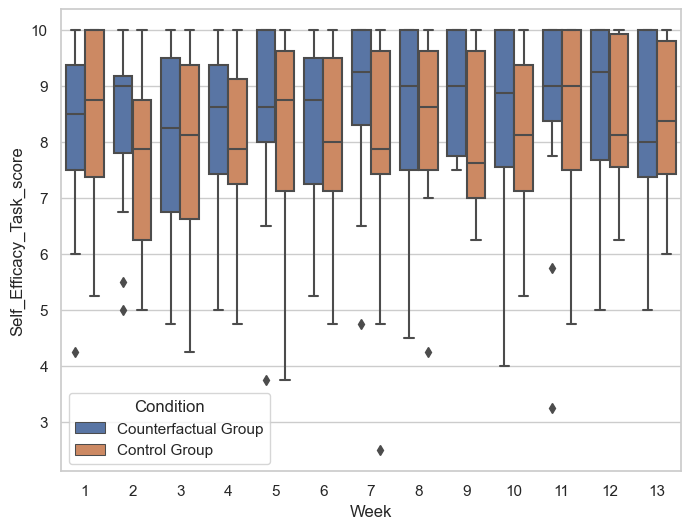

Significant Results found in Counterfactual Group for Self_Efficacy_Task_score:

                   Mixed Linear Model Regression Results
Model:              MixedLM  Dependent Variable:  avg_lightly_active_minutes
No. Observations:   407      Method:              REML                      
No. Groups:         37       Scale:               2391.4912                 
Min. group size:    2        Log-Likelihood:      -2198.2323                
Max. group size:    13       Converged:           Yes                       
Mean group size:    11.0                                                    
----------------------------------------------------------------------------
                               Coef.   Std.Err.   z    P>|z|  [0.025  0.975]
----------------------------------------------------------------------------
Intercept                      239.534   37.701  6.354 0.000 165.641 313.426
Condition[T.2.0]               -14.018   21.653 -0.647 0.517 -56.457  28.421
Self_Efficacy_T

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x500 with 0 Axes>

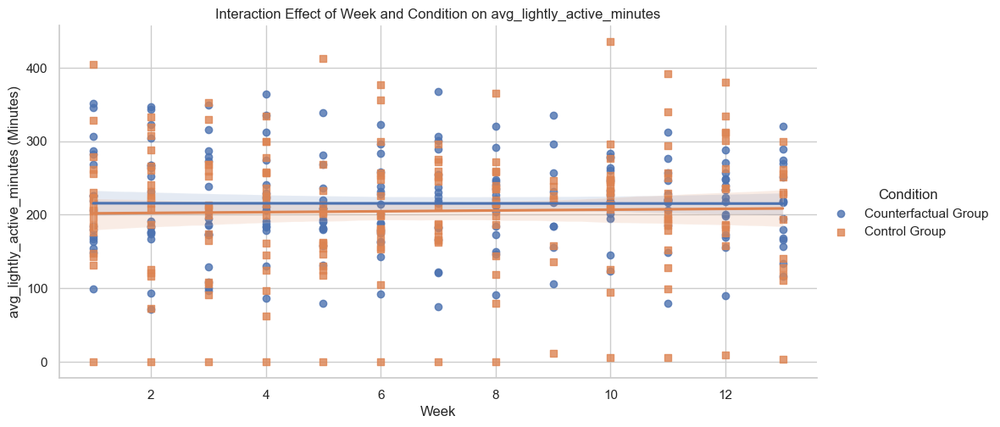

Condition 1: -2.72, 0.514
Condition 2: -16.73, 1.031


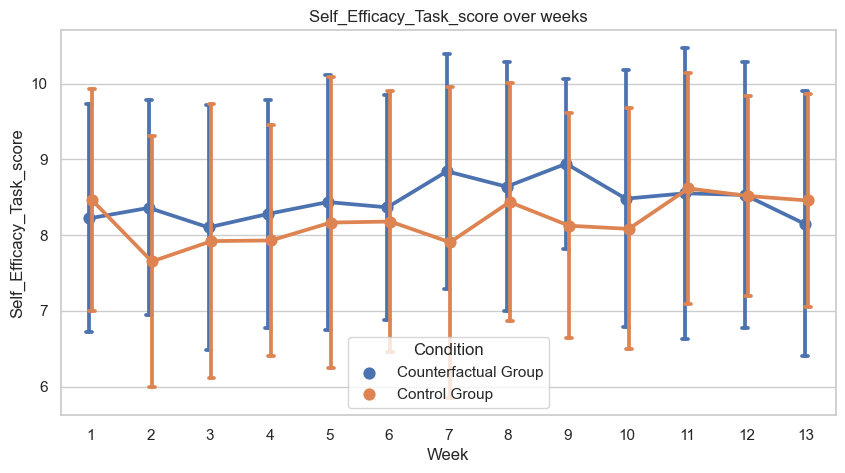


 avg_lightly_active_minutes Self_Efficacy_Scheduling_score

 avg_lightly_active_minutes Motivation_Intrinsic_score

 avg_lightly_active_minutes Motivation_Extrinsic_score

 avg_lightly_active_minutes Intention_to_Engage_in_Physical_Activity_score

 avg_fairly_active_minutes Recode_of_contemplation_ladder

 avg_fairly_active_minutes Self_Efficacy_Coping_score

T-test Mean Difference over all Weeks:
T-statistic: 6.1616
P-value: 0.0000


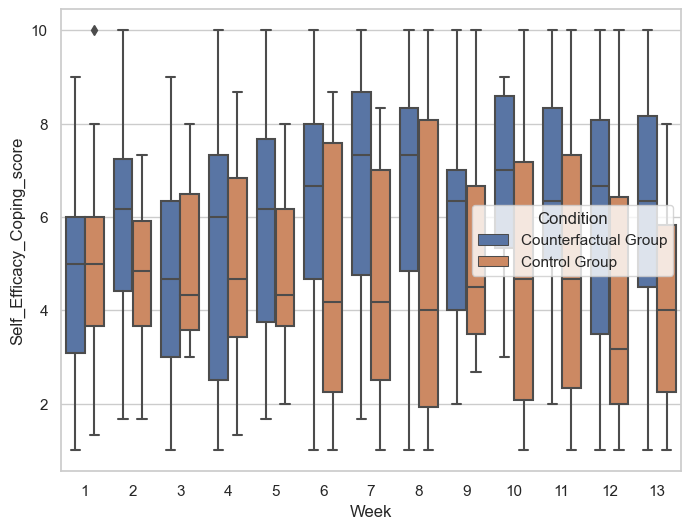

Significant Results found in Counterfactual Group for Self_Efficacy_Coping_score:

                   Mixed Linear Model Regression Results
Model:              MixedLM  Dependent Variable:  avg_fairly_active_minutes
No. Observations:   407      Method:              REML                     
No. Groups:         37       Scale:               80.3571                  
Min. group size:    2        Log-Likelihood:      -1510.4735               
Max. group size:    13       Converged:           Yes                      
Mean group size:    11.0                                                   
---------------------------------------------------------------------------
                                Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
---------------------------------------------------------------------------
Intercept                        9.935    3.554  2.795 0.005   2.969 16.901
Condition[T.2.0]                -4.016    3.274 -1.227 0.220 -10.433  2.400
Self_Efficacy_Coping_sco

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x500 with 0 Axes>

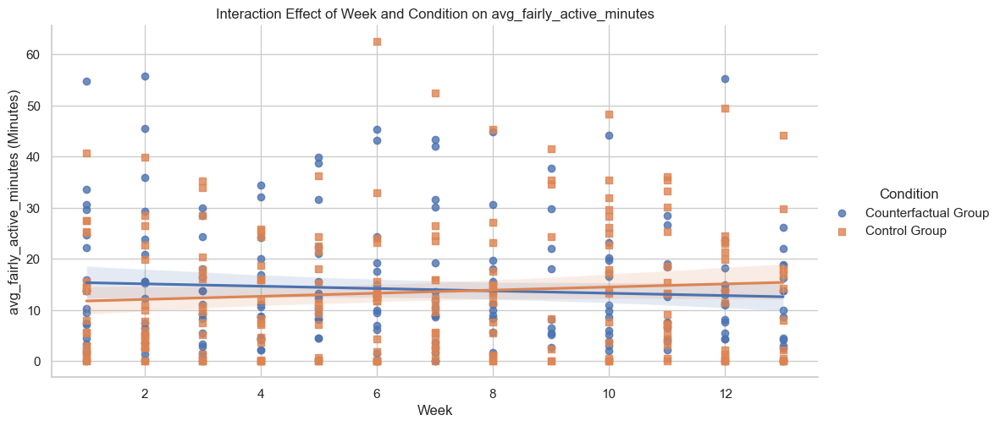

Condition 1: 1.17, 0.021
Condition 2: -2.85, 0.241


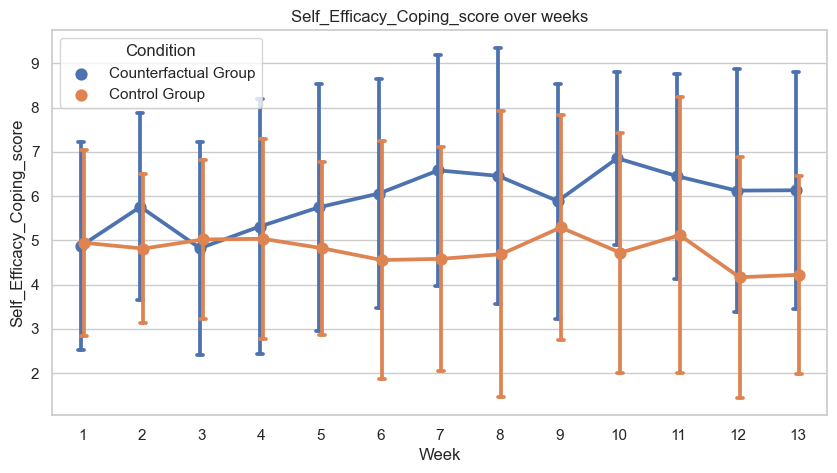


 avg_fairly_active_minutes Self_Efficacy_Task_score

 avg_fairly_active_minutes Self_Efficacy_Scheduling_score

 avg_fairly_active_minutes Motivation_Intrinsic_score

 avg_fairly_active_minutes Motivation_Extrinsic_score

 avg_fairly_active_minutes Intention_to_Engage_in_Physical_Activity_score

 avg_very_active_minutes Recode_of_contemplation_ladder

T-test Mean Difference over all Weeks:
T-statistic: 7.4249
P-value: 0.0000


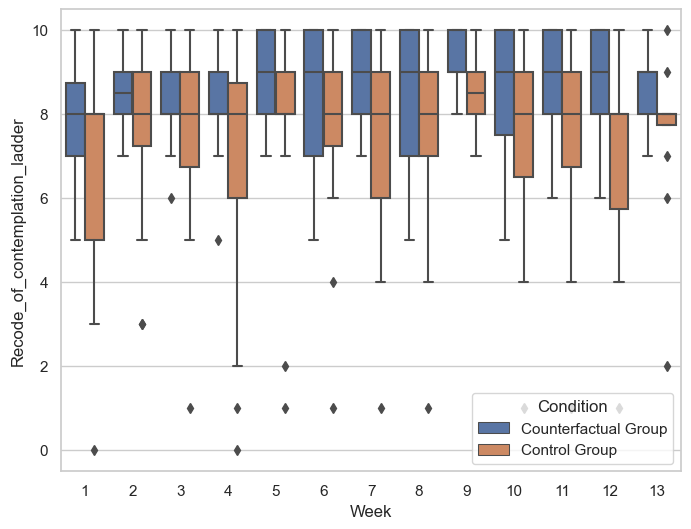

Significant Results found in Counterfactual Group for Recode_of_contemplation_ladder:

                     Mixed Linear Model Regression Results
Model:                 MixedLM    Dependent Variable:    avg_very_active_minutes
No. Observations:      405        Method:                REML                   
No. Groups:            37         Scale:                 94.9139                
Min. group size:       2          Log-Likelihood:        -1552.0561             
Max. group size:       13         Converged:             Yes                    
Mean group size:       10.9                                                     
--------------------------------------------------------------------------------
                                     Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
--------------------------------------------------------------------------------
Intercept                             6.993    6.419  1.089 0.276  -5.589 19.575
Condition[T.2.0]                     -2.384 

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x500 with 0 Axes>

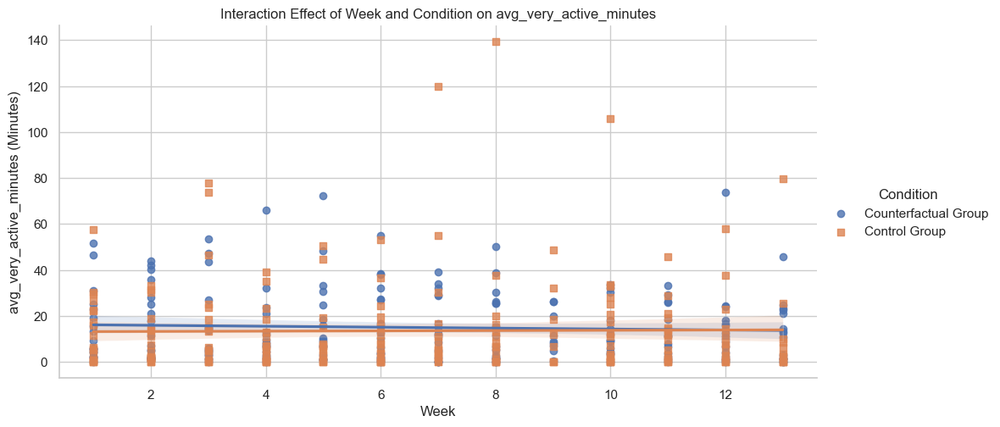

Condition 1: 1.18, 0.061
Condition 2: -1.21, 0.713


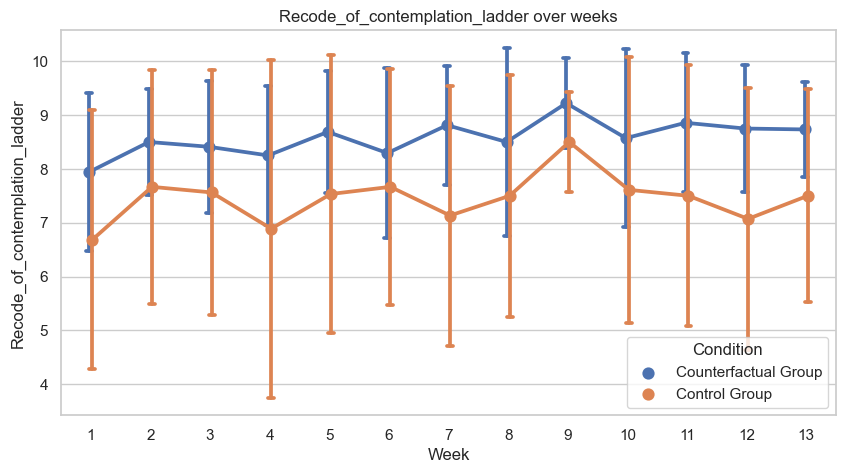


 avg_very_active_minutes Self_Efficacy_Coping_score

T-test Mean Difference over all Weeks:
T-statistic: 6.1616
P-value: 0.0000


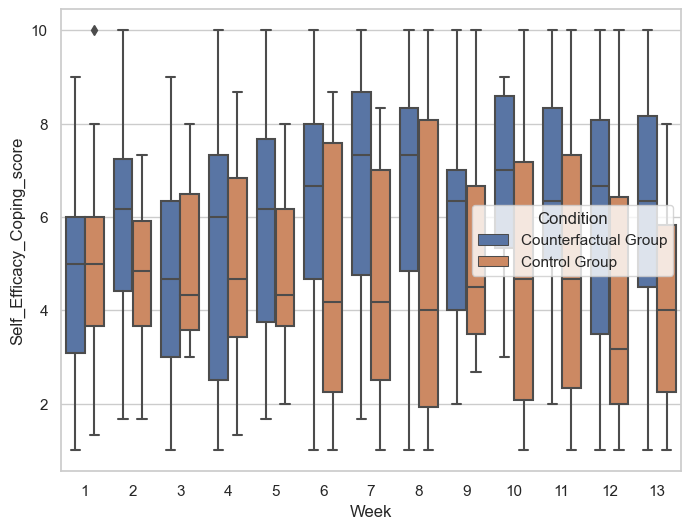

Significant Results found in Counterfactual Group for Self_Efficacy_Coping_score:

                   Mixed Linear Model Regression Results
Model:               MixedLM   Dependent Variable:   avg_very_active_minutes
No. Observations:    407       Method:               REML                   
No. Groups:          37        Scale:                95.0297                
Min. group size:     2         Log-Likelihood:       -1558.3579             
Max. group size:     13        Converged:            Yes                    
Mean group size:     11.0                                                   
----------------------------------------------------------------------------
                                 Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
----------------------------------------------------------------------------
Intercept                        10.242    4.694  2.182 0.029   1.042 19.441
Condition[T.2.0]                 -3.258    5.004 -0.651 0.515 -13.066  6.549
Self_Efficacy

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x500 with 0 Axes>

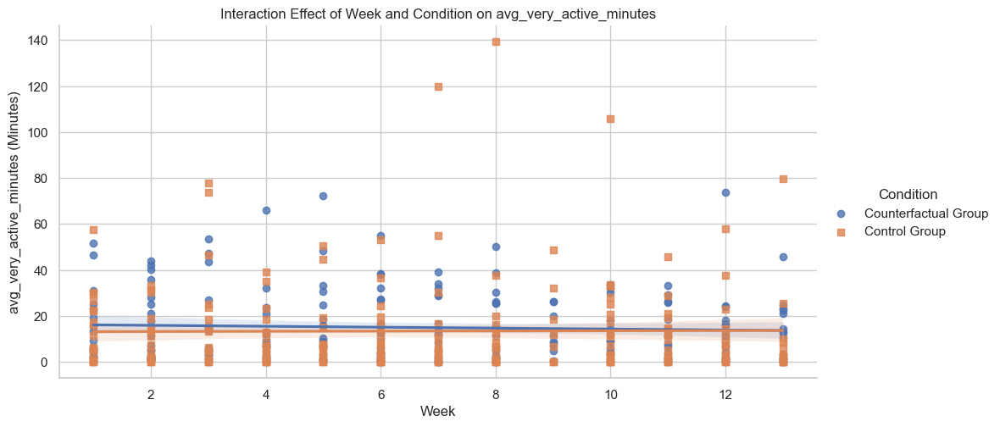

Condition 1: 1.24, 0.031
Condition 2: -2.02, 0.545


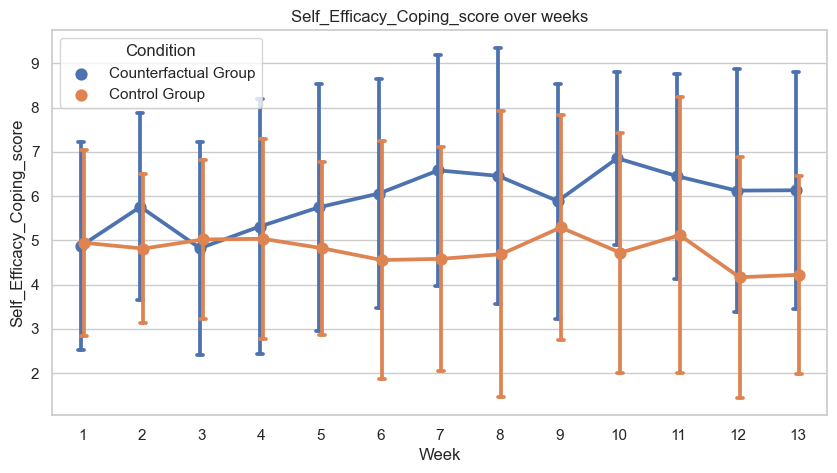


 avg_very_active_minutes Self_Efficacy_Task_score

T-test Mean Difference over all Weeks:
T-statistic: 2.8887
P-value: 0.0079


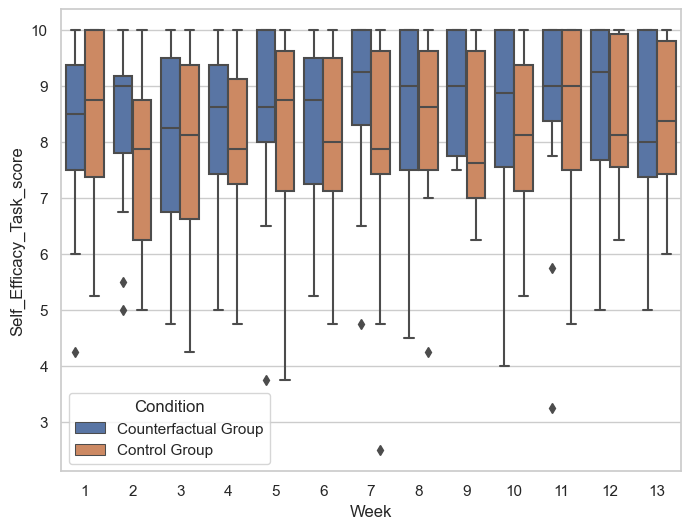

Significant Results found in Counterfactual Group for Self_Efficacy_Task_score:

                  Mixed Linear Model Regression Results
Model:               MixedLM  Dependent Variable:  avg_very_active_minutes
No. Observations:    407      Method:              REML                   
No. Groups:          37       Scale:               94.6845                
Min. group size:     2        Log-Likelihood:      -1558.8697             
Max. group size:     13       Converged:           Yes                    
Mean group size:     11.0                                                 
--------------------------------------------------------------------------
                               Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
--------------------------------------------------------------------------
Intercept                       3.583    7.924  0.452 0.651 -11.947 19.113
Condition[T.2.0]               -3.266    5.273 -0.619 0.536 -13.602  7.070
Self_Efficacy_Task_score        1.585 

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x500 with 0 Axes>

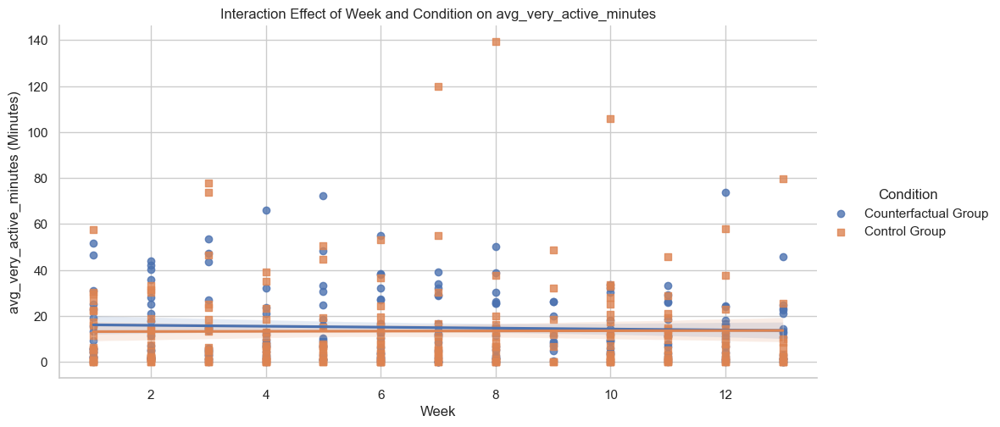

Condition 1: 1.58, 0.060
Condition 2: -1.68, 0.596


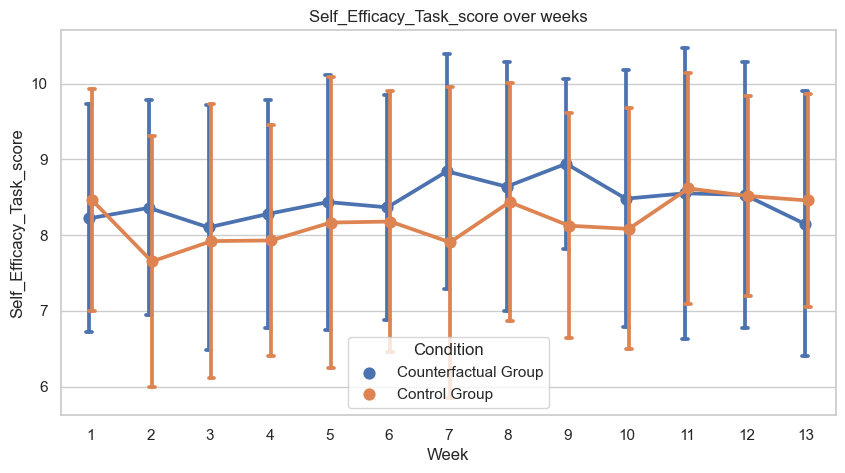


 avg_very_active_minutes Self_Efficacy_Scheduling_score

 avg_very_active_minutes Motivation_Intrinsic_score

T-test Mean Difference over all Weeks:
T-statistic: 2.5835
P-value: 0.0184


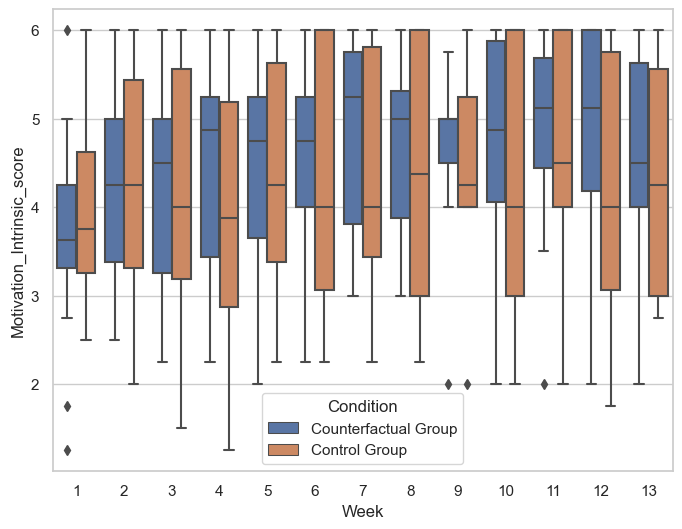

Significant Results found in Counterfactual Group for Motivation_Intrinsic_score:

                   Mixed Linear Model Regression Results
Model:               MixedLM   Dependent Variable:   avg_very_active_minutes
No. Observations:    406       Method:               REML                   
No. Groups:          37        Scale:                93.8674                
Min. group size:     2         Log-Likelihood:       -1551.7500             
Max. group size:     13        Converged:            Yes                    
Mean group size:     11.0                                                   
----------------------------------------------------------------------------
                                 Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
----------------------------------------------------------------------------
Intercept                         9.150    5.634  1.624 0.104  -1.892 20.192
Condition[T.2.0]                 -3.668    5.087 -0.721 0.471 -13.638  6.302
Motivation_In

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x500 with 0 Axes>

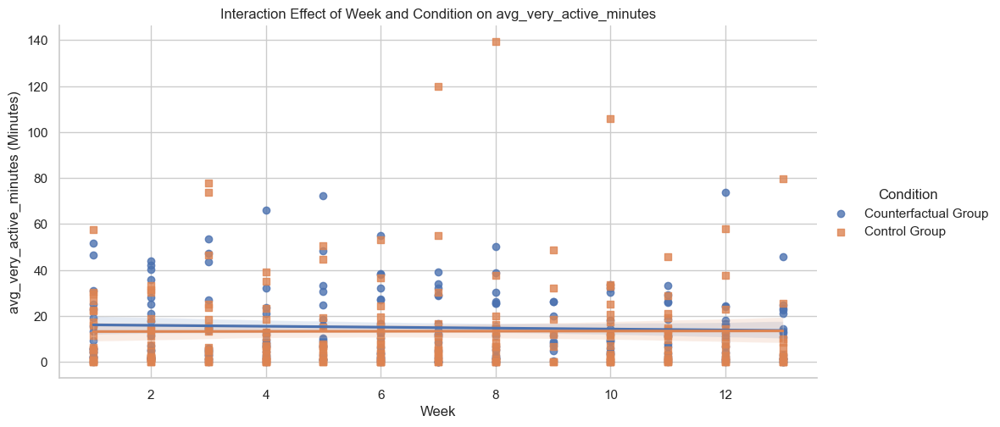

Condition 1: 1.86, 0.073
Condition 2: -1.81, 0.544


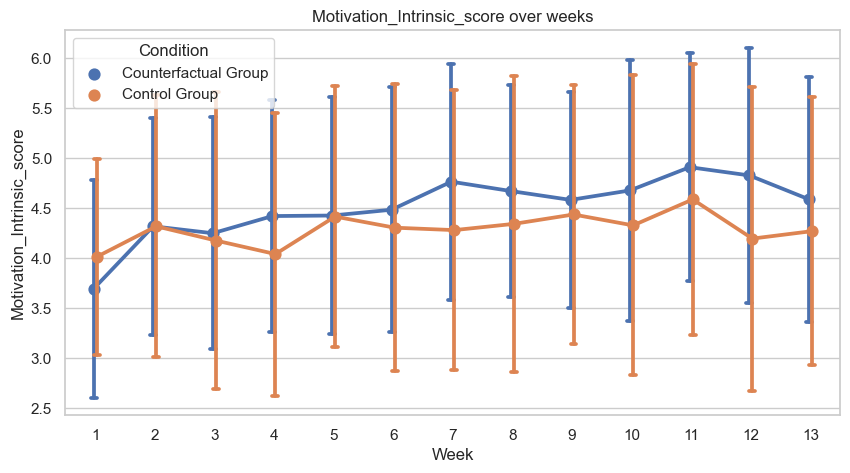


 avg_very_active_minutes Motivation_Extrinsic_score

 avg_very_active_minutes Intention_to_Engage_in_Physical_Activity_score

 avg_total_active_minutes Recode_of_contemplation_ladder

 avg_total_active_minutes Self_Efficacy_Coping_score

 avg_total_active_minutes Self_Efficacy_Task_score

 avg_total_active_minutes Self_Efficacy_Scheduling_score

 avg_total_active_minutes Motivation_Intrinsic_score

 avg_total_active_minutes Motivation_Extrinsic_score

 avg_total_active_minutes Intention_to_Engage_in_Physical_Activity_score

 avg_active_minutes Recode_of_contemplation_ladder

T-test Mean Difference over all Weeks:
T-statistic: 7.4249
P-value: 0.0000


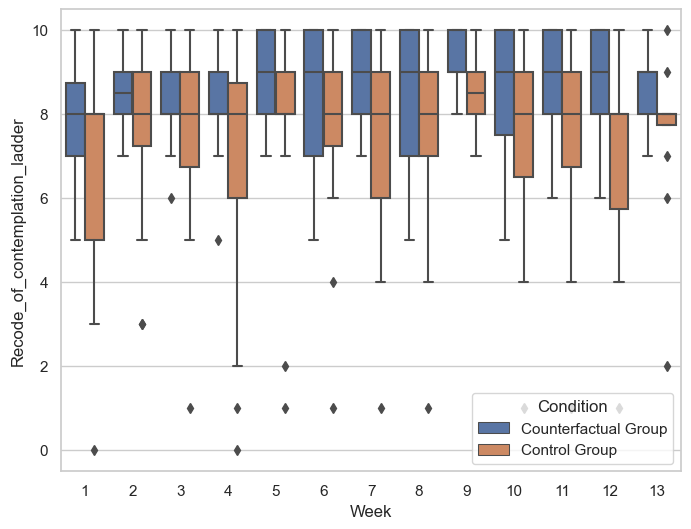

Significant Results found in Counterfactual Group for Recode_of_contemplation_ladder:

                     Mixed Linear Model Regression Results
Model:                  MixedLM      Dependent Variable:      avg_active_minutes
No. Observations:       405          Method:                  REML              
No. Groups:             37           Scale:                   262.4527          
Min. group size:        2            Log-Likelihood:          -1750.2620        
Max. group size:        13           Converged:               Yes               
Mean group size:        10.9                                                    
--------------------------------------------------------------------------------
                                     Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
--------------------------------------------------------------------------------
Intercept                            17.157   10.238  1.676 0.094  -2.910 37.224
Condition[T.2.0]                     -6.121 

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x500 with 0 Axes>

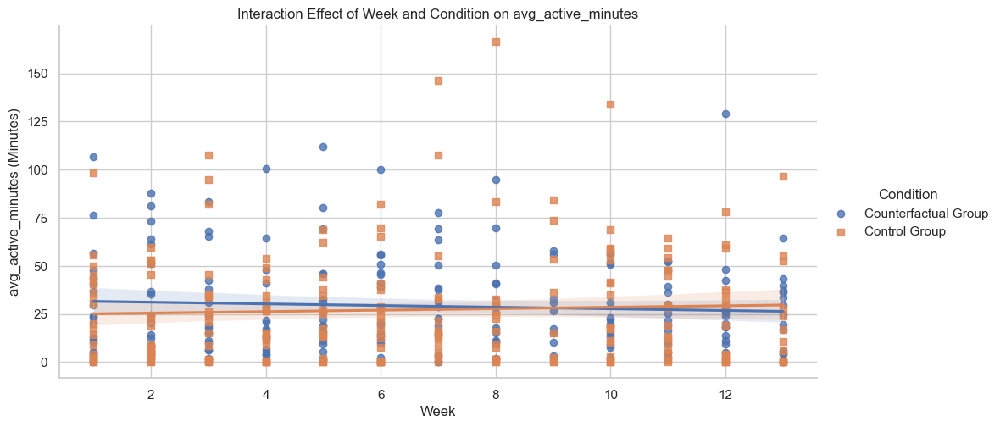

Condition 1: 1.90, 0.067
Condition 2: -4.22, 0.501


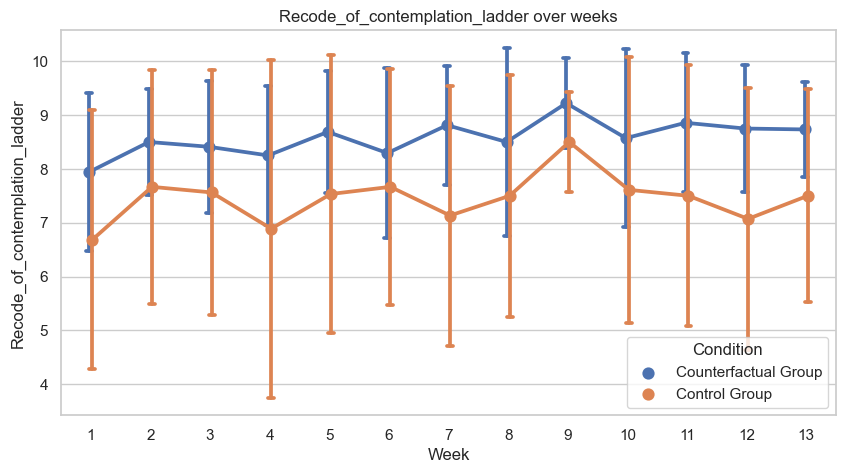


 avg_active_minutes Self_Efficacy_Coping_score

T-test Mean Difference over all Weeks:
T-statistic: 6.1616
P-value: 0.0000


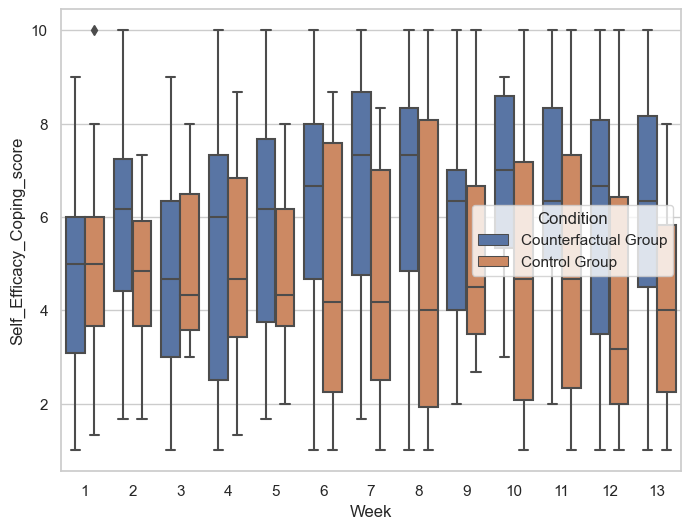

Significant Results found in Counterfactual Group for Self_Efficacy_Coping_score:

                   Mixed Linear Model Regression Results
Model:                MixedLM     Dependent Variable:     avg_active_minutes
No. Observations:     407         Method:                 REML              
No. Groups:           37          Scale:                  262.0388          
Min. group size:      2           Log-Likelihood:         -1756.9785        
Max. group size:      13          Converged:              Yes               
Mean group size:      11.0                                                  
----------------------------------------------------------------------------
                                 Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
----------------------------------------------------------------------------
Intercept                        20.076    7.264  2.764 0.006   5.840 34.313
Condition[T.2.0]                 -7.306    7.383 -0.990 0.322 -21.776  7.164
Self_Efficacy

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x500 with 0 Axes>

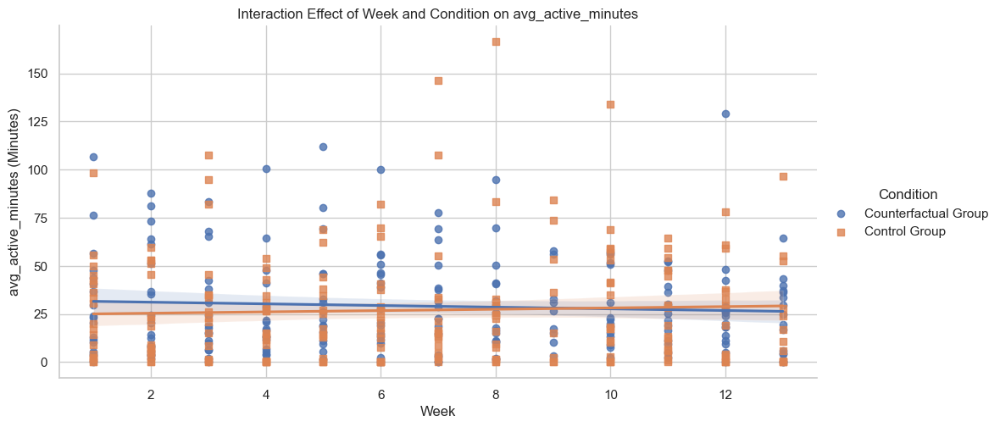

Condition 1: 2.44, 0.010
Condition 2: -4.87, 0.332


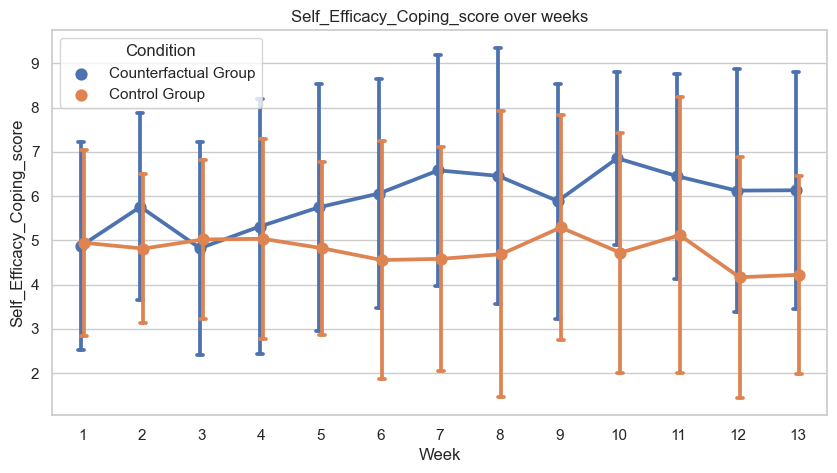


 avg_active_minutes Self_Efficacy_Task_score

 avg_active_minutes Self_Efficacy_Scheduling_score

 avg_active_minutes Motivation_Intrinsic_score

T-test Mean Difference over all Weeks:
T-statistic: 2.5835
P-value: 0.0184


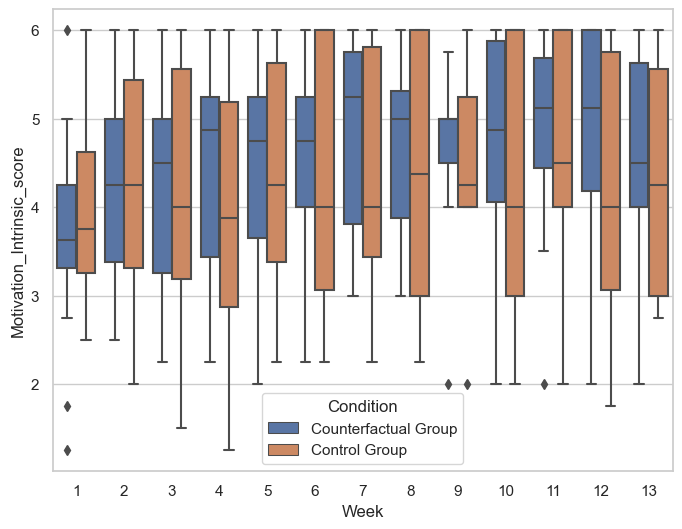

Significant Results found in Counterfactual Group for Motivation_Intrinsic_score:

                   Mixed Linear Model Regression Results
Model:                MixedLM     Dependent Variable:     avg_active_minutes
No. Observations:     406         Method:                 REML              
No. Groups:           37          Scale:                  261.0546          
Min. group size:      2           Log-Likelihood:         -1751.1518        
Max. group size:      13          Converged:              Yes               
Mean group size:      11.0                                                  
----------------------------------------------------------------------------
                                 Coef.  Std.Err.   z    P>|z|  [0.025 0.975]
----------------------------------------------------------------------------
Intercept                        19.844    8.888  2.233 0.026   2.424 37.264
Condition[T.2.0]                 -8.263    7.450 -1.109 0.267 -22.865  6.339
Motivation_In

/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/mahsanabbasi/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x500 with 0 Axes>

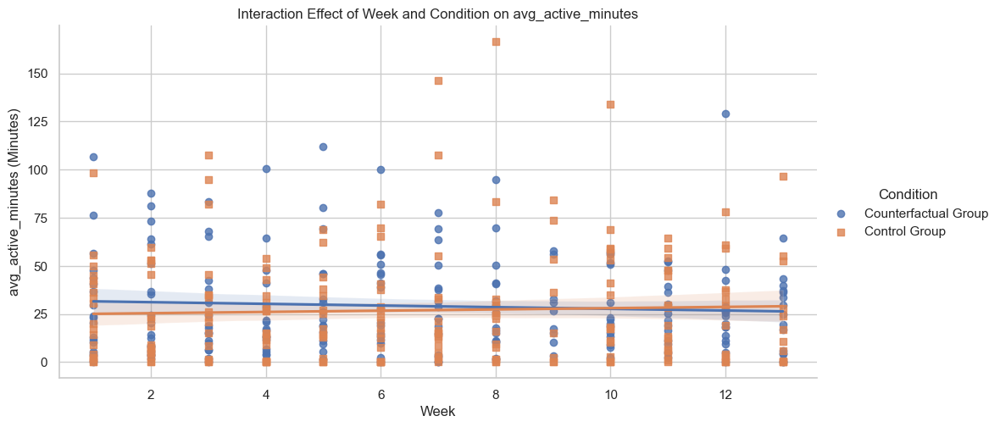

Condition 1: 3.21, 0.061
Condition 2: -5.05, 0.329


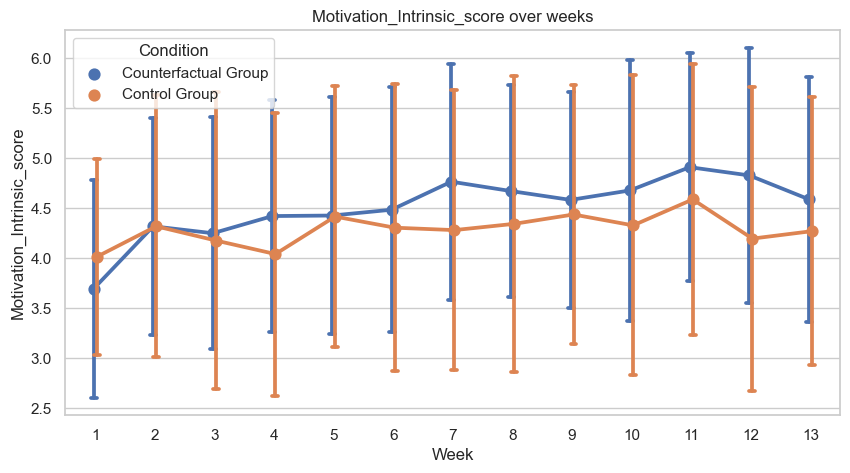


 avg_active_minutes Motivation_Extrinsic_score

 avg_active_minutes Intention_to_Engage_in_Physical_Activity_score

 avg_calories Recode_of_contemplation_ladder

 avg_calories Self_Efficacy_Coping_score

 avg_calories Self_Efficacy_Task_score

 avg_calories Self_Efficacy_Scheduling_score

 avg_calories Motivation_Intrinsic_score

 avg_calories Motivation_Extrinsic_score

 avg_calories Intention_to_Engage_in_Physical_Activity_score

 avg_act_calories Recode_of_contemplation_ladder

 avg_act_calories Self_Efficacy_Coping_score

 avg_act_calories Self_Efficacy_Task_score

 avg_act_calories Self_Efficacy_Scheduling_score

 avg_act_calories Motivation_Intrinsic_score

 avg_act_calories Motivation_Extrinsic_score

 avg_act_calories Intention_to_Engage_in_Physical_Activity_score


In [260]:
# Function to check significant interaction in the mixed-effects model
def check_significant_interaction(model, col):
    # Check if the p-value for the interaction term (Week:Condition) is significant
    for param, pvalue in model.pvalues.items():
        if col in param and pvalue <= 0.1:
            return True
    return False

def run_spearman_correlation(df, col1, col2):
    corr, p_value = spearmanr(df[col1], df[col2])
    return corr, p_value

def run_linear_regression(df, X_cols, y_col):
    X = df[X_cols]
    y = df[y_col]
    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()
    return model

######### Hypothesis 1: Longitudinal Analysis of Physical Activity Metrics over the interview weeks
main_CF_columns = ['Overall_CF1', 'Overall_CF2', 'Overall_CF_engagement', 'Overall_CF_potency_score', 'Overall_CF_Intention']
main_activity_columns = ['avg_lightly_active_minutes','avg_fairly_active_minutes','avg_very_active_minutes',
'avg_total_active_minutes','avg_active_minutes','avg_calories','avg_act_calories']
main_Survey_columns = ['Recode_of_contemplation_ladder', 'Self_Efficacy_Coping_score',
'Self_Efficacy_Task_score', 'Self_Efficacy_Scheduling_score','Motivation_Intrinsic_score', 'Motivation_Extrinsic_score',
'Intention_to_Engage_in_Physical_Activity_score']

df_physical_activity = df[['Participant_ID', 'Week', 'Condition']+main_Survey_columns+ main_activity_columns]

for activity_col in main_activity_columns:
    for survey_col in main_Survey_columns:
        df_survey = df_physical_activity[['Participant_ID', 'Week', 'Condition',survey_col, activity_col]]
    
        df_survey_baseline = df_survey[df_survey['Week'] == 1][['Participant_ID', survey_col]].rename(columns={survey_col: 'baseline_' + survey_col})
        df_activity_baseline = df_survey[df_survey['Week'] == 1][['Participant_ID', activity_col]].rename(columns={activity_col: 'baseline_' + activity_col})
        # Merge baseline with the main dataframe
        df_survey = df_survey.merge(df_survey_baseline, on='Participant_ID')
        df_survey = df_survey.merge(df_activity_baseline, on='Participant_ID')
        df_survey[f'change_{survey_col}'] = df_survey[survey_col] - df_survey[f'baseline_{survey_col}']
        df_survey[f'change_{activity_col}'] = df_survey[activity_col] - df_survey[f'baseline_{activity_col}']

        change_col = f'change_{survey_col}'
        print( '\n', activity_col, survey_col)

        experimental_group = df_survey[df_survey['Condition'] == 1]
        control_group = df_survey[df_survey['Condition'] == 2]

        # Group by 'Week' and calculate the mean activity for each group
        mean_experimental = experimental_group.groupby('Week')[survey_col].mean()
        mean_control = control_group.groupby('Week')[survey_col].mean()
        # Perform an independent t-test to compare the means of the two groups
        # Drop any NaN values if necessary (in case there are weeks with missing data)
        t_stat, p_value = ttest_ind(mean_experimental.dropna(), mean_control.dropna(), equal_var=False)

        # Calculate mean and standard deviation for each week 
        experimental_stats = experimental_group.groupby('Week')[survey_col].agg(['mean', 'std'])
        control_stats = control_group.groupby('Week')[survey_col].agg(['mean', 'std'])
#         # Print the mean and std for the experimental group in the format: mean (std)
#         print("\nExperimental Group Mean (Std) Survey by Week:")
#         for week, row in experimental_stats.iterrows():
#             print(f"Week {week}: {row['mean']:.2f} ({row['std']:.2f})")

#         # Print the mean and std for the control group in the format: mean (std)
#         print("\nControl Group Mean (Std) Survey by Week:")
#         for week, row in control_stats.iterrows():
#             print(f"Week {week}: {row['mean']:.2f} ({row['std']:.2f})")

        baseline_experimental = experimental_group[survey_col][experimental_group['Week'] == 1]
        baseline_control = control_group[survey_col][control_group['Week'] == 1]
        # Perform t-test for each week
        t_stats_groups = []
        p_values_groups = []
        t_stats_prepost_experimental, p_values_prepost_experimental = [], []
        t_stats_prepost_control, p_values_prepost_control = [], []
        for week in range(1, 14):  # Weeks 1 to 13
            exp_week_data = experimental_group[experimental_group['Week'] == week][survey_col]
            ctrl_week_data = control_group[control_group['Week'] == week][survey_col]
            if week != 1 :
                t_stat_prepost, p_value_prepost = ttest_rel(baseline_experimental, exp_week_data, nan_policy='omit')
                t_stats_prepost_experimental.append(t_stat_prepost)
                p_values_prepost_experimental.append(p_value_prepost)

            if week != 1 :
                t_stat_prepost, p_value_prepost = ttest_rel(baseline_control, ctrl_week_data, nan_policy='omit')
                t_stats_prepost_control.append(t_stat_prepost)
                p_values_prepost_control.append(p_value_prepost)

            if len(exp_week_data) > 0 and len(ctrl_week_data) > 0:
                t_stat_groups, p_value_groups = ttest_ind(exp_week_data, ctrl_week_data, equal_var=False, nan_policy='omit')
                t_stats_groups.append(t_stat_groups)
                p_values_groups.append(p_value_groups)

        df_survey = df_survey.dropna(subset=[survey_col,activity_col]).reset_index(drop=True) #[['Participant_ID', 'Week', 'Condition', activity_col]]
        fixed_effects=[ survey_col,'Week']
        random_effect_col='Participant_ID'
        df_survey['Condition'] = df_survey['Condition'].astype('category')
        
        formula = f"{activity_col} ~ {' * '.join(fixed_effects)}"
        formula = f"{activity_col} ~  {survey_col} + Condition + Week + {survey_col}:Week + Week:Condition "  #+ Week:Condition:{'baseline_' + activity_col}
        model = smf.mixedlm(formula, df_survey, groups=df_survey[random_effect_col]).fit()

        if check_significant_interaction(model, survey_col) and p_value<=0.2: 
            print(f"\nT-test Mean Difference over all Weeks:")
            print(f"T-statistic: {t_stat:.4f}")
            print(f"P-value: {p_value:.4f}")
            
            plt.figure(figsize=(8,6))
            df_survey['Condition'] = df_survey['Condition'].map({1: 'Counterfactual Group', 2: 'Control Group'})
            sns.boxplot(x='Week', y=survey_col, 
                        hue='Condition', data=df_survey)
            plt.show()
            print(f"Significant Results found in Counterfactual Group for {survey_col}:\n")
            print(model.summary())

            # Plot the trends over time for each group
            sns.set(style="whitegrid")
            # Interaction plot
            plt.figure(figsize=(10, 5)) # hue='intention_binned',  
            sns.lmplot(x='Week', y=activity_col, hue='Condition', data=df_survey, aspect=2, markers=["o", "s"])
            plt.title(f'Interaction Effect of Week and Condition on {activity_col}')
            plt.xlabel('Week')
            plt.ylabel(f'{activity_col} (Minutes)')
            plt.show()
            
            survey_coef_cond1 = model.params[survey_col]  # Coefficient for survey score (Condition 1)
            survey_coef_cond2 = model.params[survey_col] + model.params['Condition[T.2.0]']  # Coefficient for Condition 2
            p_value_cond1 = model.pvalues[survey_col]  # P-value for Condition 1
            p_value_cond2 = model.pvalues[survey_col] + model.pvalues['Condition[T.2.0]']  # P-value for Condition 2
            print(f'Condition 1: {survey_coef_cond1:.2f}, {p_value_cond1:.3f}')
            print(f'Condition 2: {survey_coef_cond2:.2f}, {p_value_cond2:.3f}')
            
            plt.figure(figsize=(10, 5))
            sns.pointplot(data=df_survey, x='Week', y=survey_col, hue='Condition', dodge=True, capsize=.1, errorbar='sd')
            _ = plt.title(f'{survey_col} over weeks')
            plt.show()

In [17]:
main_CF_columns = ['Overall_CF1','Overall_CF2','Overall_CF3', 'Overall_CF_potency_score','Overall_CF_Intention']
main_Survey_columns = ['Recode_of_contemplation_ladder','Self_Efficacy_Coping_score',#'Self_Efficacy_Task_score', 
'Motivation_Extrinsic_score', #'Motivation_Intrinsic_score', # # # #'Self_Efficacy_Scheduling_score',
'Intention_to_Engage_in_Physical_Activity_score']

activity_col = 'avg_lightly_active_minutes'#'avg_active_minutes'
cf_group_data = df[df['Condition'] == 1].dropna(subset= main_Survey_columns + [activity_col])

results = []
print('avg_lightly_active_minutes')
for cf_col in main_CF_columns:
    print('\n',cf_col)
    data_filtered = cf_group_data.dropna(subset= [cf_col])
    print(pg.mediation_analysis(data=data_filtered, x=cf_col, m=main_Survey_columns, y=activity_col, seed=42, n_boot=1000))
    
    
    
activity_col = 'avg_act_calories'
cf_group_data = df[df['Condition'] == 1].dropna(subset= main_Survey_columns + [activity_col])
results = []
print('\n\navg_act_calories')
for cf_col in main_CF_columns:
    print('\n',cf_col)
    data_filtered = cf_group_data.dropna(subset= [cf_col])
    print(pg.mediation_analysis(data=data_filtered, x=cf_col, m=main_Survey_columns, y=activity_col, seed=42, n_boot=1000))


avg_lightly_active_minutes

 Overall_CF1
                                                 path       coef        se  \
0                  Recode_of_contemplation_ladder ~ X   0.413453  0.081511   
1                      Self_Efficacy_Coping_score ~ X   0.934536  0.161006   
2                      Motivation_Extrinsic_score ~ X   0.431084  0.090245   
3   Intention_to_Engage_in_Physical_Activity_score...   0.472729  0.071117   
4                  Y ~ Recode_of_contemplation_ladder  -4.703980  4.057263   
5                      Y ~ Self_Efficacy_Coping_score   6.050261  1.976715   
6                      Y ~ Motivation_Extrinsic_score  -7.595054  3.461859   
7   Y ~ Intention_to_Engage_in_Physical_Activity_s...  10.188082  4.172531   
8                                               Total   4.656401  4.321853   
9                                              Direct  -0.934841  5.208035   
10            Indirect Recode_of_contemplation_ladder  -1.906779  1.801160   
11                Indir

                                                 path       coef         se  \
0                  Recode_of_contemplation_ladder ~ X   0.413453   0.081511   
1                      Self_Efficacy_Coping_score ~ X   0.934536   0.161006   
2                      Motivation_Extrinsic_score ~ X   0.431084   0.090245   
3   Intention_to_Engage_in_Physical_Activity_score...   0.472729   0.071117   
4                  Y ~ Recode_of_contemplation_ladder -99.904981  23.077944   
5                      Y ~ Self_Efficacy_Coping_score  77.071875  11.243665   
6                      Y ~ Motivation_Extrinsic_score  56.696751  19.691253   
7   Y ~ Intention_to_Engage_in_Physical_Activity_s...  89.741707  23.733595   
8                                               Total  91.132539  27.280664   
9                                              Direct -10.137814  29.616535   
10            Indirect Recode_of_contemplation_ladder -40.892870  14.575468   
11                Indirect Self_Efficacy_Coping_scor

In [263]:

def run_mediation_analysis(df, independent_vars, mediator, dependent_var):
    # Model 1: Regress the mediator (survey score) on the independent variables (CF columns)
    X1 = df[independent_vars]
    M = df[mediator]
    X1 = sm.add_constant(X1)  # Add constant for intercept
    model_M = sm.OLS(M, X1).fit()

    # Model 2: Regress the dependent variable (PA) on both the independent variables (CF) and the mediator
    X2 = np.column_stack((X1, M))  # Combine CF columns with the mediator
    Y = df[dependent_var]
    model_Y = sm.OLS(Y, X2).fit()

    # Indirect Effect = (coefficient of CF -> mediator) * (coefficient of mediator -> PA)
    indirect_effect = model_M.params[1:] * model_Y.params[-1]  # Coefficients of CF in model_M and mediator in model_Y

    return model_M, model_Y, indirect_effect
def mediation_analysis_results(df, independent_vars, mediator, dependent_var):
    # Step 1: Total Effect (CF → PA without considering the mediator)
    X_total = df[independent_vars]
    X_total = sm.add_constant(X_total)  # Add constant for intercept
    Y_total = df[dependent_var]
    model_total = sm.OLS(Y_total, X_total).fit()
    
#     total_effect_each = model_total.params[1:].values  # CF → PA (total effect)
#     total_pvalues_each = model_total.pvalues[1:].values
    total_effect = model_total.params[1:].sum()  # CF → PA (total effect)
    total_pvalues = model_total.pvalues[1:].sum()

    # Step 2: Regress the mediator (survey score) on the independent variables (CF columns)
    X1 = df[independent_vars]
    M = df[mediator]
    X1 = sm.add_constant(X1)  # Add constant for intercept
    model_M = sm.OLS(M, X1).fit()

    # Step 3: Regress PA on both the independent variables (CF) and the mediator (survey score)
    X2 = np.column_stack((X1, M))  # Combine CF columns with the mediator
    Y = df[dependent_var]
    model_Y = sm.OLS(Y, X2).fit()

    # Direct Effect: CF → PA controlling for the mediator
#     direct_effect_each = model_Y.params[1:len(independent_vars)+1].values
#     direct_pvalues_each = model_Y.pvalues[1:len(independent_vars)+1].values
    direct_effect = model_Y.params[1:len(independent_vars)+1].sum()
    direct_pvalues = model_Y.pvalues[1:len(independent_vars)+1].sum()

    # Indirect Effect = (coefficient of CF → mediator) * (coefficient of mediator → PA)
#     indirect_effect_each = model_M.params[1:].values * model_Y.params[-1]
    indirect_effect = model_M.params[1:].sum() * model_Y.params[-1]

    # P-value for indirect effect
    indirect_pvalues = model_Y.pvalues[-1]

    return {
#         'total_effect': total_effect_each,
#         'total_pvalues': total_pvalues_each,
        'total_effect': total_effect,
        'total_pvalues': total_pvalues,
#         'direct_effect': direct_effect_each,
#         'direct_pvalues': direct_pvalues_each,
        'direct_effect': direct_effect,
        'direct_pvalues': direct_pvalues,
#         'indirect_effect': indirect_effect_each,
        'indirect_effect': indirect_effect,
        'indirect_pvalues': indirect_pvalues
    }

activity_col = 'avg_active_minutes'
cf_group_data = df[df['Condition'] == 1].dropna(subset= main_CF_columns + [activity_col])

results = []
for survey_col in main_Survey_columns:
    data_filtered = cf_group_data.dropna(subset= [survey_col])
    result = mediation_analysis_results(data_filtered, main_CF_columns, survey_col, 'avg_active_minutes')
    
    # Append the results to the list
    results.append({
        'Survey_Mediator': survey_col,
        'Total_Effect': result['total_effect'],
        'Total_P_Value': result['total_pvalues'],
        'Direct_Effect': result['direct_effect'],
        'Direct_P_Value': result['direct_pvalues'],
        'Indirect_Effect': result['indirect_effect'],
        'Indirect_P_Value': result['indirect_pvalues']
    })

print("\nCF Dirrect and Idirect Effect on 'avg_active_minutes' through Survey Scores ")
for result in results:
    print(f"Mediator: {result['Survey_Mediator']}")
    print("Total Effect: ", result['Total_Effect'], " | P-value: ", result['Total_P_Value'])
    print("Direct Effect: ", result['Direct_Effect'], " | P-value: ", result['Direct_P_Value'])
    print("Indirect Effect: ", result['Indirect_Effect'], " | P-value: ", result['Indirect_P_Value'])
    print("\n")

    
    
activity_col = 'avg_calories'
cf_group_data = df[df['Condition'] == 1].dropna(subset= main_CF_columns + [activity_col])
results = []
for survey_col in main_Survey_columns:
    data_filtered = cf_group_data.dropna(subset= [survey_col])
    result = mediation_analysis_results(data_filtered, main_CF_columns, survey_col, activity_col)
    
    # Append the results to the list
    results.append({
        'Survey_Mediator': survey_col,
        'Total_Effect': result['total_effect'],
        'Total_P_Value': result['total_pvalues'],
        'Direct_Effect': result['direct_effect'],
        'Direct_P_Value': result['direct_pvalues'],
        'Indirect_Effect': result['indirect_effect'],
        'Indirect_P_Value': result['indirect_pvalues']
    })

print("\nCF Dirrect and Idirect Effect on 'avg_calories' through Survey Scores ")
for result in results:
    print(f"Mediator: {result['Survey_Mediator']}")
    print("Total Effect: ", result['Total_Effect'], " | P-value: ", result['Total_P_Value'])
    print("Direct Effect: ", result['Direct_Effect'], " | P-value: ", result['Direct_P_Value'])
    print("Indirect Effect: ", result['Indirect_Effect'], " | P-value: ", result['Indirect_P_Value'])
    print("\n")



CF Dirrect and Idirect Effect on 'avg_active_minutes' through Survey Scores 
Mediator: Recode_of_contemplation_ladder
Total Effect:  4.624204244396013  | P-value:  2.3201622710859926
Direct Effect:  4.196810210523998  | P-value:  2.3230681711718733
Indirect Effect:  0.42739403387201597  | P-value:  0.7910604432385715


Mediator: Self_Efficacy_Coping_score
Total Effect:  4.624204244396013  | P-value:  2.3201622710859926
Direct Effect:  -3.1349203715156566  | P-value:  2.4322039470080132
Indirect Effect:  7.759124615911659  | P-value:  0.00010747605562802875


Mediator: Self_Efficacy_Task_score
Total Effect:  4.624204244396013  | P-value:  2.3201622710859926
Direct Effect:  2.9249786846205676  | P-value:  3.6713355648215678
Indirect Effect:  1.6992255597754475  | P-value:  0.004060439163108325


Mediator: Self_Efficacy_Scheduling_score
Total Effect:  4.624204244396013  | P-value:  2.3201622710859926
Direct Effect:  0.3368527987389007  | P-value:  3.040897053572105
Indirect Effect:  4.28

/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/409123400.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  indirect_effect_each = model_M.params[1:].values * model_Y.params[-1]
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/409123400.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  indirect_effect = model_M.params[1:].sum() * model_Y.params[-1]
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/409123400.py:51: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consiste

In [194]:
import pandas as pd
import statsmodels.api as sm
import numpy as np

# Define the necessary columns
main_Survey_columns = ['Recode_of_contemplation_ladder', 'Motivation', 'Self_Efficacy', 'Overall_Intention']
main_CF_columns = ['Overall_CF1', 'Overall_CF2', 'Overall_CF_engagement', 'Overall_CF_potency_score', 'Overall_CF_Intention']

# Filter data for the counterfactual group (Condition == 1) and ensure relevant columns are non-null
cf_group_data = df[df['Condition'] == 1].dropna(subset=['avg_active_minutes'])

# Function to run mediation analysis for each CF variable and general model
def mediation_analysis(df, independent_var, mediator, dependent_var):
    # Total effect (b): CF → PA (ignoring the mediator)
    X_total = df[independent_var]
    X_total = sm.add_constant(X_total)  # Add constant for intercept
    Y_total = df[dependent_var]
    model_total = sm.OLS(Y_total, X_total).fit()
    
    # b (CF → PA without mediator)
    b = model_total.params[1]
    b_pval = model_total.pvalues[1]
    
    # Step 1: Regress the mediator (Z) on the independent variable (X, CF)
    X1 = df[independent_var]
    Z = df[mediator]
    X1 = sm.add_constant(X1)  # Add constant for intercept
    model_Z = sm.OLS(Z, X1).fit()

    # c (CF → Survey Score)
    c = model_Z.params[1]
    c_pval = model_Z.pvalues[1]

    # Step 2: Regress PA (Y) on both the independent variable (X) and the mediator (Z)
    X2 = np.column_stack((X1, Z))  # Combine CF with the mediator
    Y = df[dependent_var]
    model_Y = sm.OLS(Y, X2).fit()

    # d (Survey → PA controlling for CF)
    d = model_Y.params[-1]
    d_pval = model_Y.pvalues[-1]

    # Calculate effects
    direct_effect = b
    indirect_effect = c * d
    total_effect = direct_effect + indirect_effect
    
    return {
        'b': b, 'b_pval': b_pval,
        'c': c, 'c_pval': c_pval,
        'd': d, 'd_pval': d_pval,
        'direct_effect': direct_effect,
        'indirect_effect': indirect_effect,
        'total_effect': total_effect
    }

# General model to handle all CF variables together
def general_model_mediation(df, independent_vars, mediator, dependent_var):
    # Total effect (CF → PA ignoring mediator)
    X_total = df[independent_vars]
    X_total = sm.add_constant(X_total)
    Y_total = df[dependent_var]
    model_total = sm.OLS(Y_total, X_total).fit()
    
    # Step 1: CF variables → Survey Score (Mediator)
    X1 = df[independent_vars]
    Z = df[mediator]
    X1 = sm.add_constant(X1)
    model_Z = sm.OLS(Z, X1).fit()

    # Step 2: CF variables + Mediator → PA
    X2 = np.column_stack((X1, Z))
    Y = df[dependent_var]
    model_Y = sm.OLS(Y, X2).fit()

    # Extract parameters and p-values for each path (b, c, d)
    total_effects = model_total.params[1:].values + model_Z.params[1:].values * model_Y.params[-1]
    direct_effects = model_total.params[1:].values
    indirect_effects = model_Z.params[1:].values * model_Y.params[-1]

    # Extract p-values for each path
    total_pvalues = model_total.pvalues[1:].values
    direct_pvalues = model_total.pvalues[1:].values
    indirect_pvalues = model_Y.pvalues[-1]

    return {
        'total_effects': total_effects,
        'total_pvalues': total_pvalues,
        'direct_effects': direct_effects,
        'direct_pvalues': direct_pvalues,
        'indirect_effects': indirect_effects,
        'indirect_pvalues': indirect_pvalues
    }

# Initialize lists for the individual and general results
individual_results = []
general_results = []

# Loop through each CF variable for individual mediation analysis
for cf_col in main_CF_columns:
    for survey_col in main_Survey_columns:
        data_filtered = cf_group_data.dropna(subset=[cf_col, survey_col])

        result = mediation_analysis(data_filtered, cf_col, survey_col, 'avg_active_minutes')
        individual_results.append({
            'CF_Variable': cf_col,
            'Survey_Mediator': survey_col,
            'b': result['b'], 'b_pval': result['b_pval'],
            'c': result['c'], 'c_pval': result['c_pval'],
            'd': result['d'], 'd_pval': result['d_pval'],
            'Direct_Effect': result['direct_effect'],
            'Indirect_Effect': result['indirect_effect'],
            'Total_Effect': result['total_effect']
        })

# General model for all CF variables together
for survey_col in main_Survey_columns:
    data_filtered = cf_group_data.dropna(subset=main_CF_columns + [survey_col])

    general_result = general_model_mediation(data_filtered, main_CF_columns, survey_col, 'avg_active_minutes')
    general_results.append({
        'Survey_Mediator': survey_col,
        'Total_Effects': general_result['total_effects'],
        'Total_P_Values': general_result['total_pvalues'],
        'Direct_Effects': general_result['direct_effects'],
        'Direct_P_Values': general_result['direct_pvalues'],
        'Indirect_Effects': general_result['indirect_effects'],
        'Indirect_P_Values': general_result['indirect_pvalues']
    })

# Print individual results
for result in individual_results:
    print(f"CF Variable: {result['CF_Variable']}, Survey Mediator: {result['Survey_Mediator']}")
    print(f"b (CF → PA): {result['b']} (p-value: {result['b_pval']})")
    print(f"c (CF → Survey): {result['c']} (p-value: {result['c_pval']})")
    print(f"d (Survey → PA): {result['d']} (p-value: {result['d_pval']})")
    print(f"Direct Effect: {result['Direct_Effect']}")
    print(f"Indirect Effect: {result['Indirect_Effect']}")
    print(f"Total Effect: {result['Total_Effect']}")
    print("\n")

# Print general model results
for result in general_results:
    print(f"Survey Mediator: {result['Survey_Mediator']}")
    print("Total Effects: ", result['Total_Effects'], " | P-values: ", result['Total_P_Values'])
    print("Direct Effects: ", result['Direct_Effects'], " | P-values: ", result['Direct_P_Values'])
    print("Indirect Effects: ", result['Indirect_Effects'], " | P-values: ", result['Indirect_P_Values'])
    print("\n")



CF Variable: Overall_CF1, Survey Mediator: Recode_of_contemplation_ladder
b (CF → PA): 6.446647236105195 (p-value: 9.101489917277132e-05)
c (CF → Survey): 0.41345268092753185 (p-value: 9.633113403494248e-07)
d (Survey → PA): 0.04440549659361953 (p-value: 0.9759119899715487)
Direct Effect: 6.446647236105195
Indirect Effect: 0.018359571614550377
Total Effect: 6.465006807719746


CF Variable: Overall_CF1, Survey Mediator: Motivation
b (CF → PA): 6.446647236105195 (p-value: 9.101489917277132e-05)
c (CF → Survey): 0.37009576057164345 (p-value: 1.1626261449041248e-12)
d (Survey → PA): 8.786685710673902 (p-value: 0.0003028710764455046)
Direct Effect: 6.446647236105195
Indirect Effect: 3.251915130995849
Total Effect: 9.698562367101044


CF Variable: Overall_CF1, Survey Mediator: Self_Efficacy
b (CF → PA): 6.446647236105195 (p-value: 9.101489917277132e-05)
c (CF → Survey): 0.9453124040433806 (p-value: 1.428633115748876e-17)
d (Survey → PA): 4.3776236761063725 (p-value: 0.00020527813533992073)
D

/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2299909492.py:21: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  b = model_total.params[1]
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2299909492.py:22: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  b_pval = model_total.pvalues[1]
/var/folders/zx/wy99c06540n6q85dj4866rx00000gn/T/ipykernel_41671/2299909492.py:31: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc